In [1]:
import pandas as pd
from HelperFunctions.model_performance import *
from HelperFunctions.feature_visualizations import *
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import os


import warnings 

warnings.filterwarnings("ignore")
%matplotlib inline


**_The Test Harness_**

In order to carry out machine learning iterations at a large scale, the [TestHarness](https://gitlab.sd2e.org/sd2program/test-harness) was used. It includes automatic model performance testing, consistent data formatting, and data split flexibility. 

The test harness includes two methods: **run_custom** and **loo_run**; customized model run and LeaveOneOut model run, where the model is trained on all topologies except one that is left out for testing. 


In [2]:
plt.rc('font', family='serif') # change font types for plots
plt.rc('xtick', labelsize='medium')
plt.rc('ytick', labelsize='medium')
sns.set_style("white")


In [3]:
sns.set(palette='colorblind')

# Load Data

In [4]:
df = pd.read_csv('./data/df_aggregated_spc.csv')

In [5]:
topologies = df["topology"].unique()
print("Total: ",len(df))
for top in topologies:
    print("top: ",top)
    df_sub = df[df["topology"]==top]
    print("\t",len(df_sub))
    print("")

Total:  85251
top:  4h
	 14692

top:  ferredoxin
	 14385

top:  beta_grasp
	 2374

top:  thio
	 2046

top:  fold2
	 657

top:  coil
	 573

top:  fold4
	 255

top:  HHH
	 12016

top:  EEHEE
	 9715

top:  EHEE
	 6645

top:  HEEH
	 16899

top:  NTF2
	 4994



# General Model

## Rocklin (Classification)
* results for a 5-fold cross validated run which includes all topologies within the Rocklin dataset

In [6]:
translator = {
    "svm_classification":"SVM",
    "random_forest_classification":"RFC",
    'keras cnn':"CNN",
    "gbc_classification":"GBC",
    "knn_classifier":"K-NN",
    "naive_bayes_classification":"NBC",
    "decision_tree_classification":"DTC",
    "gmm_classification":"GMM"
    
}

In [7]:
#leaderboard = pd.read_html("./data/test_harness_results/custom_classification_leaderboard.html")[0]
leaderboard = pd.read_html("./data/cross_val_test_harness_ROCKLIN.html")[0]
leaderboard = leaderboard.replace('__init__','keras cnn')
metric_list = ['Accuracy','Balanced Accuracy','AUC Score',
            'Average Precision','F1 Score','Precision','Recall']
models_list = leaderboard['Model Name'].unique()

In [8]:
#initialize empty list for storing dataframe rows
data = []


#iterate through each metric
for metric in metric_list:
    #initialize empty list that will contain each row entry
    row = []
    
    
    row.append(f"∆{metric}")


    #iterate through each model
    for model in models_list:
        #get dataframe subset that only contains the given model
        model_df = leaderboard[leaderboard["Model Name"]==model]

        #separate between RS and R values
        RS_model_df = model_df[model_df["Data and Split Description"]=="RS"]
        R_model_df = model_df[model_df["Data and Split Description"]=="R"]

        #get difference in metric between each
        avg_diff = np.average(RS_model_df[metric].values - R_model_df[metric].values)
        std_diff = np.std(RS_model_df[metric].values - R_model_df[metric].values)
        # save what the Rosetta model performance was
        baseline = R_model_df[metric].mean()
        
        
        row.append((avg_diff,std_diff,baseline))
        
    data.append(row)
    #data_raw.append(row_raw)


cols = models_list.tolist()
cols.insert(0,"∆Metric")

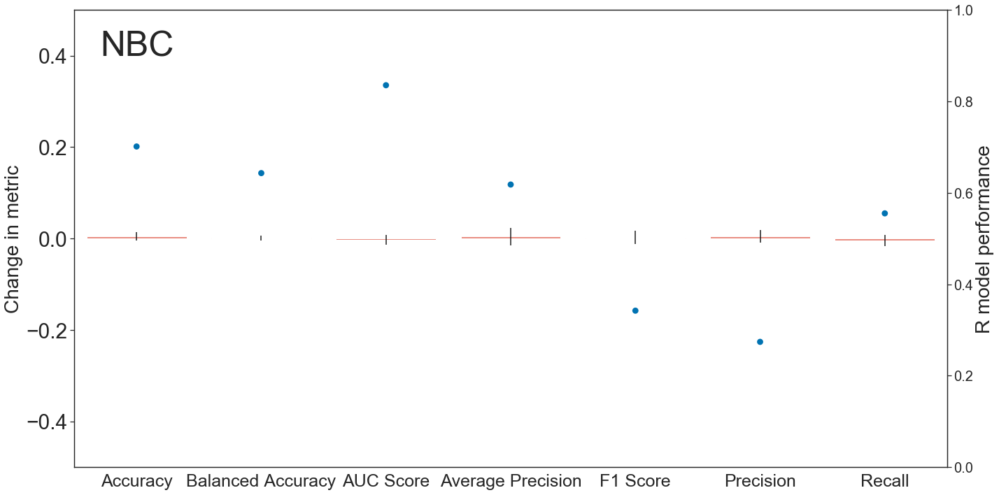

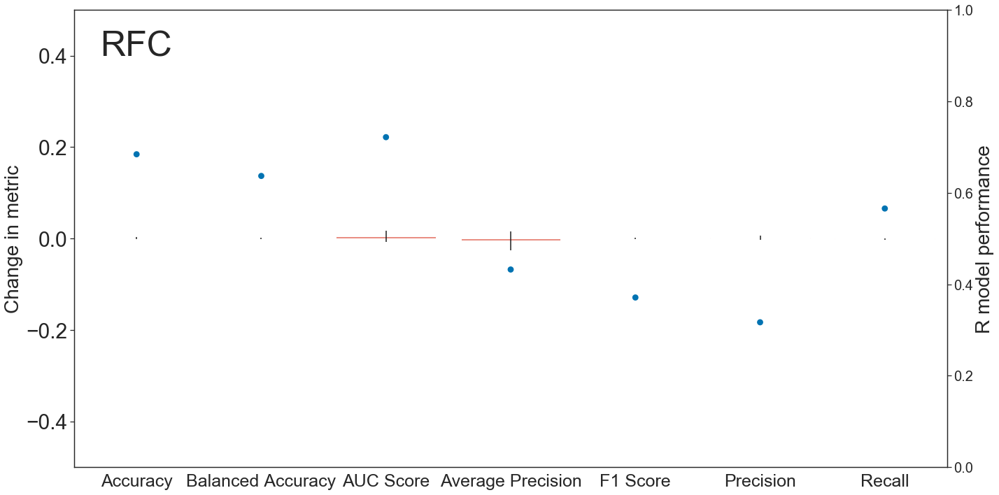

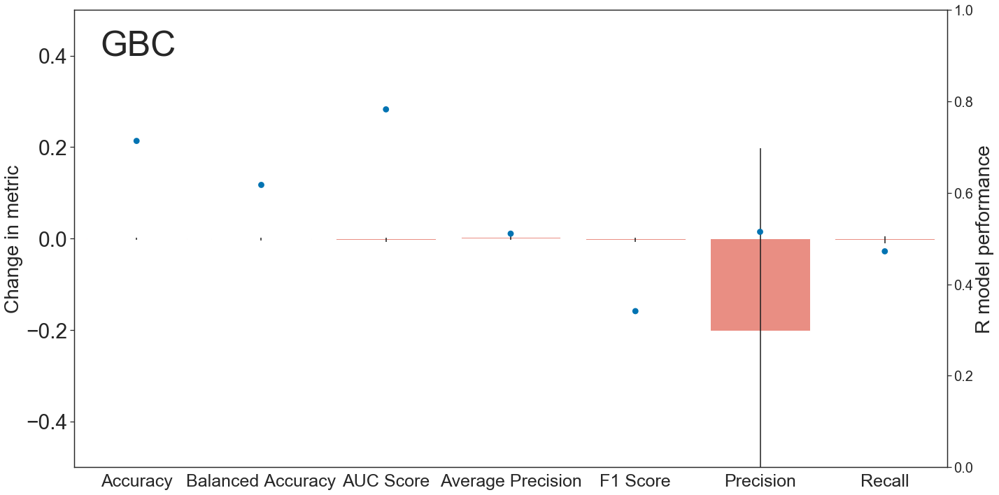

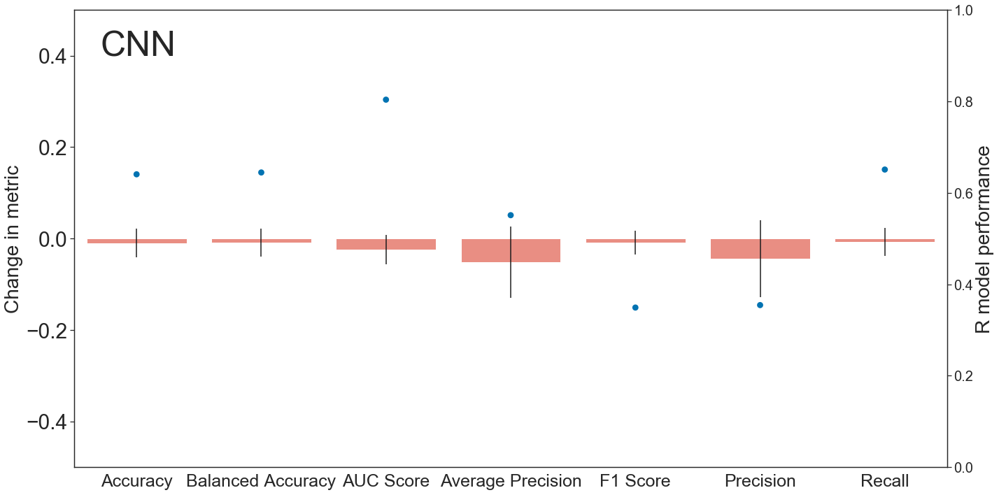

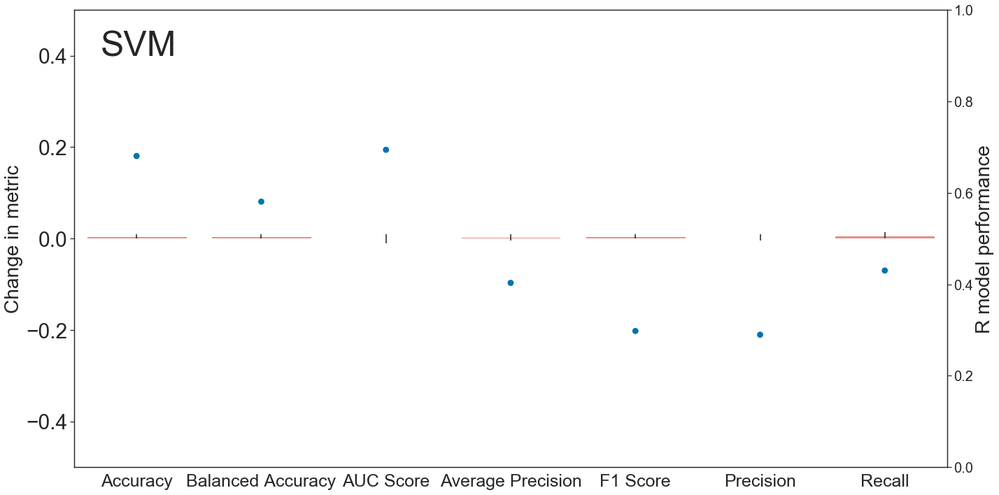

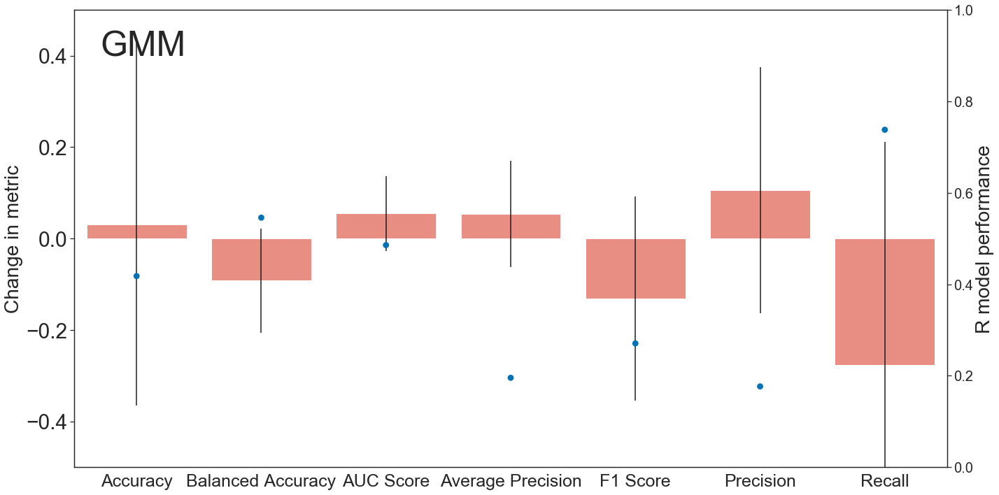

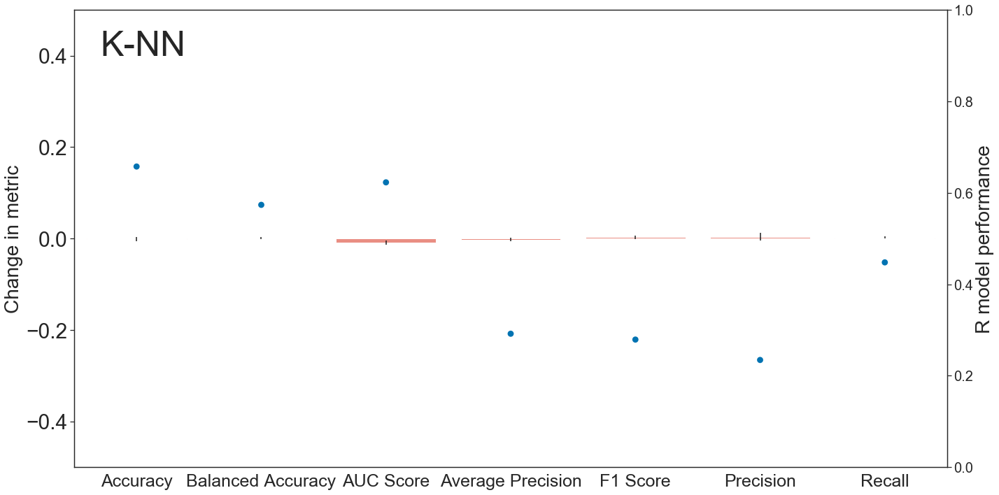

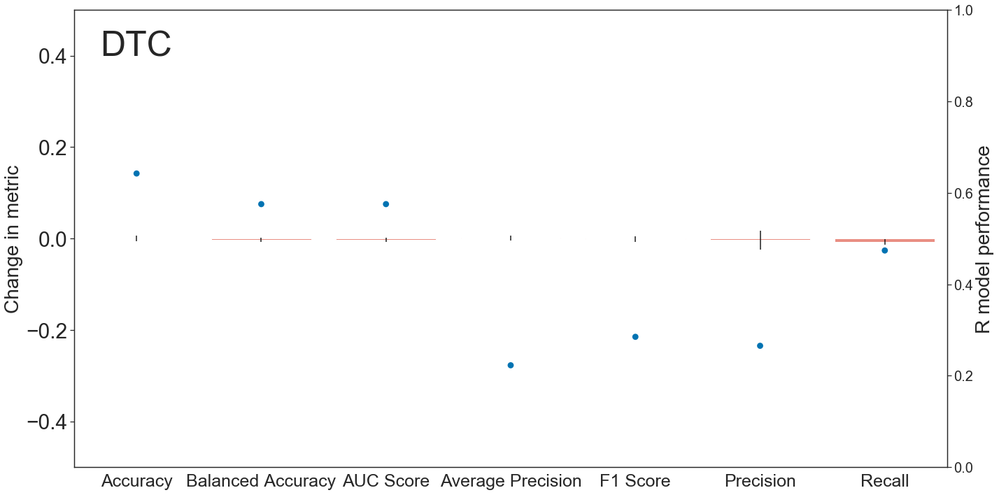

In [14]:
sns.set_style("white")
boop  = pd.DataFrame(data,columns=cols)
all_performances = []

#iterate through columns except first
for col in range(len(boop.iloc[0,:])-1):
    
    averages = []
    sigmas = []
    performances = []
    for row in range(len(boop.iloc[:,0])):
        averages.append(boop.iloc[row,col+1][0])
        sigmas.append(boop.iloc[row,col+1][1])
        performances.append(boop.iloc[row,col+1][2])
#         print(averages)
#         print(sigmas)
    plt.figure(figsize=(20,10))
    #plt.title(f"{models_list[col]}",fontsize='25')
    ax = plt.gca()
    plt.text(0.03, 0.9, translator[models_list[col]],fontsize='50',transform=ax.transAxes)
    plt.xticks(fontsize='25')
    plt.ylabel("Change in metric",fontsize='28')
    plt.ylim(-.5,.5)
    plt.yticks(fontsize='30')

    ax = plt.gca()
    ax2 = plt.twinx()
    ax2.tick_params(axis='y',labelsize='20')
    
    
    
    g = sns.barplot(x=metric_list,y=averages,yerr=sigmas,ax=ax,color='salmon')
    sns.pointplot(x=metric_list,y=performances,ax=ax2,join=False)
    
    all_performances.append(performances)
    
    # plt.legend()
    
    
    plt.ylabel("R model performance",fontsize='28')
    plt.ylim(0,1)
    plt.tight_layout()
    plt.show()

In [57]:
performances_df = pd.DataFrame(all_performances, index=boop.columns[1:], columns=metric_list).reset_index()
performances_df["index"] = [translator[i] for i in performances_df['index']]

In [58]:
melted_df = pd.melt(performances_df,id_vars="index",var_name="metric")

In [59]:
melted_df

,index,metric,value
0,NBC,Accuracy,0.7014
1,RFC,Accuracy,0.6844
2,GBC,Accuracy,0.7136
3,CNN,Accuracy,0.6406
4,SVM,Accuracy,0.6806
5,GMM,Accuracy,0.4180
6,K-NN,Accuracy,0.6576
7,DTC,Accuracy,0.6424
8,NBC,Balanced Accuracy,0.6432
9,RFC,Balanced Accuracy,0.6370


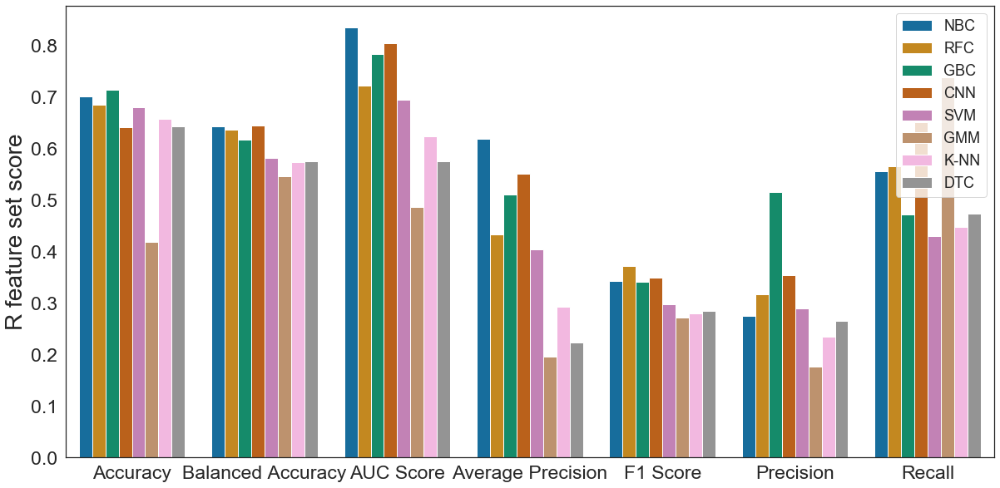

In [63]:
fig, ax = plt.subplots(figsize=(20,10))
sns.barplot(data=melted_df,x='metric',y='value',hue='index',ax=ax,palette='colorblind')
plt.xticks(fontsize='23')

plt.xlabel("")
plt.ylabel("R feature set score",fontsize='28')
plt.yticks(fontsize='23')
plt.legend(fontsize='18')

In [29]:
#initialize empty list for storing dataframe rows
data = []


#iterate through each metric
for metric in metric_list:
    #initialize empty list that will contain each row
    row = []
    
    
    row.append(f"∆{metric}")


    #iterate through each model
    for model in models_list:
        #get dataframe subset that only contains the given model
        model_df = leaderboard[leaderboard["Model Name"]==model]

        #separate between RS and R values
        RS_model_df = model_df[model_df["Data and Split Description"]=="RS"]
        R_model_df = model_df[model_df["Data and Split Description"]=="R"]

        #get difference in metric between each
        avg_diff = np.average(RS_model_df[metric].values - R_model_df[metric].values)
        
        
        std_diff = np.std(RS_model_df[metric].values - R_model_df[metric].values)
        row.append((avg_diff,std_diff))
        
    data.append(row)
    #data_raw.append(row_raw)

In [30]:
cols = models_list.tolist()
cols.insert(0,"∆Metric")

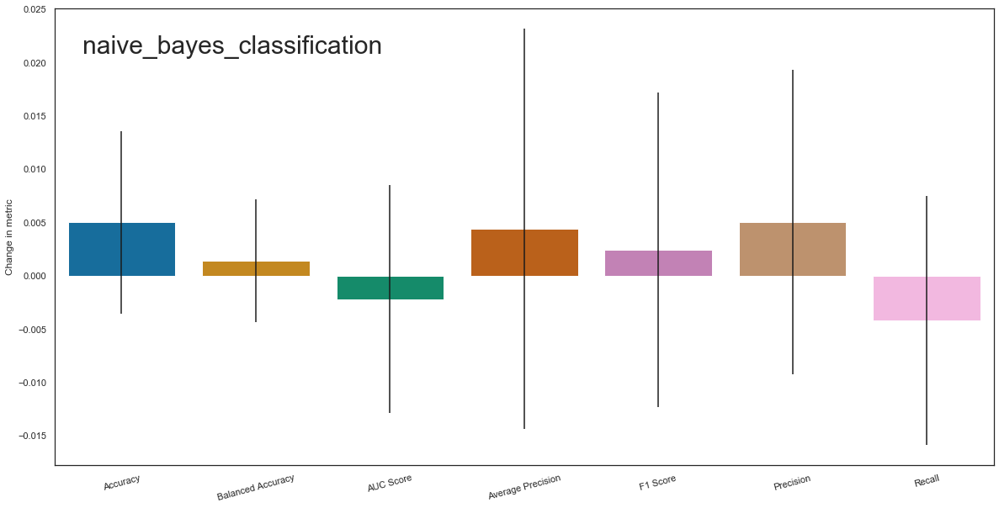

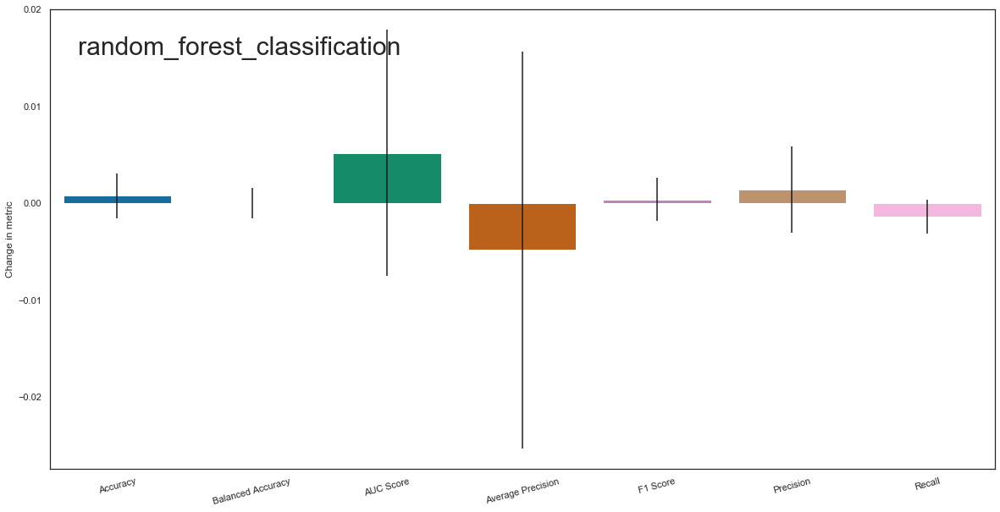

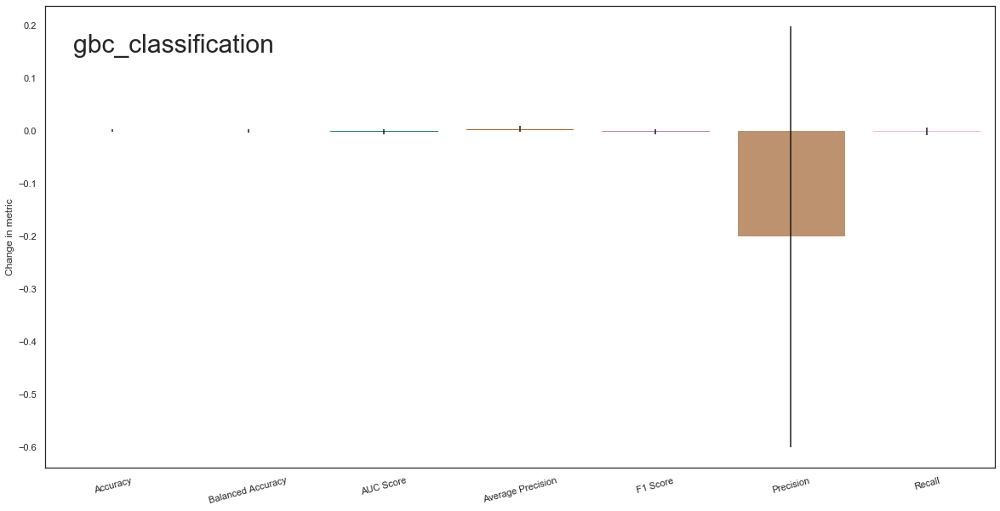

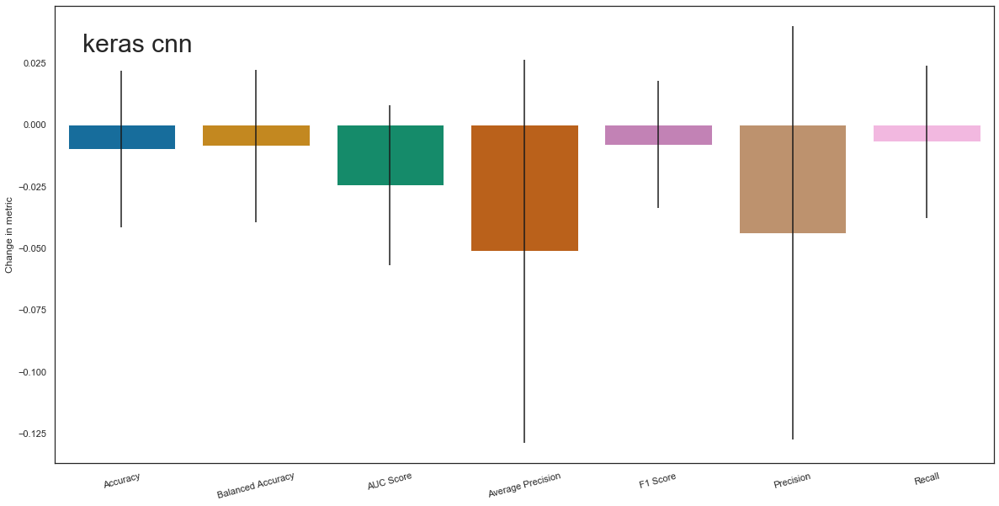

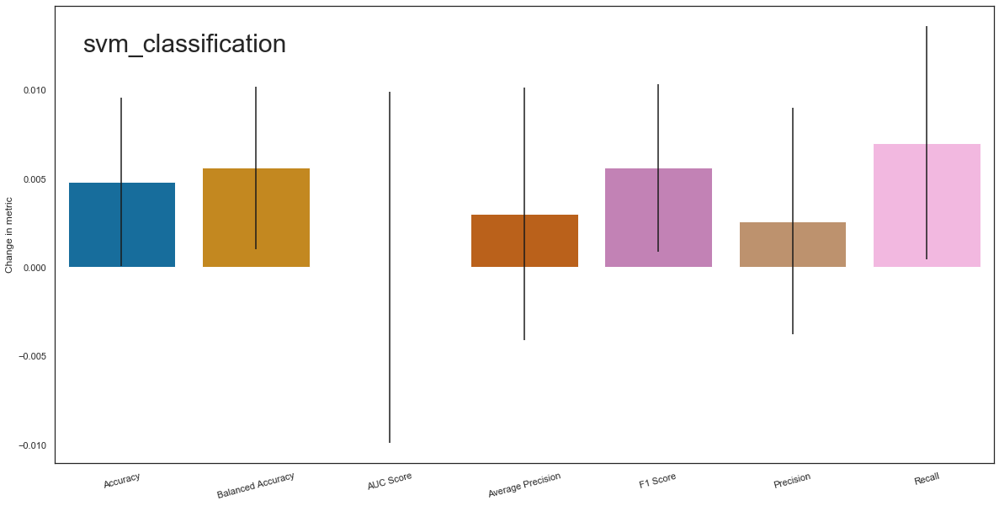

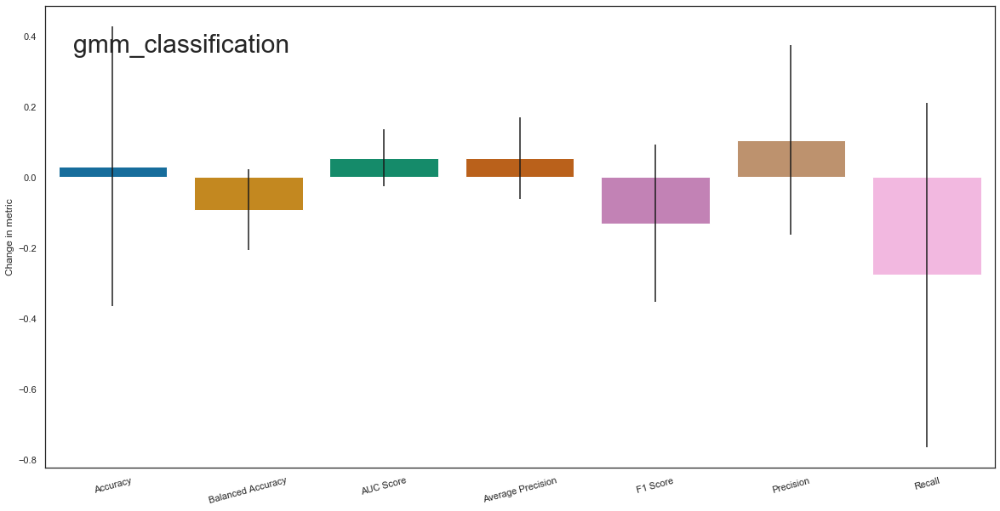

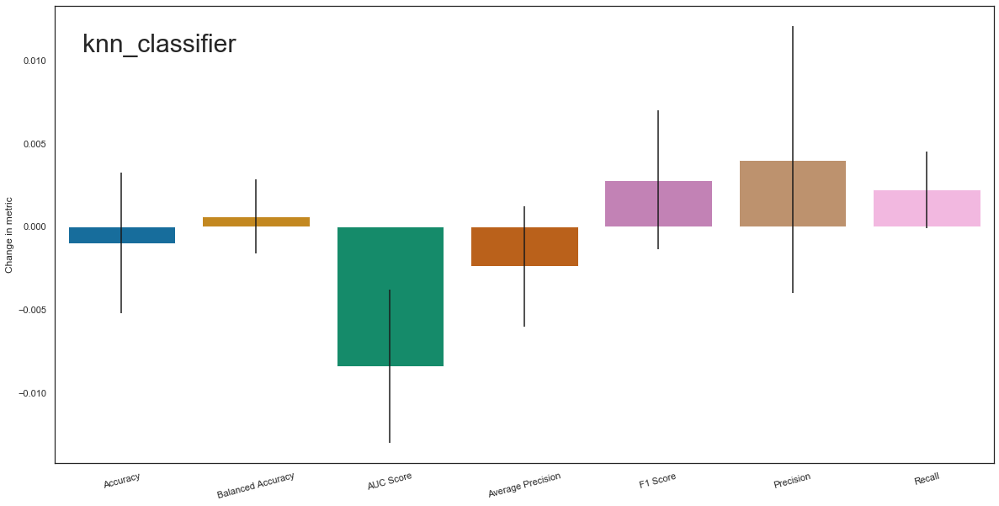

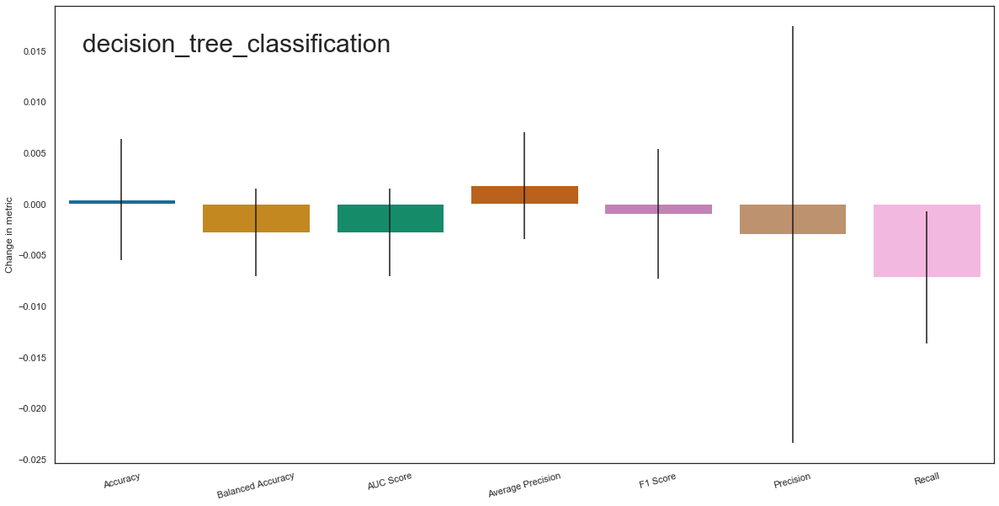

In [31]:
boop  = pd.DataFrame(data,columns=cols)

#iterate through columns except first
for col in range(len(boop.iloc[0,:])-1):
    
    averages = []
    sigmas = []
    for row in range(len(boop.iloc[:,0])):
        averages.append(boop.iloc[row,col+1][0])
        sigmas.append(boop.iloc[row,col+1][1])
#         print(averages)
#         print(sigmas)
    plt.figure(figsize=(20,10))
    ax = plt.gca()
    plt.text(0.03, 0.9, f"{models_list[col]}",fontsize="30",transform=ax.transAxes)
    sns.barplot(x=metric_list,y=averages,yerr=sigmas)
    plt.xticks(fontsize='11',rotation=15)
    plt.ylabel("Change in metric")
    plt.show()

In [32]:
boop  = pd.DataFrame(data,columns=cols)
x_l = [] 
a_l = []
s_l= []
n_l = []
#iterate through columns except first
for col in range(len(boop.columns)-1):
    #print(col)
    averages = []
    sigmas = []
    for row in range(len(boop.iloc[:,0])):
        averages.append(boop.iloc[row,col+1][0])
        sigmas.append(boop.iloc[row,col+1][1])
    
    x_l.append(metric_list)
    a_l.append(averages)
    s_l.append(sigmas)
    n_l.append([boop.columns[col+1]]*len(sigmas))
  

In [33]:
#leaderboard = pd.read_html("./data/test_harness_results/custom_classification_leaderboard.html")[0]
leaderboard = pd.read_html("./data/cross_val_test_harness_ROCKLIN.html")[0]
leaderboard = leaderboard.replace('__init__','keras cnn')
metric_list = ['Accuracy','Balanced Accuracy','AUC Score',
            'Average Precision','F1 Score','Precision','Recall']
models_list = leaderboard['Model Name'].unique()

In [34]:
#initialize empty list for storing dataframe rows
data_raw = []

#iterate through each metric
for metric in metric_list:
    #initialize empty list that will contain each row
    row_raw = []
    
    

    #iterate through each model
    for model in models_list:
        #get dataframe subset that only contains the given model
        model_df = leaderboard[leaderboard["Model Name"]==model]

        #separate between RS and R values
        RS_model_df = model_df[model_df["Data and Split Description"]=="RS"]
        R_model_df = model_df[model_df["Data and Split Description"]=="R"]

        #get difference in metric between each
        raw_diff = RS_model_df[metric].values - R_model_df[metric].values
        
        #print(f"{len(raw_diff)}-instances for {metric} in {model} model")

        #row_raw.append([[f"∆{metric}"]]*len(raw_diff))
        a = [[f"{metric}"]]*len(raw_diff)
        b = raw_diff.reshape(-1,1)
        c = [[f"{model}"]]*len(raw_diff)
        d = np.concatenate([a,b,c],axis=1)
        
        
        
        for di in d:
            data_raw.append(di)
        


cols = ["Metric","Score","Model Name"]

df_raw = pd.DataFrame(data_raw, columns=cols)
df_raw["Score"] = df_raw["Score"].map(float)

In [35]:
new_vector = []

#flatten the list of averages
flat_list_metric = [item for sublist in x_l for item in sublist]
flat_list_avg = [item for sublist in a_l for item in sublist]
flat_list_std = [item for sublist in s_l for item in sublist]
flat_list_names = [item for sublist in n_l for item in sublist]
    

for group in zip(
                    flat_list_metric,
                    flat_list_names, 
                    flat_list_avg, 
                    flat_list_std
                ):
    new_vector.append(list(group))
df = pd.DataFrame(new_vector,columns=["Metric","Model","Average","Err"])
translator = {
    "svm_classification":"SVM",
    "random_forest_classification":"RFC",
    'keras cnn':"CNN",
    "gbc_classification":"GBC",
    "knn_classifier":"K-NN",
    "naive_bayes_classification":"NBC",
    "decision_tree_classification":"DTC",
    "gmm_classification":"GMM"
    
}
df["Model"] = [translator[i] for i in df["Model"].values]
df_raw["Model Name"] = [translator[i] for i in df_raw["Model Name"].values]

In [45]:
sub_metrics = ["AUC Score","Balanced Accuracy","F1 Score"]
inx_sub = [df["Metric"][i] in sub_metrics for i in range(len(df["Metric"]))]

In [50]:
inx_sub_raw = [df_raw["Metric"][i] in sub_metrics for i in range(len(df_raw["Metric"]))]

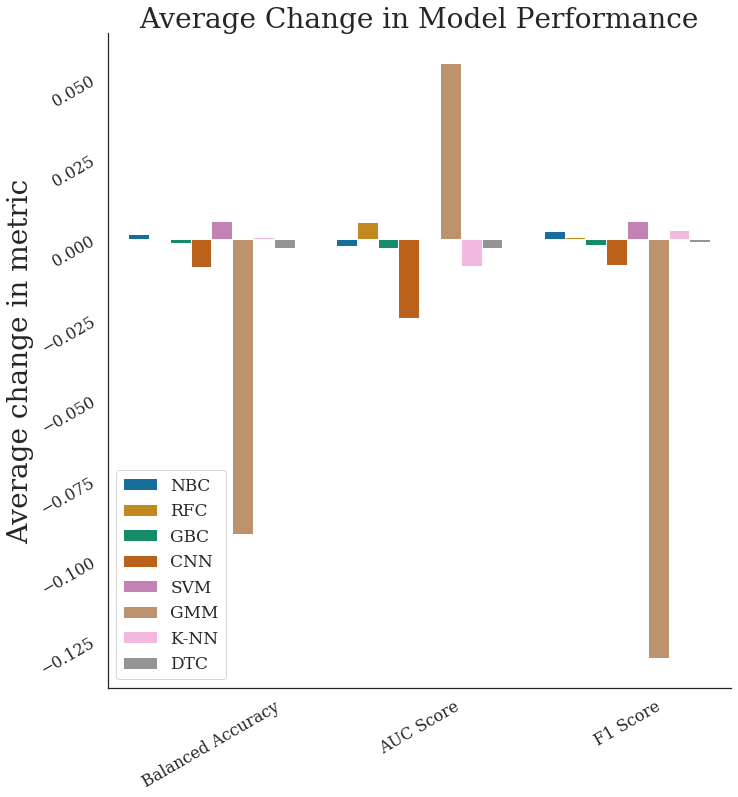

In [47]:
sns.set_style("white")
plt.rc('font', family='serif') # change font types for plots
plt.rc('xtick', labelsize='medium')
plt.rc('ytick', labelsize='medium')
g = sns.catplot(x="Metric",y="Average",hue="Model",data=df.iloc[inx_sub],kind='bar',palette="colorblind",
                size=10,legend_out=False,ci=95)
g.axes[0,0].set_title("Average Change in Model Performance",fontsize="28")
g.axes[0,0].tick_params(axis='both', which='major', labelsize=16,rotation=30)
g.axes[0,0].set_xlabel("")
g.axes[0,0].set_ylabel("Average change in metric",fontsize='28')
g.axes[0,0].legend(fontsize='17')



#plt.savefig("Figure4",dpi=600,bbox_inches="tight")
plt.show()

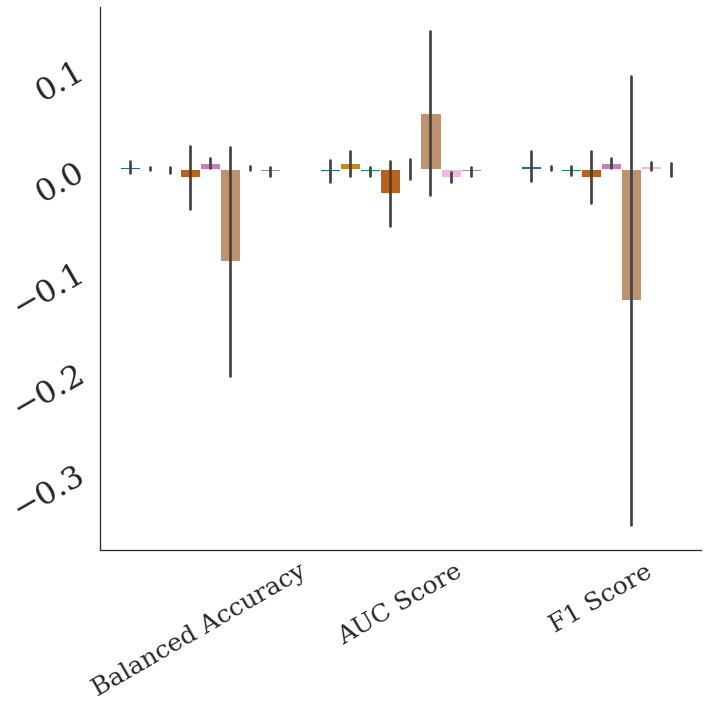

In [51]:
sns.set_style("white")
plt.rc('font', family='serif') # change font types for plots
plt.rc('xtick', labelsize='medium')
plt.rc('ytick', labelsize='medium')
g = sns.catplot(x="Metric",y="Score",hue="Model Name",data=df_raw.iloc[inx_sub_raw],kind='bar',palette="colorblind",
                size=10,legend_out=False,ci="sd")
g.axes[0,0].set_title("Average Change in Model Performance",fontsize="28")
g.axes[0,0].tick_params(axis='both', which='major', labelsize=16,rotation=30)
g.axes[0,0].set_xlabel("")
g.axes[0,0].set_ylabel("")
g.axes[0,0].legend().remove()
plt.title("")

plt.yticks(fontsize='32')
plt.xticks(fontsize='25')
plt.tight_layout()
#plt.savefig("./SavedFigures/Figure4_v2_inset",dpi=600,bbox_inches="tight")
plt.show()

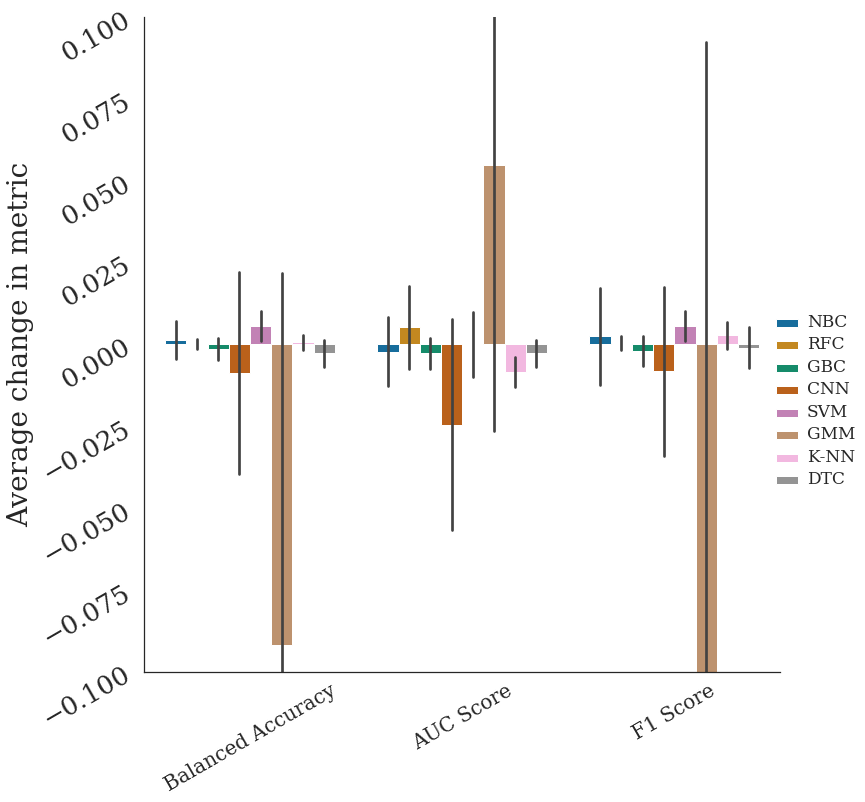

In [52]:
sns.set_style("white")
plt.rc('font', family='serif') # change font types for plots
plt.rc('xtick', labelsize='medium')
plt.rc('ytick', labelsize='medium')
g = sns.catplot(x="Metric",y="Score",hue="Model Name",data=df_raw.iloc[inx_sub_raw],kind='bar',palette="colorblind",
                size=10,legend_out=True,ci='sd')
g.axes[0,0].set_title("Average Change in Model Performance",fontsize="28")
g.axes[0,0].tick_params(axis='both', which='major', labelsize=16,rotation=30)
g.axes[0,0].set_xlabel("")
g.axes[0,0].set_ylabel("Average change in metric",fontsize='28')
plt.ylim(-.1,.1)
g._legend.set_title("")

plt.setp(g._legend.get_texts(), fontsize='17')

plt.title("")
plt.yticks(fontsize='26')
plt.xticks(fontsize='20')

#plt.savefig("./SavedFigures/Figure4_v2",dpi=600,bbox_inches="tight")

plt.show()

In [19]:
#get the average results for each model for each metric
model_averages = []
vectors = []
for model in models_list:
    model_df = leaderboard[leaderboard["Model Name"]==model]
    for metric in metric_list:
        #print(model, metric, model_df[metric].mean())
        vectors.append([model,metric,model_df[metric].mean()])
averages_df = pd.DataFrame(vectors,columns=["model","metric","score"])

averages_df.T

,0,1,2,3,4,5,6,7,8,9,...,46,47,48,49,50,51,52,53,54,55
model,naive_bayes_classification,naive_bayes_classification,naive_bayes_classification,naive_bayes_classification,naive_bayes_classification,naive_bayes_classification,naive_bayes_classification,random_forest_classification,random_forest_classification,random_forest_classification,...,knn_classifier,knn_classifier,knn_classifier,decision_tree_classification,decision_tree_classification,decision_tree_classification,decision_tree_classification,decision_tree_classification,decision_tree_classification,decision_tree_classification
metric,Accuracy,Balanced Accuracy,AUC Score,Average Precision,F1 Score,Precision,Recall,Accuracy,Balanced Accuracy,AUC Score,...,F1 Score,Precision,Recall,Accuracy,Balanced Accuracy,AUC Score,Average Precision,F1 Score,Precision,Recall
score,0.732667,0.6548,0.809667,0.578333,0.347933,0.292867,0.5372,0.7082,0.644867,0.7162,...,0.291333,0.269,0.4338,0.667733,0.583733,0.583733,0.2286,0.292667,0.267533,0.457


## Longxing (Classification)
* results for a 5-fold cross validated run which includes all topologies within the Longxing dataset

In [20]:
#leaderboard = pd.read_html("./data/test_harness_results/custom_classification_leaderboard.html")[0]
leaderboard = pd.read_html("./data/cross_val_test_harness_LONGXING.html")[0]
leaderboard = leaderboard.replace('__init__','keras cnn')
metric_list = ['Accuracy','Balanced Accuracy','AUC Score',
            'Average Precision','F1 Score','Precision','Recall']
models_list = leaderboard['Model Name'].unique()

In [21]:
#initialize empty list for storing dataframe rows
data = []


#iterate through each metric
for metric in metric_list:
    #initialize empty list that will contain each row
    row = []
    
    
    row.append(f"∆{metric}")


    #iterate through each model
    for model in models_list:
        #get dataframe subset that only contains the given model
        model_df = leaderboard[leaderboard["Model Name"]==model]

        #separate between RS and R values
        RS_model_df = model_df[model_df["Data and Split Description"]=="RS"]
        R_model_df = model_df[model_df["Data and Split Description"]=="R"]

        #get difference in metric between each
        avg_diff = np.average(RS_model_df[metric].values - R_model_df[metric].values)
        
        
        std_diff = np.std(RS_model_df[metric].values - R_model_df[metric].values)
        row.append((avg_diff,std_diff))
        
    data.append(row)
    #data_raw.append(row_raw)


cols = models_list.tolist()
cols.insert(0,"∆Metric")

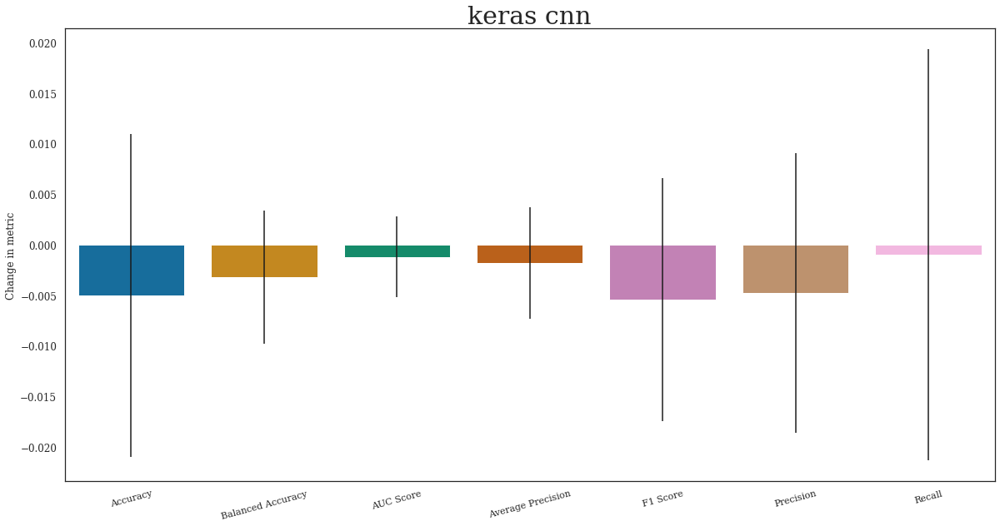

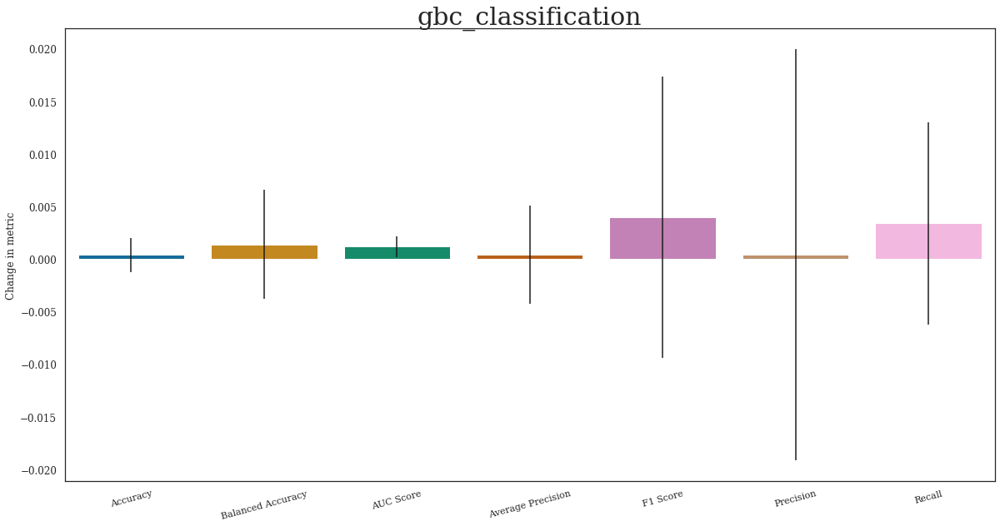

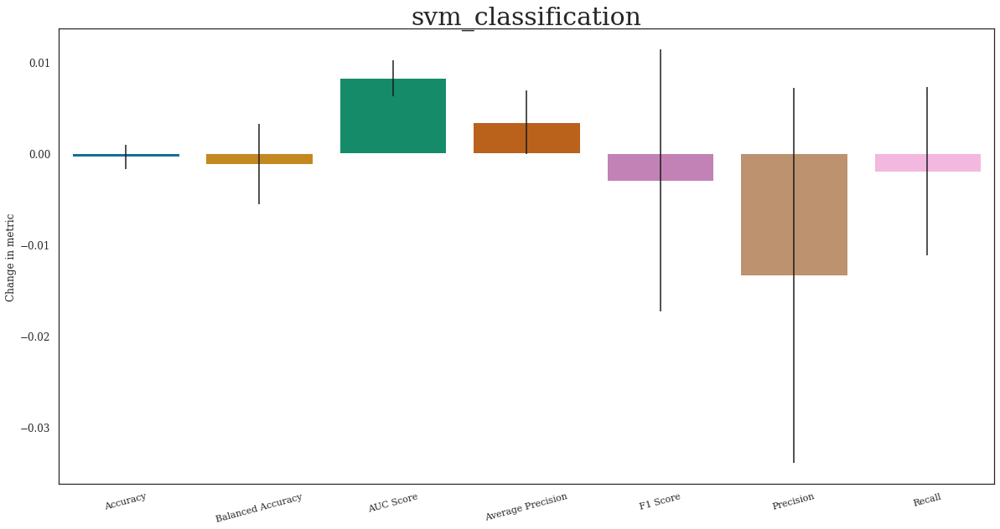

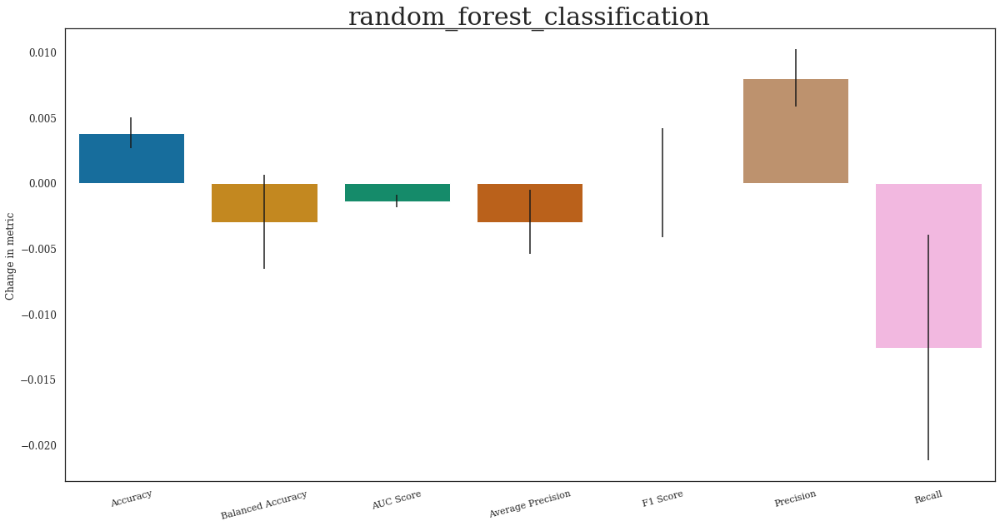

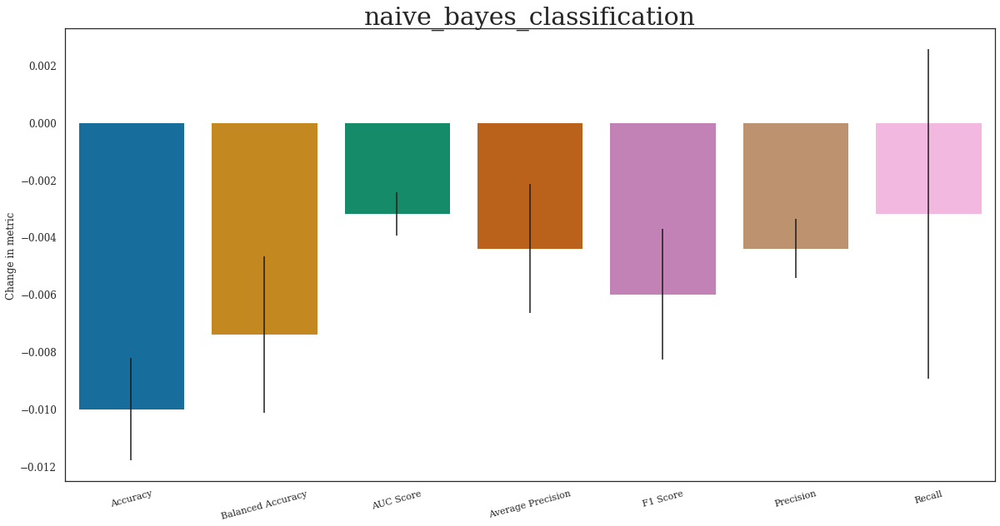

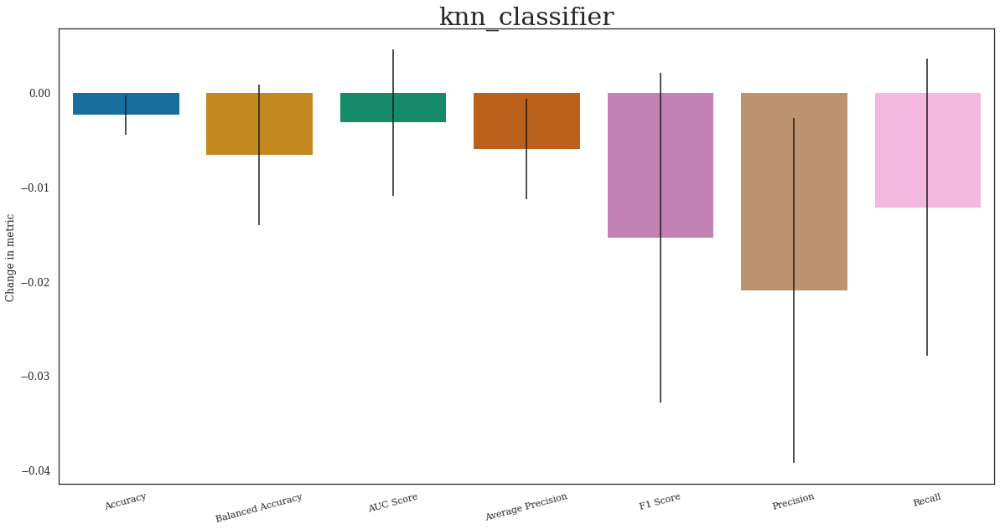

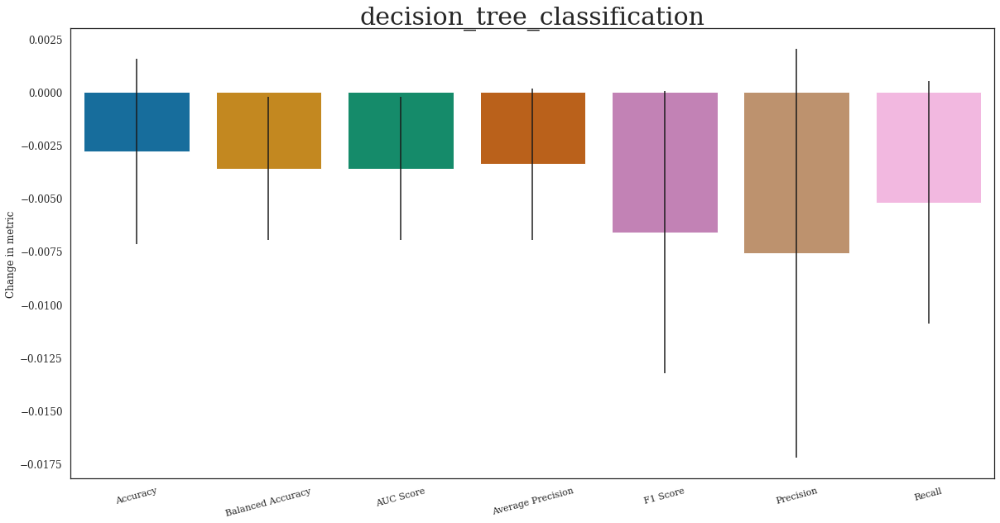

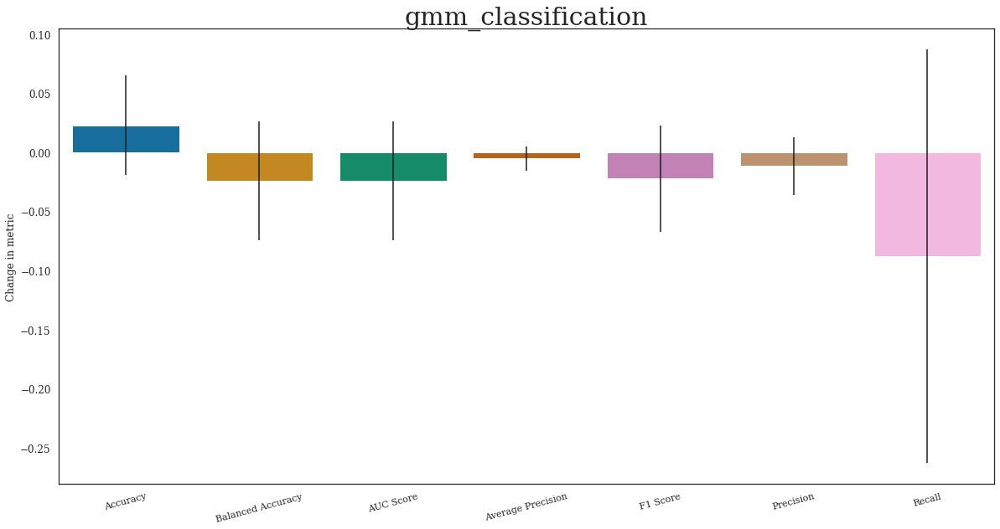

In [22]:
boop  = pd.DataFrame(data,columns=cols)

#iterate through columns except first
for col in range(len(boop.iloc[0,:])-1):
    
    averages = []
    sigmas = []
    for row in range(len(boop.iloc[:,0])):
        averages.append(boop.iloc[row,col+1][0])
        sigmas.append(boop.iloc[row,col+1][1])
#         print(averages)
#         print(sigmas)
    plt.figure(figsize=(20,10))
    plt.title(f"{models_list[col]}",fontsize="30")
    sns.barplot(x=metric_list,y=averages,yerr=sigmas)
    plt.xticks(fontsize='11',rotation=15)
    plt.ylabel("Change in metric")
    plt.show()

In [23]:
boop  = pd.DataFrame(data,columns=cols)
x_l = [] 
a_l = []
s_l= []
n_l = []
#iterate through columns except first
for col in range(len(boop.columns)-1):
    #print(col)
    averages = []
    sigmas = []
    for row in range(len(boop.iloc[:,0])):
        averages.append(boop.iloc[row,col+1][0])
        sigmas.append(boop.iloc[row,col+1][1])
    
    x_l.append(metric_list)
    a_l.append(averages)
    s_l.append(sigmas)
    n_l.append([boop.columns[col+1]]*len(sigmas))
  

In [24]:
leaderboard = pd.read_html("./data/cross_val_test_harness_LONGXING.html")[0]
leaderboard = leaderboard.replace('__init__','keras cnn')
metric_list = ['Accuracy','Balanced Accuracy','AUC Score',
            'Average Precision','F1 Score','Precision','Recall']
models_list = leaderboard['Model Name'].unique()

In [25]:
#initialize empty list for storing dataframe rows
data_raw = []

#iterate through each metric
for metric in metric_list:
    #initialize empty list that will contain each row
    row_raw = []
    
    

    #iterate through each model
    for model in models_list:
        #get dataframe subset that only contains the given model
        model_df = leaderboard[leaderboard["Model Name"]==model]

        #separate between RS and R values
        RS_model_df = model_df[model_df["Data and Split Description"]=="RS"]
        R_model_df = model_df[model_df["Data and Split Description"]=="R"]

        #get difference in metric between each
        raw_diff = RS_model_df[metric].values - R_model_df[metric].values
        
        #print(f"{len(raw_diff)}-instances for {metric} in {model} model")

        #row_raw.append([[f"∆{metric}"]]*len(raw_diff))
        a = [[f"{metric}"]]*len(raw_diff)
        b = raw_diff.reshape(-1,1)
        c = [[f"{model}"]]*len(raw_diff)
        d = np.concatenate([a,b,c],axis=1)
        
        
        
        for di in d:
            data_raw.append(di)
        

cols = ["Metric","Score","Model Name"]

df_raw = pd.DataFrame(data_raw, columns=cols)
df_raw["Score"] = df_raw["Score"].map(float)

In [26]:
new_vector = []

#flatten the list of averages
flat_list_metric = [item for sublist in x_l for item in sublist]
flat_list_avg = [item for sublist in a_l for item in sublist]
flat_list_std = [item for sublist in s_l for item in sublist]
flat_list_names = [item for sublist in n_l for item in sublist]
    

for group in zip(
                    flat_list_metric,
                    flat_list_names, 
                    flat_list_avg, 
                    flat_list_std
                ):
    new_vector.append(list(group))
df = pd.DataFrame(new_vector,columns=["Metric","Model","Average","Err"])
translator = {
    "svm_classification":"SVM",
    "random_forest_classification":"RFC",
    'keras cnn':"CNN",
    "gbc_classification":"GBC",
    "knn_classifier":"K-NN",
    "naive_bayes_classification":"NBC",
    "decision_tree_classification":"DTC",
    "gmm_classification":"GMM"
    
}
df["Model"] = [translator[i] for i in df["Model"].values]
df_raw["Model Name"] = [translator[i] for i in df_raw["Model Name"].values]

/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:3695: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


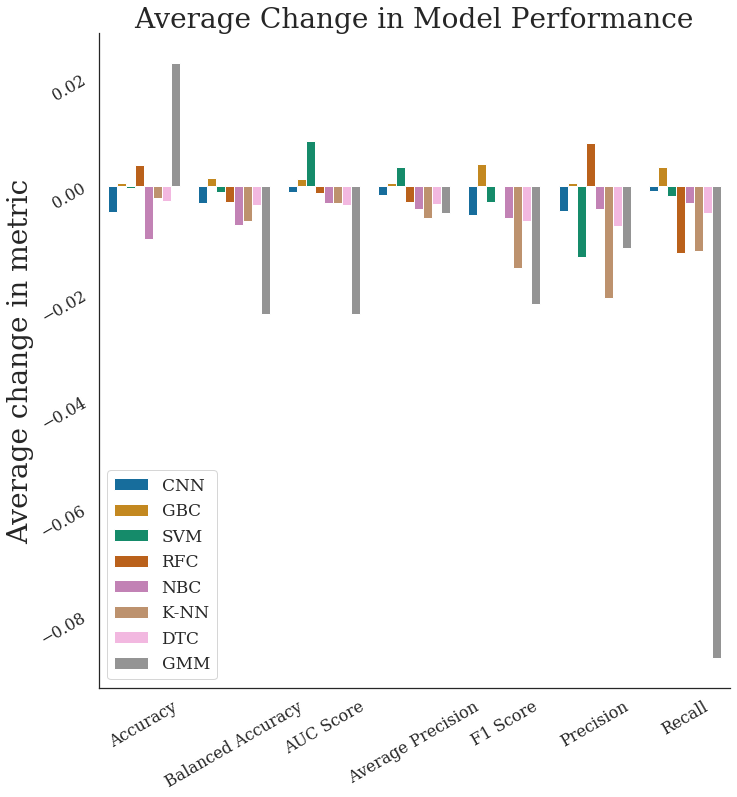

In [27]:
sns.set_style("white")
plt.rc('font', family='serif') # change font types for plots
plt.rc('xtick', labelsize='medium')
plt.rc('ytick', labelsize='medium')
g = sns.catplot(x="Metric",y="Average",hue="Model",data=df,kind='bar',palette="colorblind",
                size=10,legend_out=False,ci=95)

#plt.ylim(-.050,0.050)


g.axes[0,0].set_title("Average Change in Model Performance",fontsize="28")
g.axes[0,0].tick_params(axis='both', which='major', labelsize=16,rotation=30)
g.axes[0,0].set_xlabel("")
g.axes[0,0].set_ylabel("Average change in metric",fontsize='28')
g.axes[0,0].legend(fontsize='17')



#plt.savefig("Figure4",dpi=600,bbox_inches="tight")
plt.show()

/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:3695: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


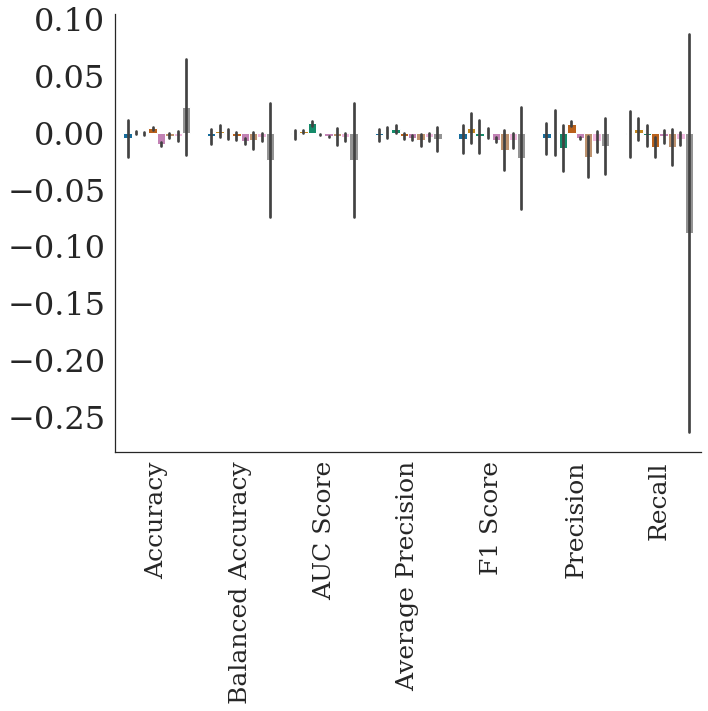

In [28]:
sns.set_style("white")
plt.rc('font', family='serif') # change font types for plots
plt.rc('xtick', labelsize='medium')
plt.rc('ytick', labelsize='medium')
g = sns.catplot(x="Metric",y="Score",hue="Model Name",data=df_raw,kind='bar',palette="colorblind",
                size=10,legend_out=False,ci="sd")
g.axes[0,0].set_title("Average Change in Model Performance",fontsize="28")
g.axes[0,0].tick_params(axis='both', which='major', labelsize=16,rotation=30)
g.axes[0,0].set_xlabel("")
g.axes[0,0].set_ylabel("")
g.axes[0,0].legend().remove()
plt.title("")

plt.yticks(fontsize='32',rotation=0)
plt.xticks(fontsize='25',rotation=90)
plt.tight_layout()
#plt.savefig("./SavedFigures/Figure4_v2_inset",dpi=600,bbox_inches="tight")
plt.show()

/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:3695: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


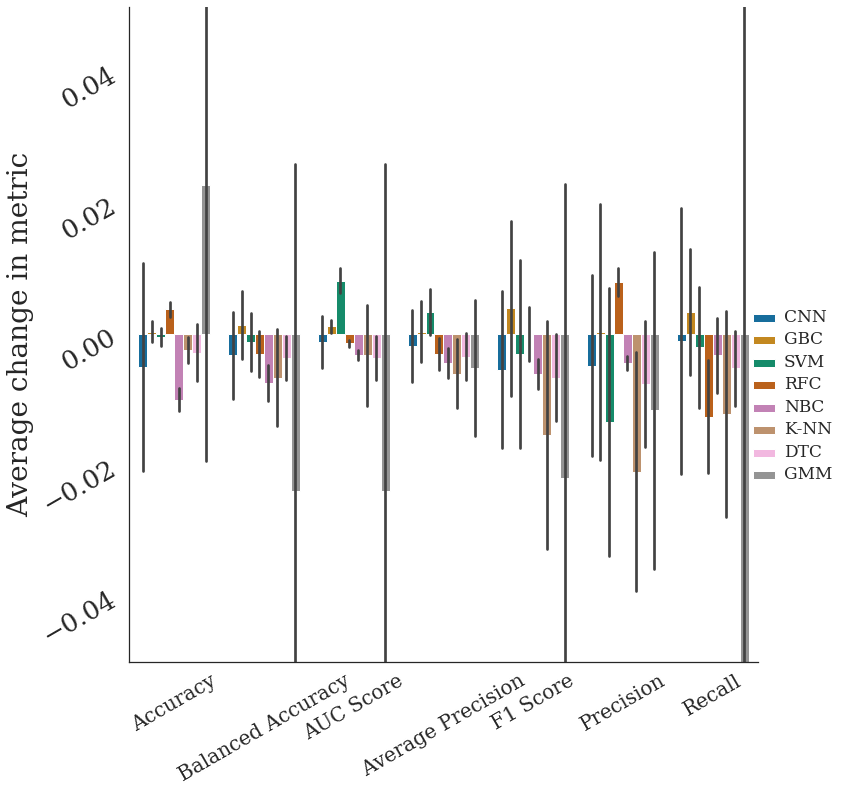

In [29]:
sns.set_style("white")
plt.rc('font', family='serif') # change font types for plots
plt.rc('xtick', labelsize='medium')
plt.rc('ytick', labelsize='medium')
g = sns.catplot(x="Metric",y="Score",hue="Model Name",data=df_raw,kind='bar',palette="colorblind",
                size=10,legend_out=True,ci='sd')
g.axes[0,0].set_title("Average Change in Model Performance",fontsize="28")
g.axes[0,0].tick_params(axis='both', which='major', labelsize=16,rotation=30)
g.axes[0,0].set_xlabel("")
g.axes[0,0].set_ylabel("Average change in metric",fontsize='28')
plt.ylim(-.050,.050)
g._legend.set_title("")

plt.setp(g._legend.get_texts(), fontsize='17')

plt.title("")
plt.yticks(fontsize='26')
plt.xticks(fontsize='20')

#plt.savefig("./SavedFigures/Figure4_v2",dpi=600,bbox_inches="tight")

plt.show()

In [28]:
#get the average results for each model for each metric
model_averages = []
vectors = []
for model in models_list:
    model_df = leaderboard[leaderboard["Model Name"]==model]
    for metric in metric_list:
        #print(model, metric, model_df[metric].mean())
        vectors.append([model,metric,model_df[metric].mean()])
averages_df = pd.DataFrame(vectors,columns=["model","metric","score"])

averages_df.T

,0,1,2,3,4,5,6,7,8,9,...,46,47,48,49,50,51,52,53,54,55
model,keras cnn,keras cnn,keras cnn,keras cnn,keras cnn,keras cnn,keras cnn,gbc_classification,gbc_classification,gbc_classification,...,decision_tree_classification,decision_tree_classification,decision_tree_classification,gmm_classification,gmm_classification,gmm_classification,gmm_classification,gmm_classification,gmm_classification,gmm_classification
metric,Accuracy,Balanced Accuracy,AUC Score,Average Precision,F1 Score,Precision,Recall,Accuracy,Balanced Accuracy,AUC Score,...,F1 Score,Precision,Recall,Accuracy,Balanced Accuracy,AUC Score,Average Precision,F1 Score,Precision,Recall
score,0.6718,0.7146,0.780867,0.374133,0.396533,0.269333,0.772667,0.8748,0.5598,0.7726,...,0.2606,0.250333,0.272333,0.507533,0.501,0.5048,0.135467,0.196133,0.123667,0.4924


## Rocklin+Longxing (Classification)
* 5-fold cross validation including both Rocklin and Longxing datasets

In [30]:
#leaderboard = pd.read_html("./data/test_harness_results/custom_classification_leaderboard.html")[0]
leaderboard = pd.read_html("./data/cross_val_test_harness_RocklinLongxing.html")[0]
leaderboard = leaderboard.replace('__init__','keras cnn')
metric_list = ['Accuracy','Balanced Accuracy','AUC Score',
            'Average Precision','F1 Score','Precision','Recall']
models_list = leaderboard['Model Name'].unique()

In [31]:
#initialize empty list for storing dataframe rows
data = []


#iterate through each metric
for metric in metric_list:
    #initialize empty list that will contain each row
    row = []
    
    
    row.append(f"∆{metric}")


    #iterate through each model
    for model in models_list:
        #get dataframe subset that only contains the given model
        model_df = leaderboard[leaderboard["Model Name"]==model]

        #separate between RS and R values
        RS_model_df = model_df[model_df["Data and Split Description"]=="RS"]
        R_model_df = model_df[model_df["Data and Split Description"]=="R"]

        #get difference in metric between each
        avg_diff = np.average(RS_model_df[metric].values - R_model_df[metric].values)
        
        
        std_diff = np.std(RS_model_df[metric].values - R_model_df[metric].values)
        row.append((avg_diff,std_diff))
        
    data.append(row)
    #data_raw.append(row_raw)

cols = models_list.tolist()
cols.insert(0,"∆Metric")

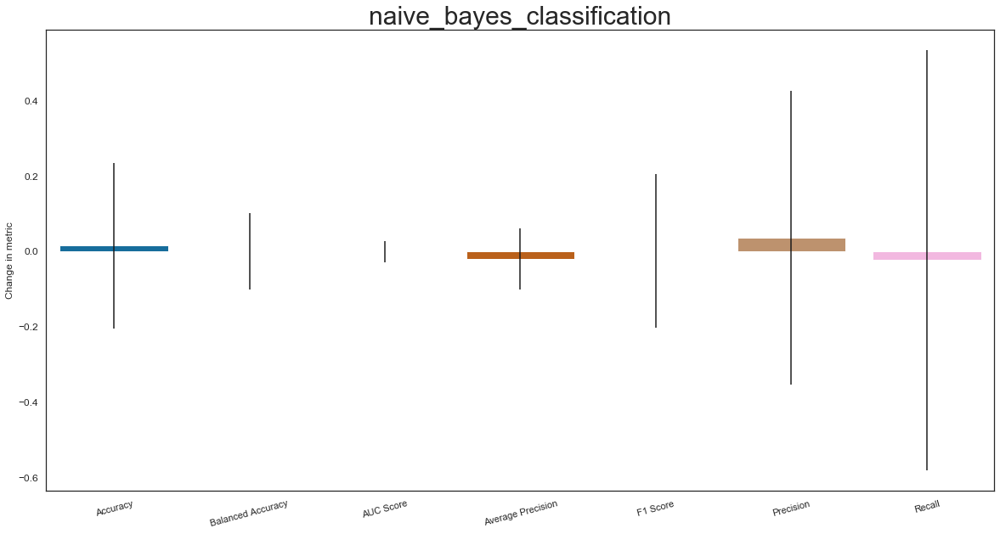

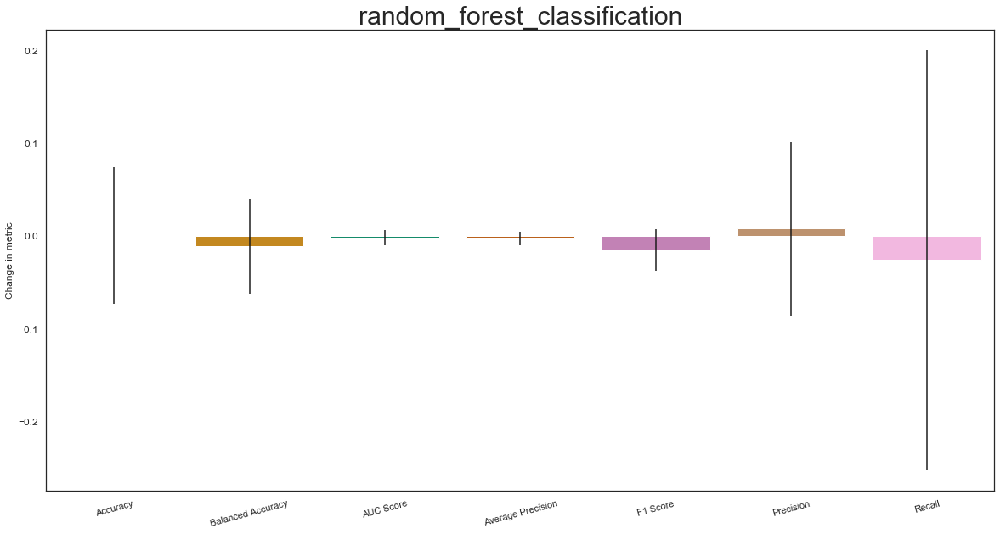

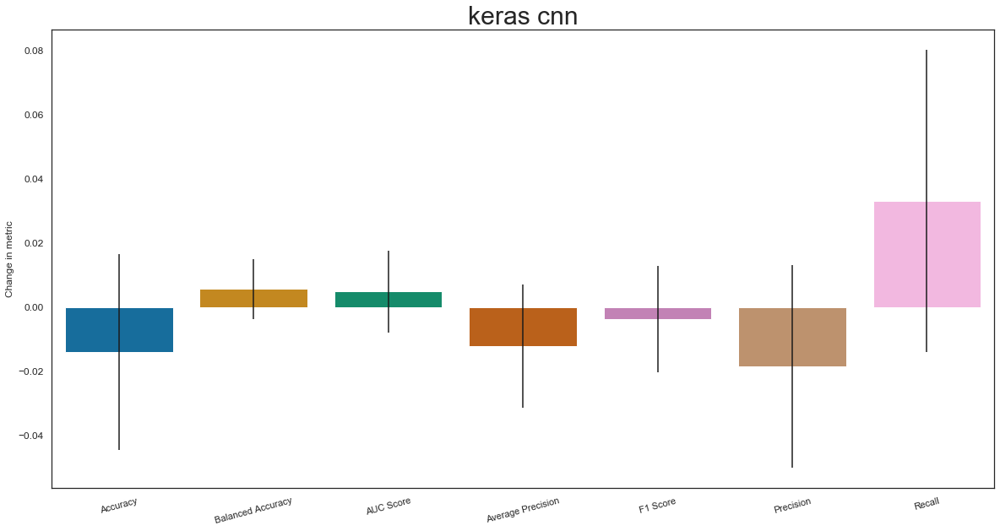

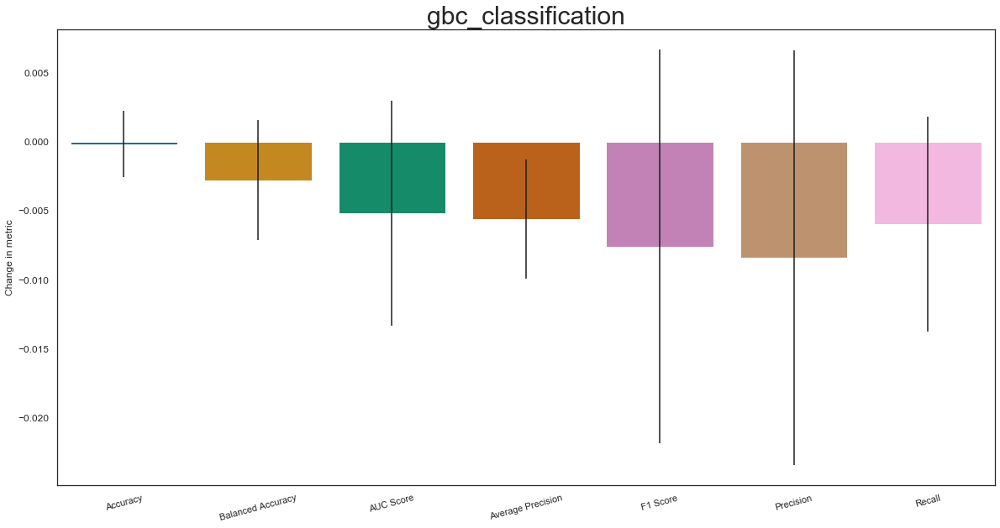

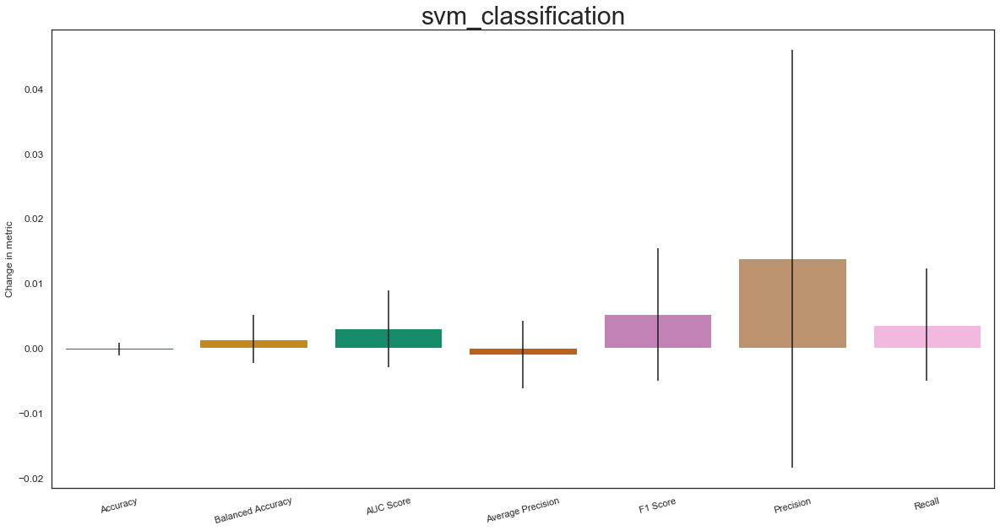

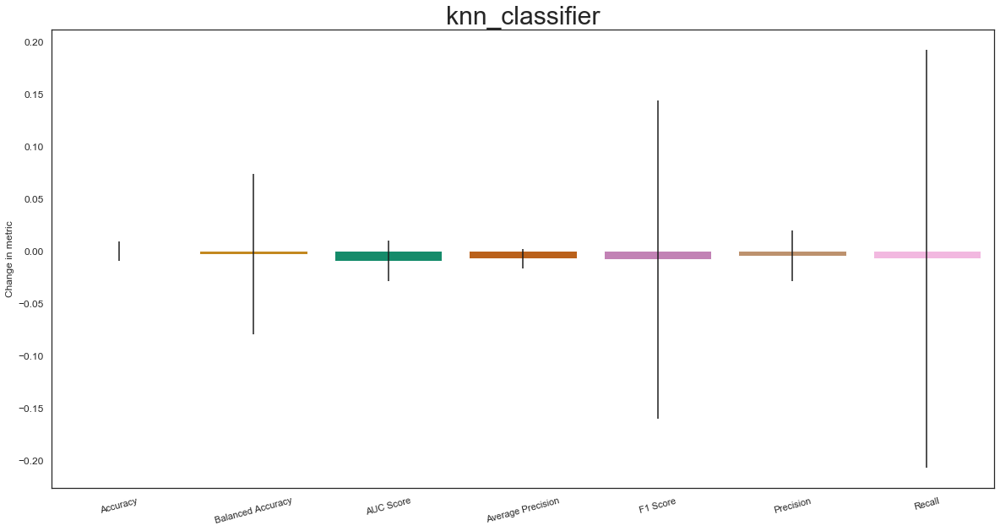

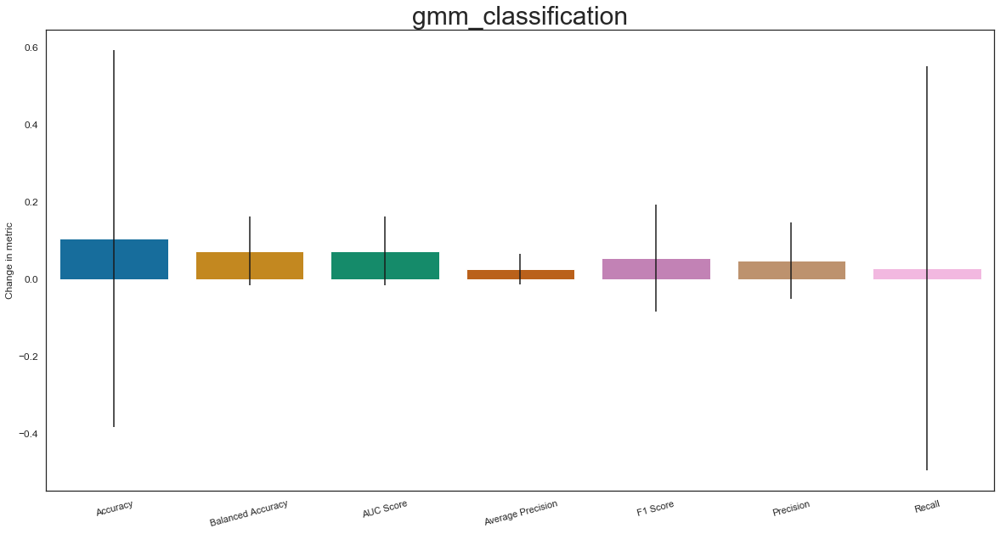

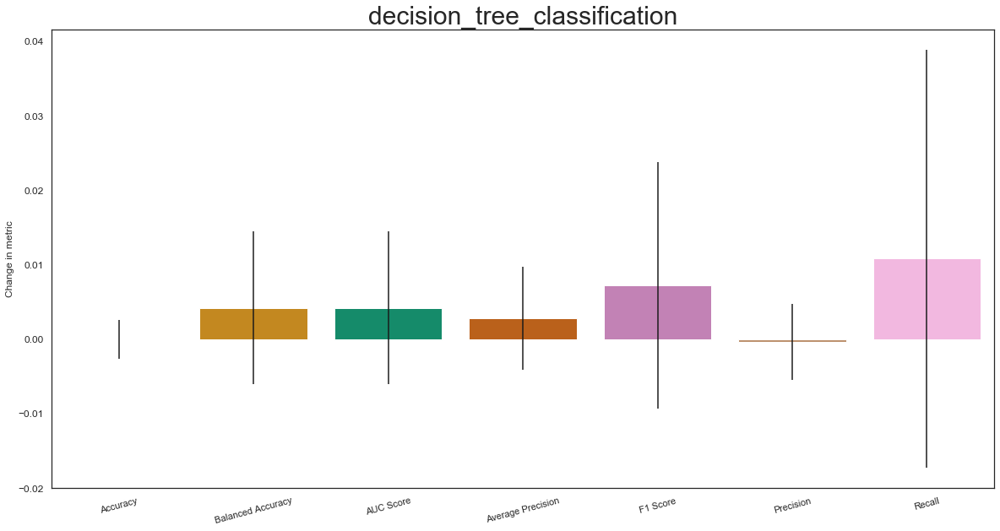

In [32]:
boop  = pd.DataFrame(data,columns=cols)
sns.set_style("white")
#iterate through columns except first
for col in range(len(boop.iloc[0,:])-1):
    
    averages = []
    sigmas = []
    for row in range(len(boop.iloc[:,0])):
        averages.append(boop.iloc[row,col+1][0])
        sigmas.append(boop.iloc[row,col+1][1])
#         print(averages)
#         print(sigmas)
    plt.figure(figsize=(20,10))
    plt.title(f"{models_list[col]}",fontsize="30")
    sns.barplot(x=metric_list,y=averages,yerr=sigmas)
    plt.xticks(fontsize='11',rotation=15)
    plt.ylabel("Change in metric")
    plt.show()

In [33]:
boop  = pd.DataFrame(data,columns=cols)
x_l = [] 
a_l = []
s_l= []
n_l = []
#iterate through columns except first
for col in range(len(boop.columns)-1):
    #print(col)
    averages = []
    sigmas = []
    for row in range(len(boop.iloc[:,0])):
        averages.append(boop.iloc[row,col+1][0])
        sigmas.append(boop.iloc[row,col+1][1])
    
    x_l.append(metric_list)
    a_l.append(averages)
    s_l.append(sigmas)
    n_l.append([boop.columns[col+1]]*len(sigmas))
  

In [34]:
#leaderboard = pd.read_html("./data/test_harness_results/custom_classification_leaderboard.html")[0]
leaderboard = pd.read_html("./data/cross_val_test_harness_RocklinLongxing.html")[0]
leaderboard = leaderboard.replace('__init__','keras cnn')
metric_list = ['Accuracy','Balanced Accuracy','AUC Score',
            'Average Precision','F1 Score','Precision','Recall']
models_list = leaderboard['Model Name'].unique()

In [35]:
#initialize empty list for storing dataframe rows
data_raw = []

#iterate through each metric
for metric in metric_list:
    #initialize empty list that will contain each row
    row_raw = []
    
    

    #iterate through each model
    for model in models_list:
        #get dataframe subset that only contains the given model
        model_df = leaderboard[leaderboard["Model Name"]==model]

        #separate between RS and R values
        RS_model_df = model_df[model_df["Data and Split Description"]=="RS"]
        R_model_df = model_df[model_df["Data and Split Description"]=="R"]

        #get difference in metric between each
        raw_diff = RS_model_df[metric].values - R_model_df[metric].values
        
        #print(f"{len(raw_diff)}-instances for {metric} in {model} model")

        #row_raw.append([[f"∆{metric}"]]*len(raw_diff))
        a = [[f"{metric}"]]*len(raw_diff)
        b = raw_diff.reshape(-1,1)
        c = [[f"{model}"]]*len(raw_diff)
        d = np.concatenate([a,b,c],axis=1)
        
        
        
        for di in d:
            data_raw.append(di)
        

In [36]:
cols = ["Metric","Score","Model Name"]

df_raw = pd.DataFrame(data_raw, columns=cols)
df_raw["Score"] = df_raw["Score"].map(float)

In [37]:
new_vector = []

#flatten the list of averages
flat_list_metric = [item for sublist in x_l for item in sublist]
flat_list_avg = [item for sublist in a_l for item in sublist]
flat_list_std = [item for sublist in s_l for item in sublist]
flat_list_names = [item for sublist in n_l for item in sublist]
    

for group in zip(
                    flat_list_metric,
                    flat_list_names, 
                    flat_list_avg, 
                    flat_list_std
                ):
    new_vector.append(list(group))
df = pd.DataFrame(new_vector,columns=["Metric","Model","Average","Err"])
translator = {
    "svm_classification":"SVM",
    "random_forest_classification":"RFC",
    'keras cnn':"CNN",
    "gbc_classification":"GBC",
    "knn_classifier":"K-NN",
    "naive_bayes_classification":"NBC",
    "decision_tree_classification":"DTC",
    "gmm_classification":"GMM"
    
}
df["Model"] = [translator[i] for i in df["Model"].values]
df_raw["Model Name"] = [translator[i] for i in df_raw["Model Name"].values]

/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:3695: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


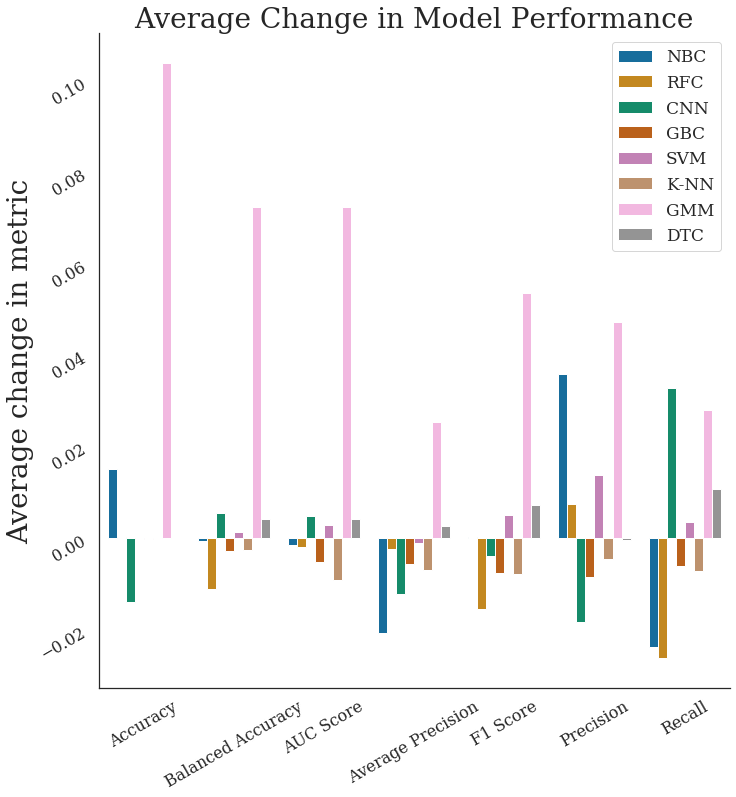

In [38]:
plt.rc('font', family='serif') # change font types for plots
plt.rc('xtick', labelsize='medium')
plt.rc('ytick', labelsize='medium')
g = sns.catplot(x="Metric",y="Average",hue="Model",data=df,kind='bar',palette="colorblind",
                size=10,legend_out=False,ci=95)
g.axes[0,0].set_title("Average Change in Model Performance",fontsize="28")
g.axes[0,0].tick_params(axis='both', which='major', labelsize=16,rotation=30)
g.axes[0,0].set_xlabel("")
g.axes[0,0].set_ylabel("Average change in metric",fontsize='28')
g.axes[0,0].legend(fontsize='17')



#plt.savefig("Figure4",dpi=600,bbox_inches="tight")
plt.show()

/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:3695: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


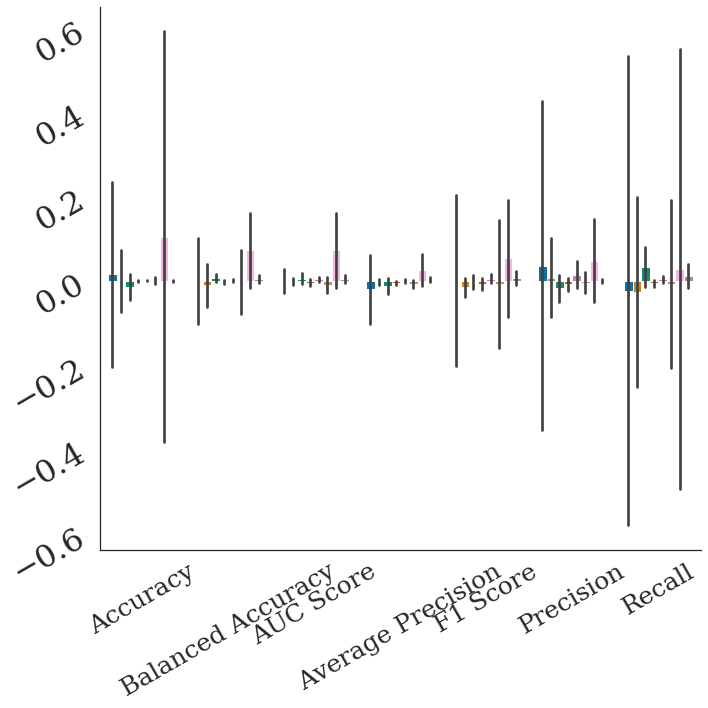

In [39]:
sns.set_style("white")
plt.rc('font', family='serif') # change font types for plots
plt.rc('xtick', labelsize='medium')
plt.rc('ytick', labelsize='medium')
g = sns.catplot(x="Metric",y="Score",hue="Model Name",data=df_raw,kind='bar',palette="colorblind",
                size=10,legend_out=False,ci="sd")
g.axes[0,0].set_title("Average Change in Model Performance",fontsize="28")
g.axes[0,0].tick_params(axis='both', which='major', labelsize=16,rotation=30)
g.axes[0,0].set_xlabel("")
g.axes[0,0].set_ylabel("")
g.axes[0,0].legend().remove()
plt.title("")

plt.yticks(fontsize='32')
plt.xticks(fontsize='25')
plt.tight_layout()
#plt.savefig("./SavedFigures/Figure4_v2_inset",dpi=600,bbox_inches="tight")
plt.show()

/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:3695: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


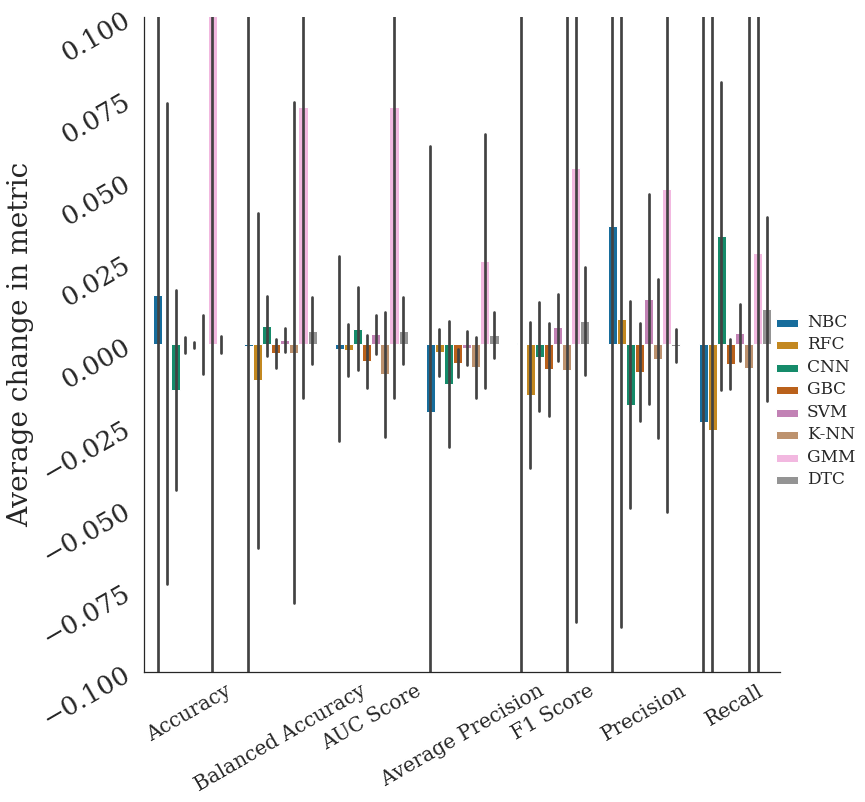

In [40]:
sns.set_style("white")
plt.rc('font', family='serif') # change font types for plots
plt.rc('xtick', labelsize='medium')
plt.rc('ytick', labelsize='medium')
g = sns.catplot(x="Metric",y="Score",hue="Model Name",data=df_raw,kind='bar',palette="colorblind",
                size=10,legend_out=True,ci='sd')
g.axes[0,0].set_title("Average Change in Model Performance",fontsize="28")
g.axes[0,0].tick_params(axis='both', which='major', labelsize=16,rotation=30)
g.axes[0,0].set_xlabel("")
g.axes[0,0].set_ylabel("Average change in metric",fontsize='28')
plt.ylim(-.1,.1)
g._legend.set_title("")

plt.setp(g._legend.get_texts(), fontsize='17')

plt.title("")
plt.yticks(fontsize='26')
plt.xticks(fontsize='20')

#plt.savefig("./SavedFigures/Figure4_v2",dpi=600,bbox_inches="tight")

plt.show()

In [104]:
#get the average results for each model for each metric
model_averages = []
vectors = []
for model in models_list:
    model_df = leaderboard[leaderboard["Model Name"]==model]
    for metric in metric_list:
        #print(model, metric, model_df[metric].mean())
        vectors.append([model,metric,model_df[metric].mean()])
averages_df = pd.DataFrame(vectors,columns=["model","metric","score"])

averages_df.T

,0,1,2,3,4,5,6,7,8,9,...,46,47,48,49,50,51,52,53,54,55
model,naive_bayes_classification,naive_bayes_classification,naive_bayes_classification,naive_bayes_classification,naive_bayes_classification,naive_bayes_classification,naive_bayes_classification,random_forest_classification,random_forest_classification,random_forest_classification,...,knn_classifier,knn_classifier,knn_classifier,decision_tree_classification,decision_tree_classification,decision_tree_classification,decision_tree_classification,decision_tree_classification,decision_tree_classification,decision_tree_classification
metric,Accuracy,Balanced Accuracy,AUC Score,Average Precision,F1 Score,Precision,Recall,Accuracy,Balanced Accuracy,AUC Score,...,F1 Score,Precision,Recall,Accuracy,Balanced Accuracy,AUC Score,Average Precision,F1 Score,Precision,Recall
score,0.732667,0.6548,0.809667,0.578333,0.347933,0.292867,0.5372,0.7082,0.644867,0.7162,...,0.291333,0.269,0.4338,0.667733,0.583733,0.583733,0.2286,0.292667,0.267533,0.457


----------

# Topology Specific Runs (Rocklin)

----------

In [7]:
def topology_specified_plot(
    file_path, score_metric):
    
    # load the leaderboard dataframe
    global_leaderboard_dataframe = pd.read_html(file_path)[0]
    global_leaderboard_dataframe['topology'] = [i.split()[1] for i in global_leaderboard_dataframe['Data and Split Description']]
    global_leaderboard_dataframe['model'] = [i.split()[0] for i in global_leaderboard_dataframe['Data and Split Description']]
    global_leaderboard_dataframe["Model Name"].replace("__init__","Keras CNN")
    
    model_list = global_leaderboard_dataframe["Model Name"].unique()
    model_description_column = "Data and Split Description"
    
    
    for model in model_list:
        leaderboard_dataframe = global_leaderboard_dataframe[global_leaderboard_dataframe["Model Name"]==model]

        # make an rs, r, and s subset
        dataframe_rs = leaderboard_dataframe[
            leaderboard_dataframe[model_description_column]=='RS']
        dataframe_r = leaderboard_dataframe[
            leaderboard_dataframe[model_description_column]=='R']
        dataframe_s = leaderboard_dataframe[
            leaderboard_dataframe[model_description_column]=='S']
    
    
        
        
        topology_list_df  = leaderboard_dataframe

        clf_scores_names = [
                    'Accuracy','Balanced Accuracy','AUC Score',
                    'Average Precision','F1 Score','Precision',
                    'Recall']

        rgr_scores_names = ['R-Squared','RMSE']



        metric_list = None
        if score_metric=='clf':
            metric_list = clf_scores_names
        elif score_metric=='rgr':
            metric_list = rgr_scores_names
        else:
            print("Invalid score metric. Choose either 'clf' or 'rgr'")
            return




        top_rs = topology_list_df[topology_list_df['model']=='RS']
        top_r = topology_list_df[topology_list_df['model']=='R']
        top_s = topology_list_df[topology_list_df['model']=='S']



        # sort dataframes for plots
        top_rs = top_rs.sort_values(by='Samples In Test',ascending=False)
        top_r = top_r.sort_values(by='Samples In Test',ascending=False)
        top_s = top_s.sort_values(by='Samples In Test',ascending=False)

        for i in range(len(metric_list)):
                sns.set(rc={'figure.figsize':(35,15)})
                sns.set_style('white')

                fig,ax = plt.subplots()

                score_rs = top_rs[metric_list[i]].values
                score_r = top_r[metric_list[i]].values
                score_s = top_s[metric_list[i]].values

                sns.set(rc={'figure.figsize':(35,15)})


                sns.barplot(
                    x=top_rs['topology'].values,
                    y=top_rs['Samples In Test'],
                    ax=ax,
                    color='white',
                    edgecolor='black',
                    linewidth=4)
                sns.barplot(
                    x=top_r['topology'].values,
                    y=top_r['Samples In Test'],
                    ax=ax,
                    color='white',
                    edgecolor='black',
                    linewidth=4)
                sns.barplot(
                    x=top_s['topology'].values,
                    y=top_s['Samples In Test'],
                    ax=ax,color='white',
                    edgecolor='black',
                    linewidth=4)
                
                plt.yticks(fontsize='38')
                
                ax2 = ax.twinx()


                sns.pointplot(
                    x=top_rs['topology'].values,
                    y=score_rs,
                    color='blue',
                    join=False,
                    scale=1)
                sns.pointplot(
                    x=top_r['topology'].values,
                    y=score_r,
                    color='orange',
                    join=False,
                    scale=1)
                sns.pointplot(
                    x=top_s['topology'].values,
                    y=score_s,
                    color='green',
                    join=False,
                    scale=1)


                ax2.legend(
                    handles=ax2.collections, 
                    labels=["R+S","R","S"],
                    prop={'size':'20'})


                plt.title("%s %s per topology"%(model, metric_list[i]),fontsize=50)
                plt.yticks(fontsize=38)
                plt.ylim(0,1)
                ax.set_xlabel("Topology ",fontsize=22)
                ax.set_xticklabels(ax2.get_xticklabels(),fontsize=50)
                plt.ylabel("%s"%metric_list[i],fontsize=45)
                ax.set_ylabel("Number of samples in test group",fontsize=50)
                plt.show()
                #plt.close('all')
            

### Classifier Results

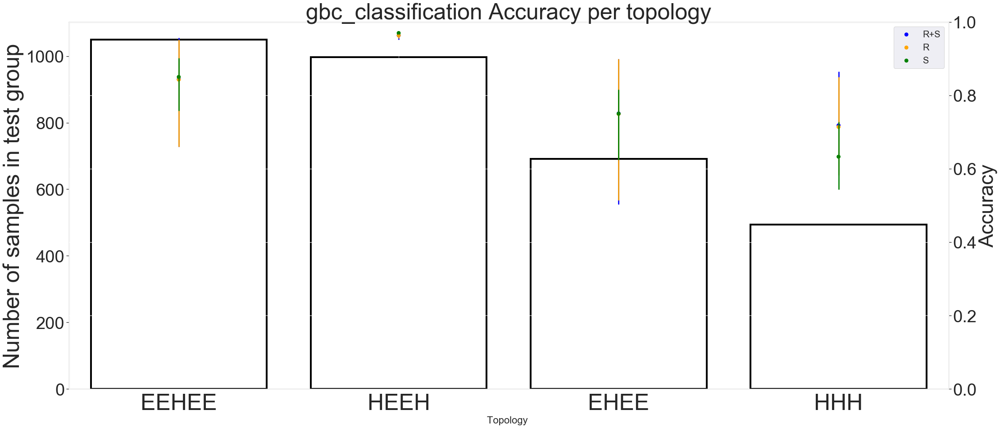

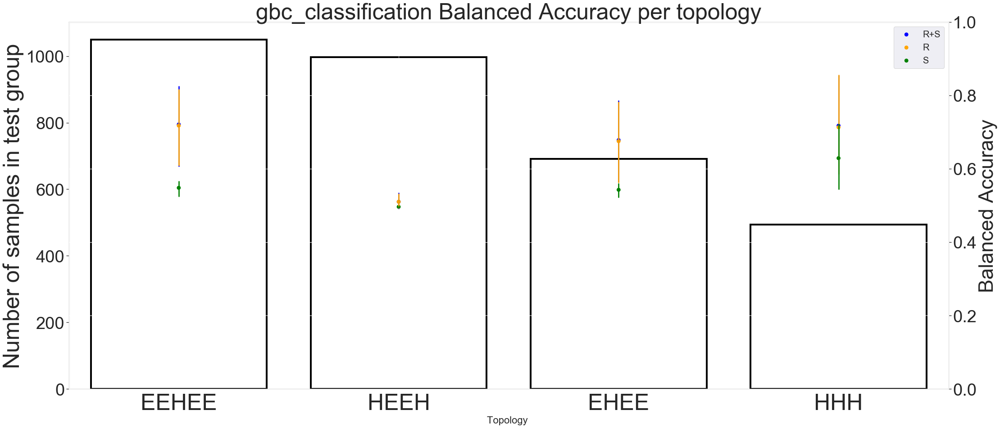

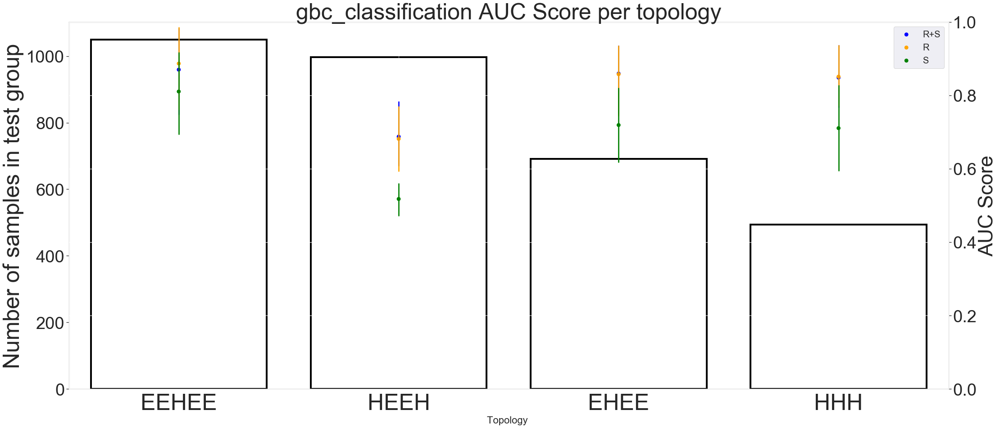

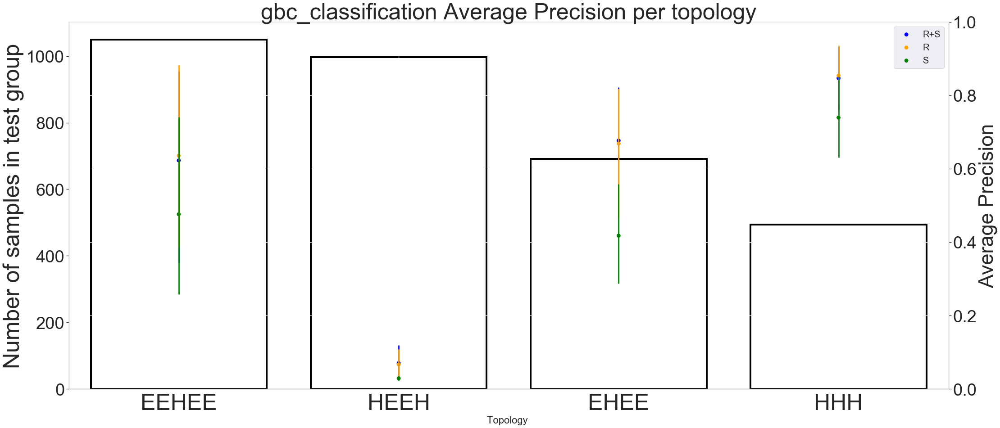

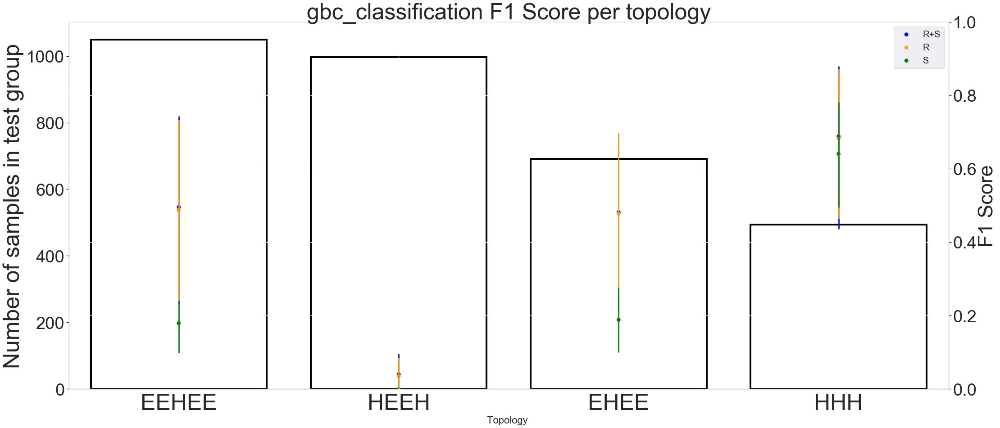

...

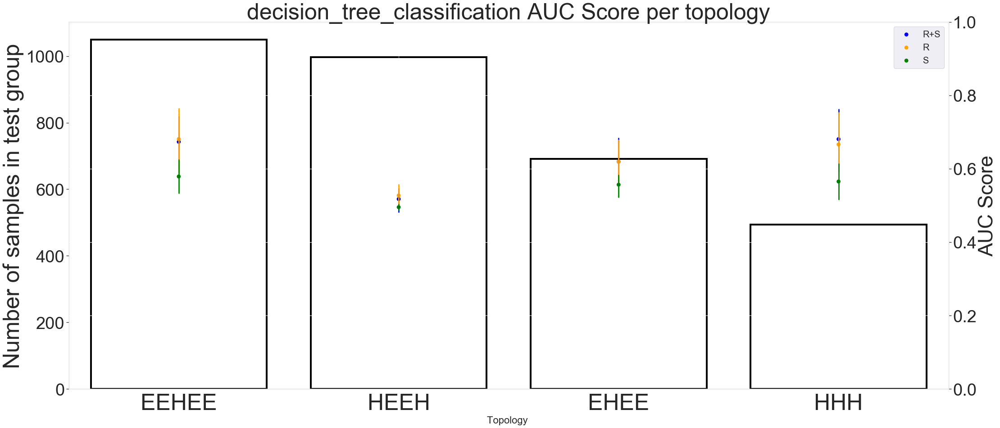

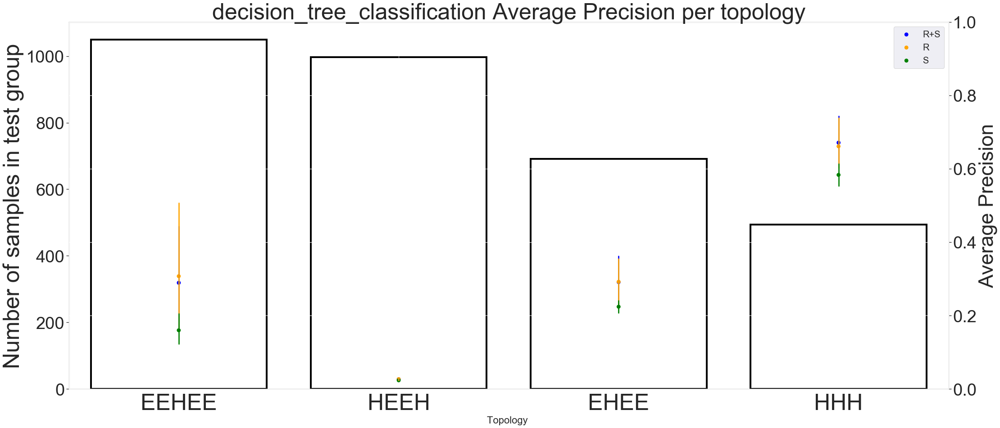

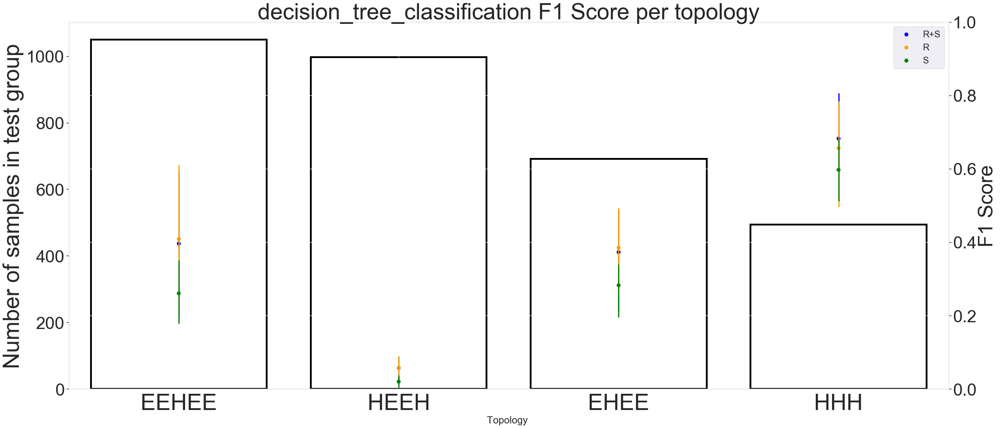

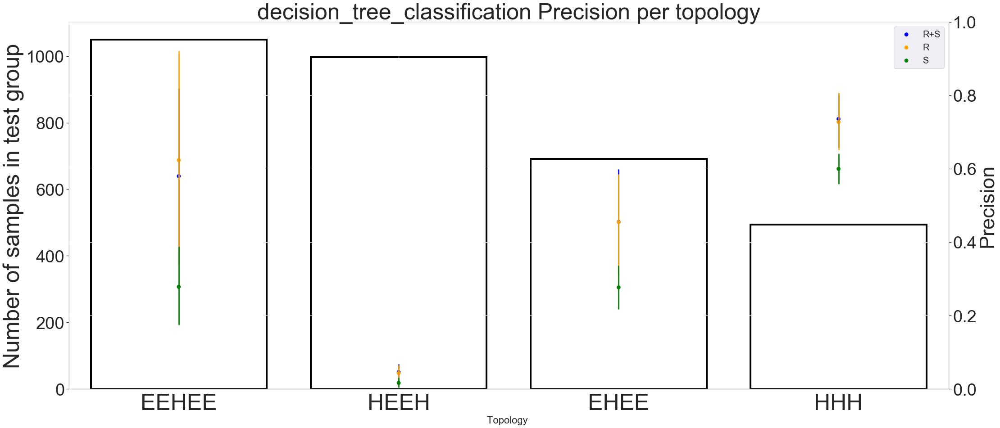

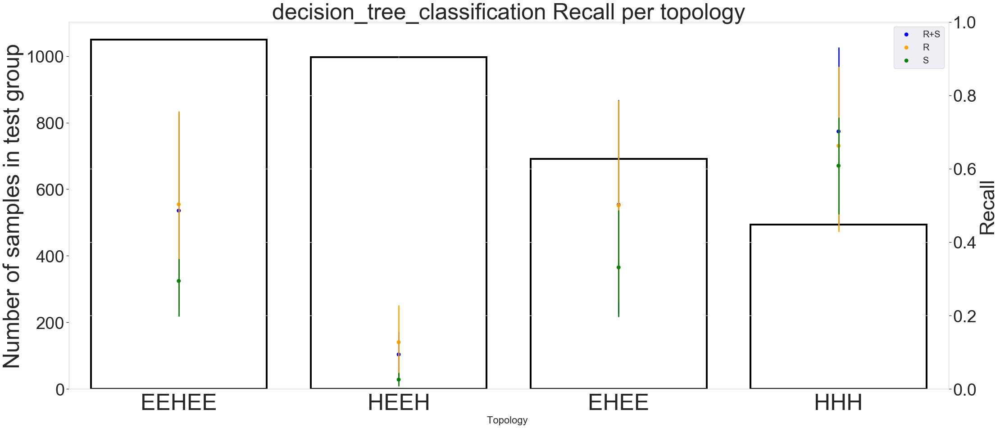

In [8]:
topology_specified_plot("./data/top_specific_Rocklin_leaderboard.html",'clf')

In [9]:
def labels_to_list(series):

    positions_original = list(range(len(series.unique())))
    positions_new = []
    for i in range(len(series.unique())): 
        topology = series.unique()[i]
        sub = series[series==topology]
        multiplier = len(sub)
        positions_new.append([positions_original[i]]*multiplier)

    #since positions_new was a nested list, break it apart with this for loop
    positions = [item for l in positions_new for item in l]
    #print(positions)
    return positions

In [10]:
def get_errors_list(series, scores):
    series = series.reset_index(drop=True)
    inx_topologies = []
    errs_list = []
    means_list = []


    for i in range(len(series.unique())):
        top = series.unique()[i]
        inx = series.index[series==top]
        errs_list.append(np.std(scores[inx]))
        means_list.append(np.mean(scores[inx]))

    return errs_list, means_list


In [40]:
def three_metric_barplot(file_path,xaxis_label=""):
    import matplotlib.patches as mpatches
    from matplotlib.patches import Rectangle
    model_description_column = 'Data and Split Description'

    # read in results of runs
    leaderboard = pd.read_html(file_path)[0]
    leaderboard["Model Name"] = leaderboard["Model Name"].replace("__init__","Keras CNN")



    # split up the "RS HHH"-like column into ["RS","HHH"] then only keep the topology part
    topology_col = leaderboard["Data and Split Description"].apply(lambda x: x.split()[1])

    # # split up the "RS HHH"-like column into ["RS","HHH"] then only keep the "RS" part
    data_description = leaderboard["Data and Split Description"].apply(lambda x: x.split()[0])

    leaderboard["Data and Split Description"] = data_description
    leaderboard["topology"] = topology_col


    for model in leaderboard["Model Name"].unique():
        leaderboard_dataframe = leaderboard[leaderboard["Model Name"]==model]


        # make an rs, r, and s subset
        dataframe_rs = leaderboard_dataframe[
            leaderboard_dataframe[model_description_column]=='RS']
        dataframe_r = leaderboard_dataframe[
            leaderboard_dataframe[model_description_column]=='R']
        dataframe_s = leaderboard_dataframe[
            leaderboard_dataframe[model_description_column]=='S']

        clf_scores_names = [
                    'Balanced Accuracy',
                    'F1 Score',
                    'AUC Score']


        metric_list = clf_scores_names


        top_rs = dataframe_rs[dataframe_rs['Data and Split Description']=='RS']
        top_r = dataframe_r[dataframe_r['Data and Split Description']=='R']
        top_s = dataframe_s[dataframe_s['Data and Split Description']=='S']



        # sort dataframes for plots
        top_rs = top_rs.sort_values(by='Samples In Test',ascending=False)
        top_r = top_r.sort_values(by='Samples In Test',ascending=False)
        top_s = top_s.sort_values(by='Samples In Test',ascending=False)



        positions_rs = labels_to_list(top_rs['topology'])
        positions_r = labels_to_list(top_r['topology'])
        positions_s = labels_to_list(top_s['topology'])

        ##########################################
        offset = [-.2,0,.2]
        labels = top_rs['topology'].unique()

        size = 10

        sns.set(rc={'figure.figsize':(size,size/1.618)})
        sns.set_style('white')



        fig,ax = plt.subplots(sharex=True)


        #ax.set_xticks(np.arange(-0.1,11,0.1))
        sns.barplot(
                x=positions_rs,
                y=top_rs['Samples In Test'],
                ax=ax,
                color='white',
                edgecolor='black',
                linewidth=4)
        sns.barplot(
                x=positions_r,
                y=top_r['Samples In Test'],
                ax=ax,
                color='white',
                edgecolor='black',
                linewidth=4)
        sns.barplot(
                x=positions_s,
                y=top_s['Samples In Test'],
                ax=ax,color='white',
                edgecolor='black',
                linewidth=4)



        #makes a second y axis
        ax2 = ax.twinx()

        fmts = ["o","^","s"]

        for i in range(len(metric_list)):


            score_rs = top_rs[metric_list[i]].values
            err_rs,means_list_rs = get_errors_list(top_rs['topology'],score_rs)

            score_r = top_r[metric_list[i]].values
            err_r,means_list_r = get_errors_list(top_r['topology'],score_r)


            score_s = top_s[metric_list[i]].values
            err_s,means_list_s = get_errors_list(top_s['topology'],score_s)

            plt.errorbar(
                x=[x+offset[i] for x in np.unique(positions_rs)],
                y=means_list_rs,
                yerr=err_rs,
                fmt=fmts[i],
                color='blue',
                markersize=12.0,
                label="R+S")


            plt.errorbar(
                x=[x+offset[i] for x in np.unique(positions_r)],
                y=means_list_r,
                yerr=err_r,
                fmt=fmts[i],
                color='orange',
                markersize=12.0,
                label="R")


            plt.errorbar(
                x=[x+offset[i] for x in np.unique(positions_s)],
                y=means_list_s,
                yerr=err_s,
                fmt=fmts[i],
                color='green',
                markersize=12.0,
                label="S")



        plt.text(0,-.45,s="%s(o)\n%s(∆)\n %s (🔲)"%(clf_scores_names[0],clf_scores_names[1],clf_scores_names[2]),
                 transform=ax.transAxes,fontsize='28',
                 bbox={"ec":"black","fc":"white","boxstyle":"round"})
        


        legendlabels = ["R+S$_{cnf}$","R","S$_{cnf}$"]
        colors = ["blue","orange","green"]
        legendhandles = [ plt.plot([],[], marker="o", ms=10, ls="", mec=None, color=colors[i], 
                            label="{:s}".format(legendlabels[i]) )[0]  for i in range(len(legendlabels)) ]


        plt.title(model,fontsize='30')
        plt.legend(handles=legendhandles,labels=legendlabels,loc=(0.75,-0.5),fontsize="28")
        # plt.legend(handles=legendhandles,labels=legendlabels,loc='best',fontsize="28")

        plt.xticks(ticks=list(range(len(np.unique(positions_rs)))),labels=labels,fontsize='22')

        ax.tick_params(axis='both', which='major', labelsize=22)
        ax2.tick_params(axis='both', which='major', labelsize=22)
        ax2.set_ylim(0,1.1)

        ax2.set_ylabel("Metric score",fontsize='30',position=(1.5,.5),rotation_mode='anchor')
        ax.set_xlabel(xaxis_label,fontsize='30')

        ax.set_ylabel('Number of examples\nin test set',fontsize='30')
        #plt.savefig("./SavedFigures/LOO_plot.png",dpi=300,bbox_inches="tight")
        plt.show()



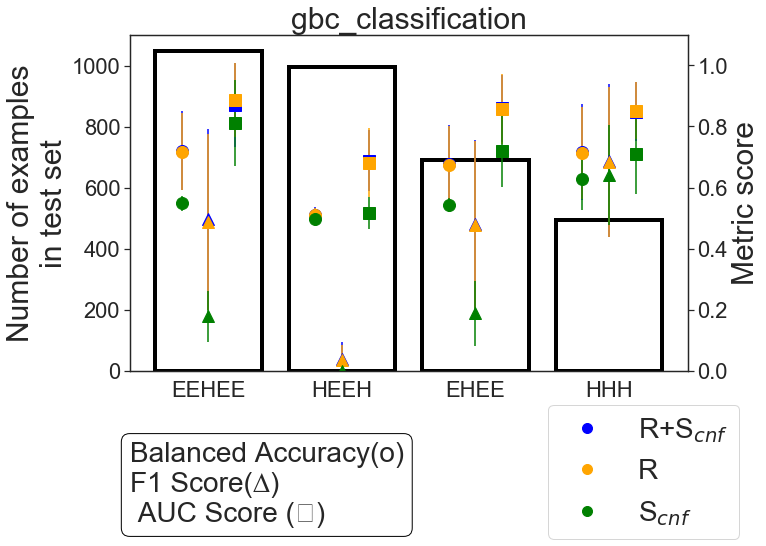

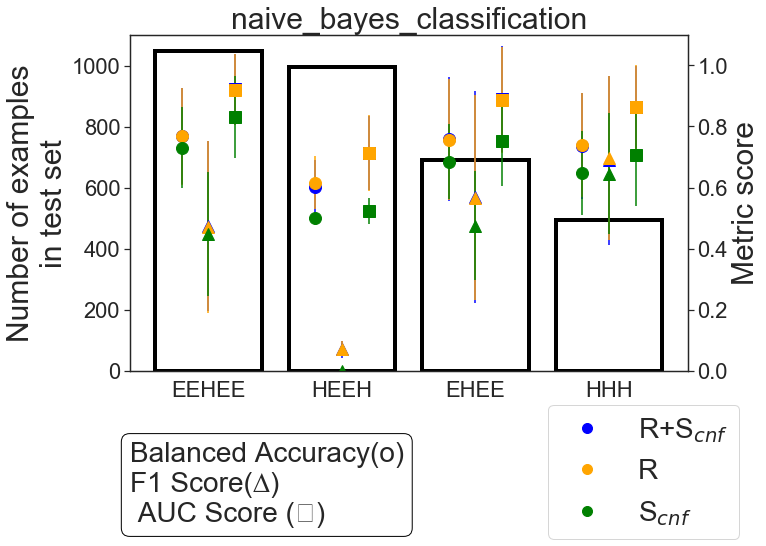

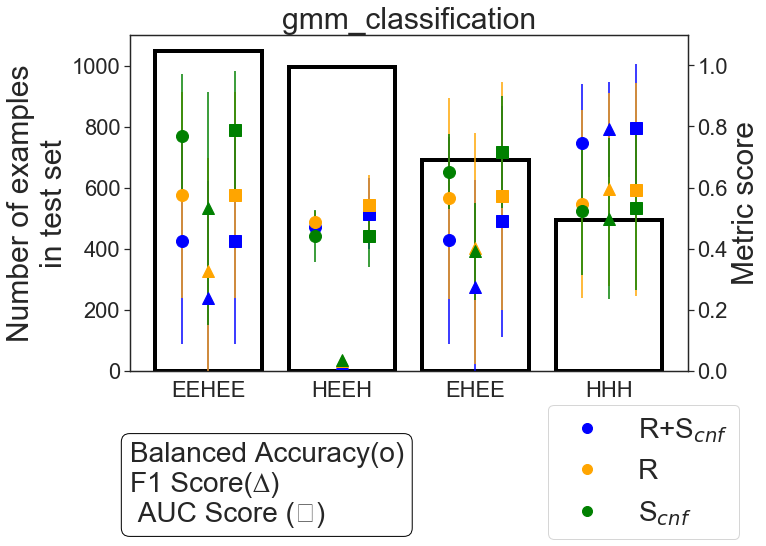

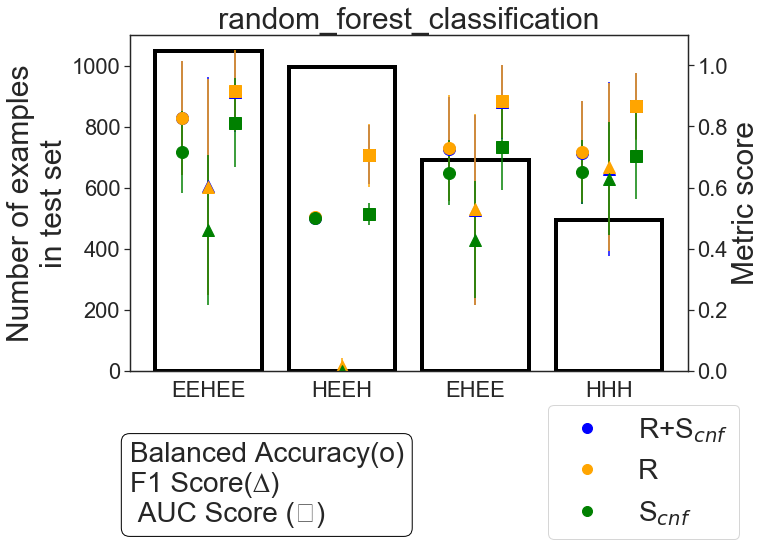

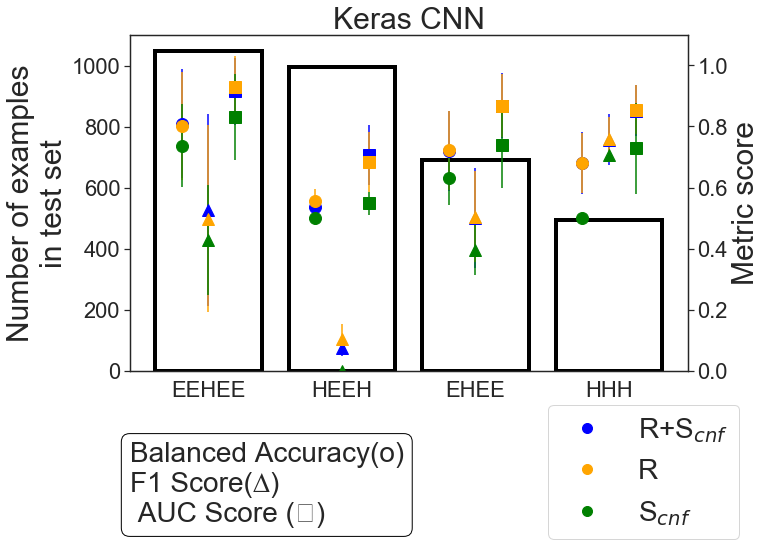

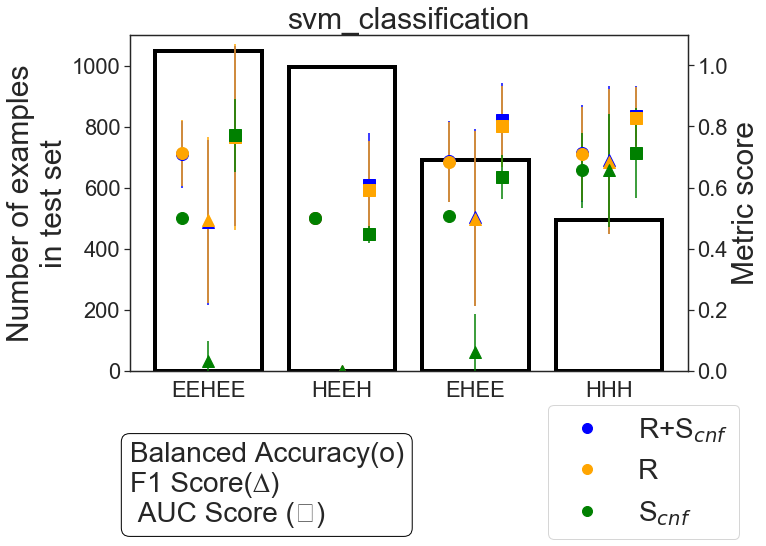

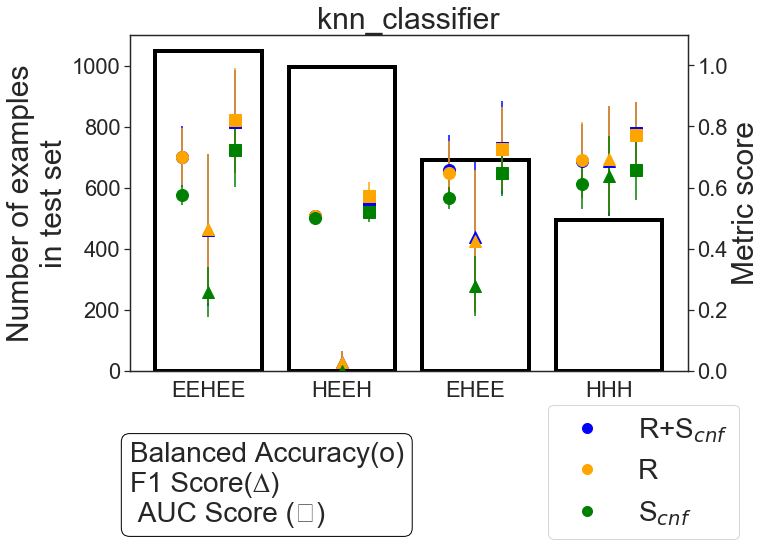

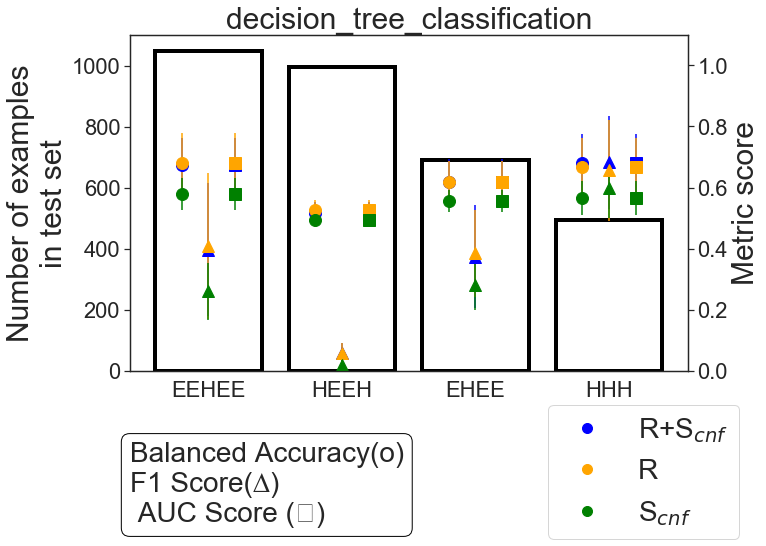

In [41]:
three_metric_barplot("./data/top_specific_Rocklin_leaderboard.html")

# Topology Specific Runs (Longxing)

In [62]:
topology_specified_plot("./data/top_specific_Longxing_leaderboard.html",'clf')

TypeError: topology_specified_plot() takes 1 positional argument but 2 were given

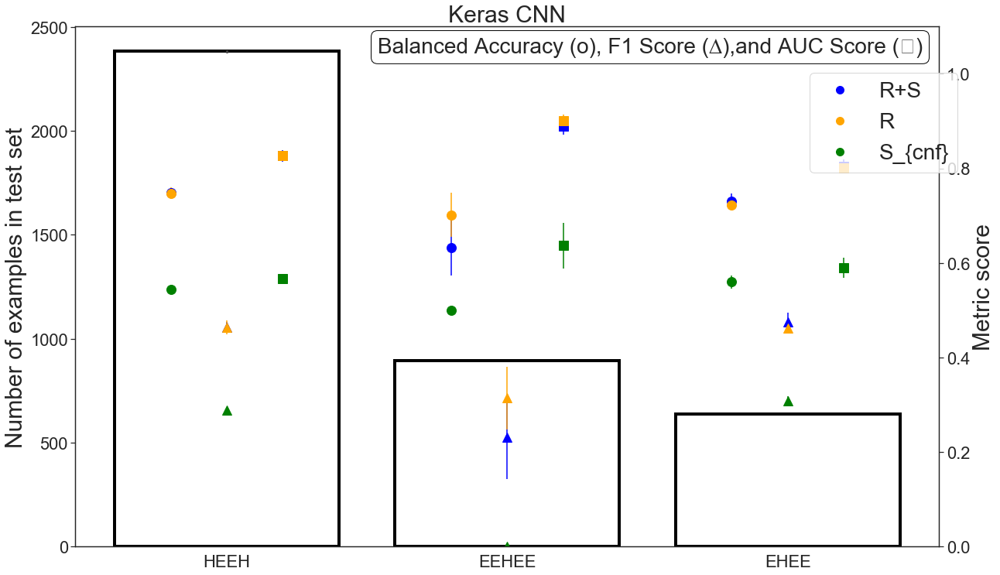

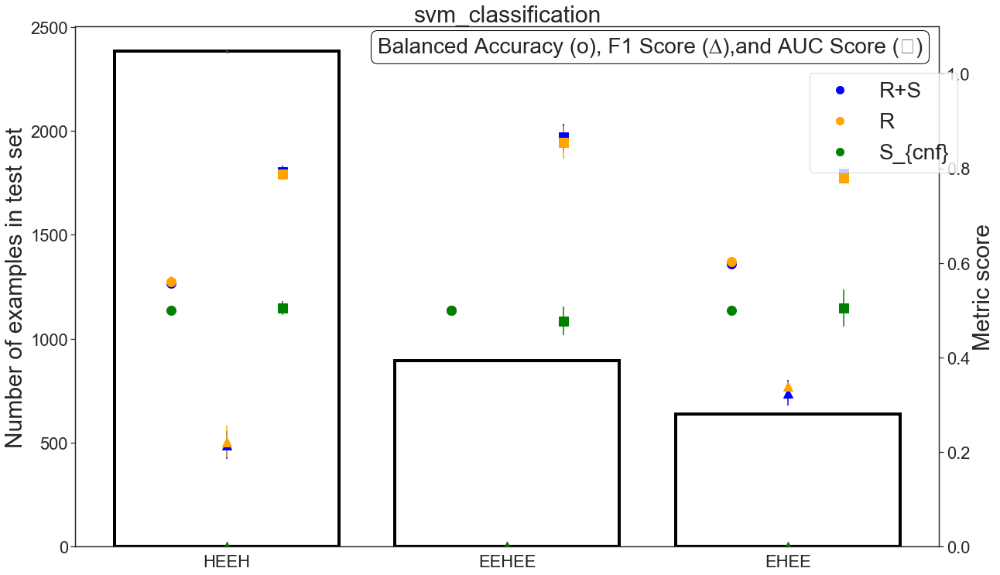

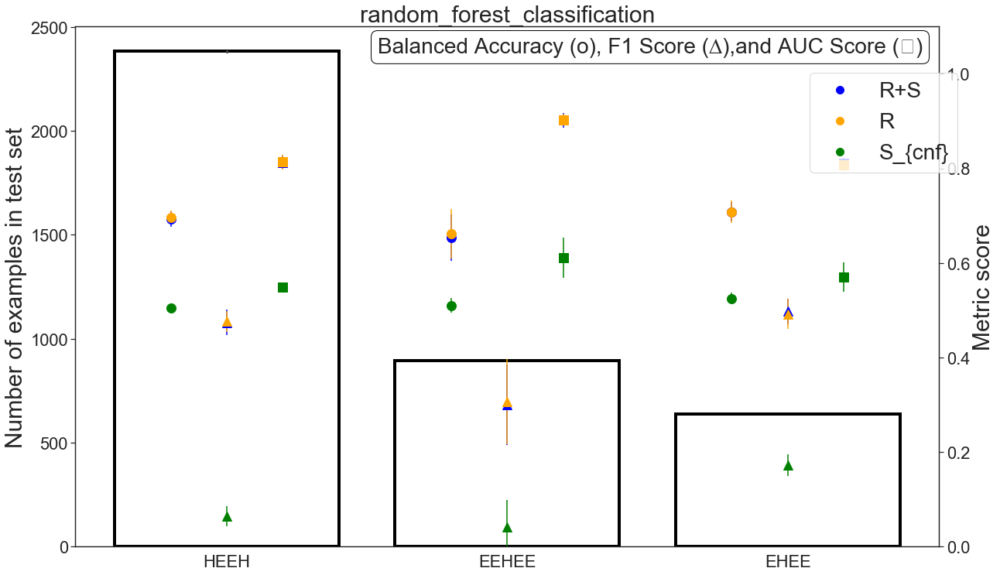

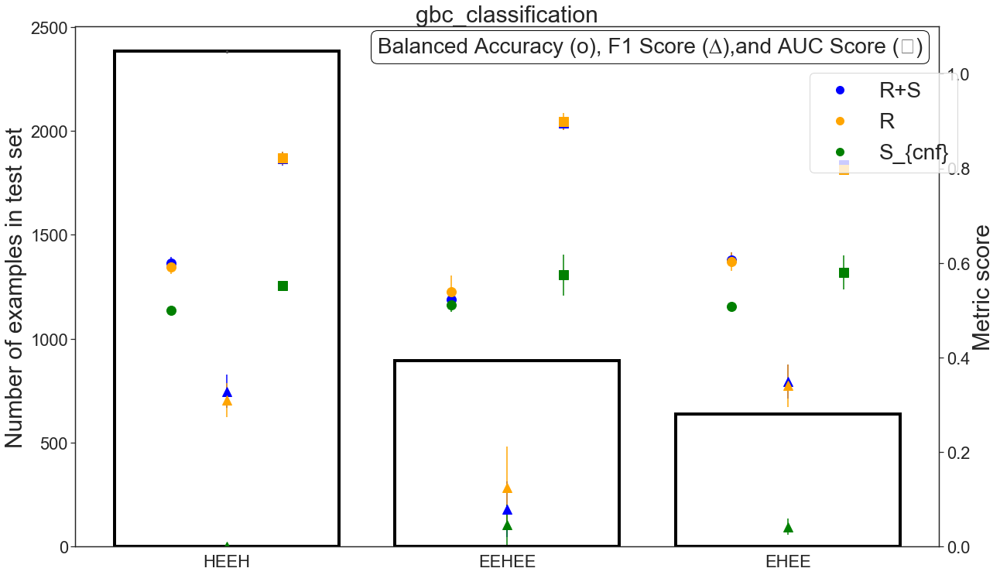

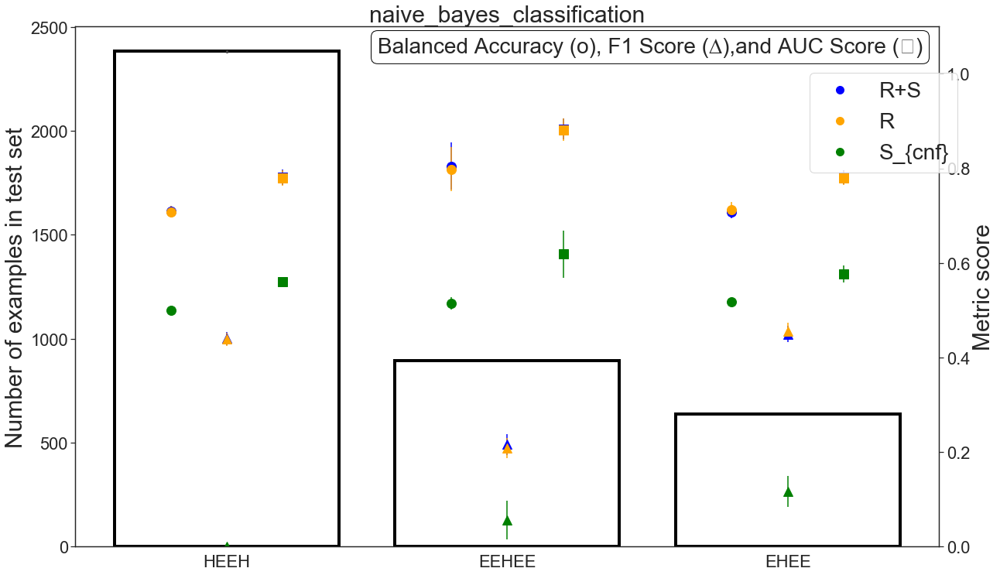

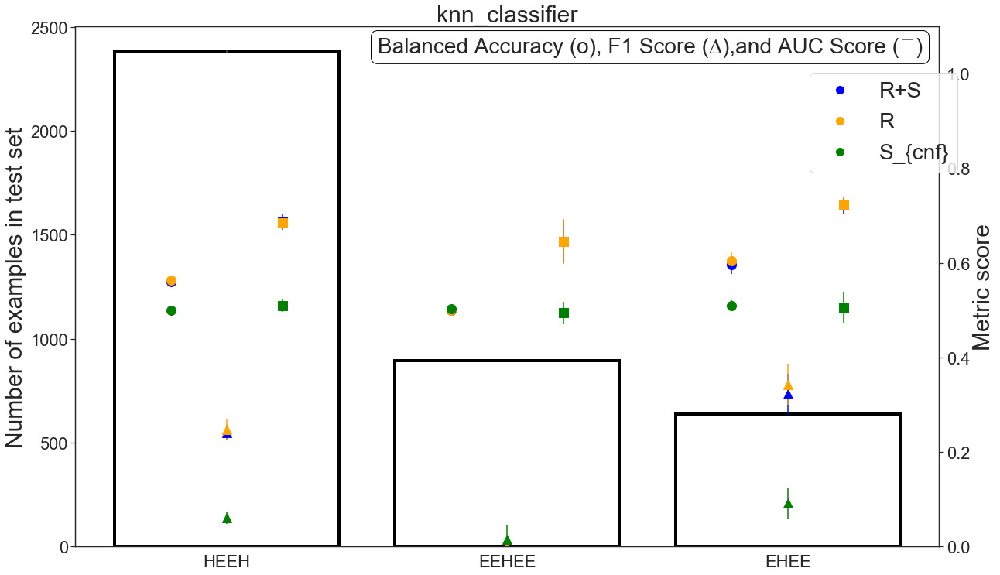

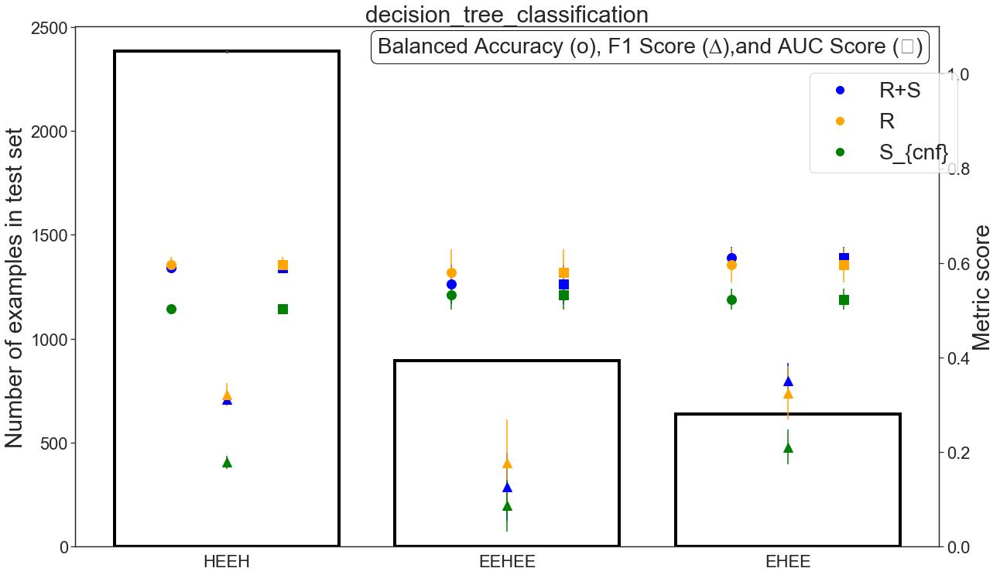

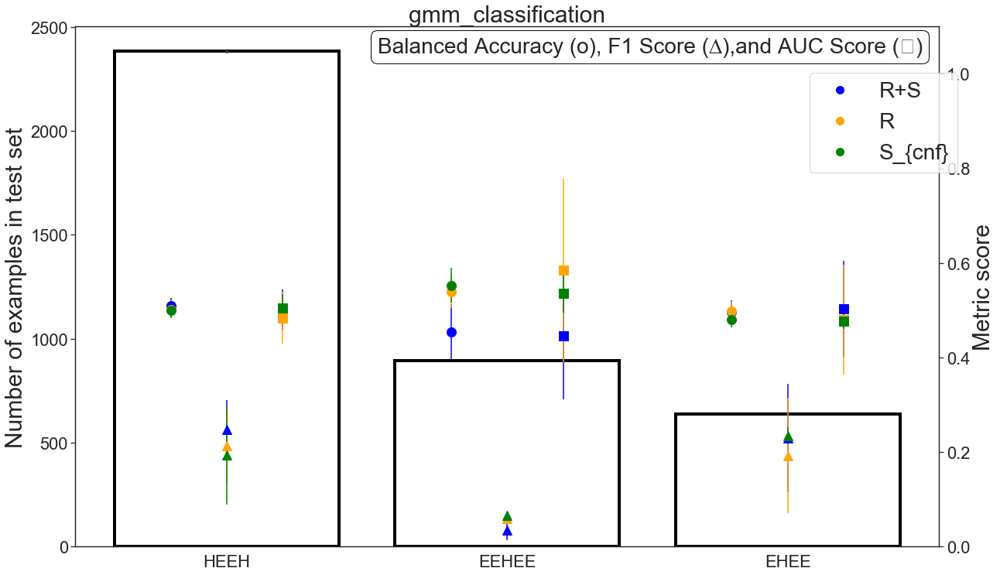

In [63]:
three_metric_barplot("./data/top_specific_Longxing_leaderboard.html")

# Feature sets reduced by KS vaue

In [51]:
rs_sub_leaderboard = pd.read_html("./data/RS_sub_ROCKLIN_custom_classification_leaderboard.html")[0].replace("__init__","CNN")
reference_leaderboard = pd.read_html("./data/cross_val_test_harness_ROCKLIN.html")[0].replace("__init__","CNN")


df_rs_sub = rs_sub_leaderboard[rs_sub_leaderboard["Data and Split Description"] == "RS_sub"]
df_r = reference_leaderboard[reference_leaderboard["Data and Split Description"] == "R"]
df_s = rs_sub_leaderboard[rs_sub_leaderboard["Data and Split Description"] == "S"]


In [52]:
df_r_sub = rs_sub_leaderboard[rs_sub_leaderboard["Data and Split Description"] == "R_sub"]

In [53]:
clf_scores_names = list(df_r_sub.columns[6:13])


metric_list = clf_scores_names

In [54]:
result = []
for model in rs_sub_leaderboard["Model Name"].unique():
    foo_df_rs_sub = df_rs_sub[df_rs_sub["Model Name"]==model]
    foo_df_r = df_r[df_r["Model Name"]==model]
    foo_df_s = df_s[df_s["Model Name"]==model]
    foo_df_r_sub = df_r_sub[df_r_sub["Model Name"]==model]
    
    row = [model]
    print(model)
    for metric in metric_list:
        diff_rsSub_r = foo_df_rs_sub[metric].mean() - foo_df_r[metric].mean()
        std_rsSub_r = foo_df_rs_sub[metric].mean() - foo_df_r[metric].std()
        
        diff_rsSub_s = foo_df_rs_sub[metric].mean() - foo_df_s[metric].mean()
        std_rsSub_s = foo_df_rs_sub[metric].mean() - foo_df_s[metric].std()
        
        diff_rsSub_rSub = foo_df_rs_sub[metric].mean() - foo_df_r_sub[metric].mean()
        std_rsSub_rSub = foo_df_rs_sub[metric].mean() - foo_df_r_sub[metric].std()

#         print(f"\t{metric}: ∆(RS_sub - R)", diff_rsSub_r)
#         print(f"\t{metric}: ∆(RS_sub - R)", diff_rsSub_r)


        print(f"\t{metric}: ∆(RS_sub - R)", diff_rsSub_r)
        
        print(f"\t{metric}: ∆(RS_sub - R_sub)", diff_rsSub_rSub)
        
        #row.append(i for i in [diff_rsSub_r,std_rsSub_r,diff_rsSub_rSub,std_rsSub_rSub])
        for i in [diff_rsSub_r,diff_rsSub_rSub]:
            row.append(i) 
        #print("∆(RS_sub - S)", diff_rsSub_s)
    result.append(row)

naive_bayes_classification
	Accuracy: ∆(RS_sub - R) 0.017400000000000082
	Accuracy: ∆(RS_sub - R_sub) 0.0026000000000001577
	Balanced Accuracy: ∆(RS_sub - R) 0.01100000000000001
	Balanced Accuracy: ∆(RS_sub - R_sub) -0.015600000000000058
	AUC Score: ∆(RS_sub - R) 0.028400000000000092
	AUC Score: ∆(RS_sub - R_sub) -0.0035999999999999366
	Average Precision: ∆(RS_sub - R) 0.03420000000000012
	Average Precision: ∆(RS_sub - R_sub) 0.00040000000000006697
	F1 Score: ∆(RS_sub - R) 0.025199999999999945
	F1 Score: ∆(RS_sub - R_sub) -0.04259999999999997
	Precision: ∆(RS_sub - R) 0.22300000000000003
	Precision: ∆(RS_sub - R_sub) -0.005599999999999883
	Recall: ∆(RS_sub - R) 0.0015999999999999348
	Recall: ∆(RS_sub - R_sub) -0.04259999999999997
CNN
	Accuracy: ∆(RS_sub - R) -0.04299999999999993
	Accuracy: ∆(RS_sub - R_sub) -0.008399999999999963
	Balanced Accuracy: ∆(RS_sub - R) -0.019399999999999973
	Balanced Accuracy: ∆(RS_sub - R_sub) -0.005999999999999894
	AUC Score: ∆(RS_sub - R) -0.01239999999999

In [55]:
results_df = pd.DataFrame(result,columns=["model","Accuracy (RS_sub - R)","Accuracy (RS_sub - R_sub)",
                                "Balanced Accuracy (RS_sub - R)","Balanced Accuracy (RS_sub - R_sub)",
                                "AUC Score (RS_sub - R)","AUC Score (RS_sub - R_sub)",
                                "Average Precision (RS_sub - R)","Average Precision (RS_sub - R_sub)",
                                "F1 Score (RS_sub - R)","F1 Score (RS_sub - R_sub)",
                                "Precision (RS_sub - R)","Precision (RS_sub - R_sub)",
                                "Recall (RS_sub - R)","Recall (RS_sub - R_sub)"])

In [56]:
results_df

,model,Accuracy (RS_sub - R),Accuracy (RS_sub - R_sub),Balanced Accuracy (RS_sub - R),Balanced Accuracy (RS_sub - R_sub),AUC Score (RS_sub - R),AUC Score (RS_sub - R_sub),Average Precision (RS_sub - R),Average Precision (RS_sub - R_sub),F1 Score (RS_sub - R),F1 Score (RS_sub - R_sub),Precision (RS_sub - R),Precision (RS_sub - R_sub),Recall (RS_sub - R),Recall (RS_sub - R_sub)
0,naive_bayes_classification,0.0174,0.0026,0.0110,-0.0156,0.0284,-0.0036,0.0342,0.0004,0.0252,-0.0426,0.2230,-0.0056,0.0016,-0.0426
1,CNN,-0.0430,-0.0084,-0.0194,-0.0060,-0.0124,0.0052,-0.0012,0.0194,-0.0188,-0.0208,0.0180,0.0574,0.0152,-0.0022
2,random_forest_classification,0.0030,0.0080,0.0036,0.0050,-0.0102,0.0002,-0.0230,-0.0058,0.0020,0.0060,-0.0016,0.0064,0.0038,0.0006
3,gbc_classification,0.0196,0.0052,0.0076,0.0028,-0.0234,0.0026,-0.0546,0.0062,0.0018,0.0010,-0.0640,-0.0238,-0.0100,-0.0010
4,svm_classification,0.0176,0.0108,0.0084,0.0066,-0.0176,0.0212,-0.0040,0.0158,0.0034,0.0050,0.0066,0.0044,-0.0054,0.0006
5,knn_classifier,0.0156,0.0112,0.0082,0.0048,0.0016,0.0082,0.0134,0.0126,0.0140,0.0076,0.0278,0.0172,-0.0032,-0.0044
6,gmm_classification,0.0014,-0.1332,0.0014,-0.0002,0.1516,0.0008,0.0896,-0.0044,0.0018,0.0576,0.1336,0.0670,0.0016,0.2000
7,decision_tree_classification,0.0140,0.0008,0.0044,-0.0002,0.0044,-0.0002,0.0082,-0.0040,0.0054,-0.0044,-0.0234,-0.0106,-0.0100,-0.0022


In [57]:
results_df.to_csv("./data/rs_sub_results_ROCKLIN.csv",index=False)

### Regressor Results

HHH           303
4h            303
EHEE          303
HEEH          303
ferredoxin    303
thio          303
EEHEE         303
fold2         300
coil          300
beta_grasp    300
fold4         300
Name: topology, dtype: int64
Plotting Trends:


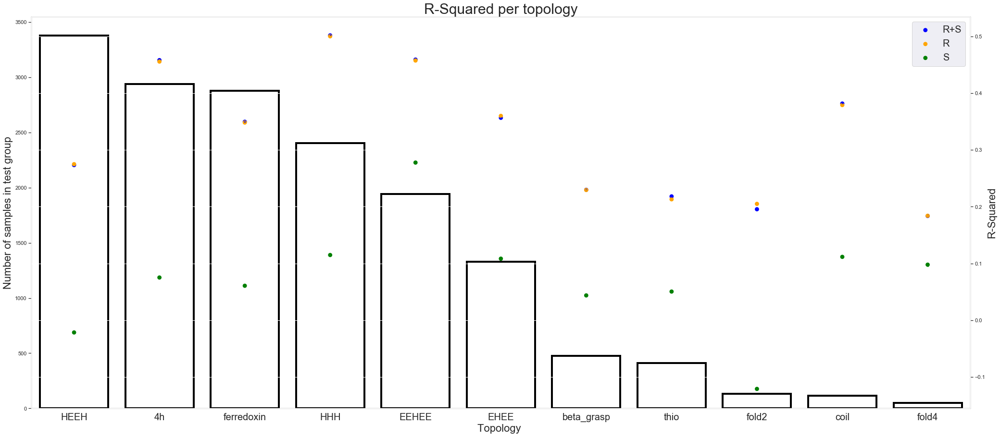

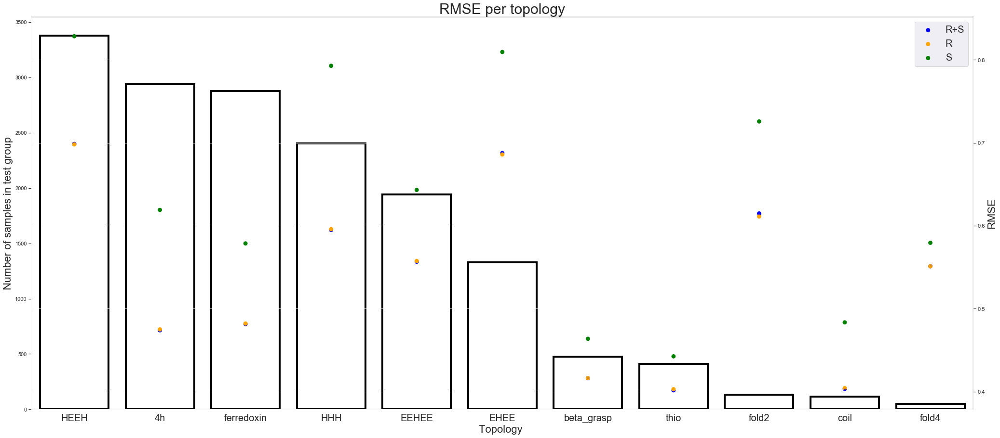

In [16]:
overall_results(
    file_path="./data/topology_specified_regression_leaderboard.html",
    loo_run=False,
    topology_run=True,
    general_run=False,
    model_description_column='Data and Split Description',
    metric='rgr')

------------

# Leave-one-out Runs

## Rocklin

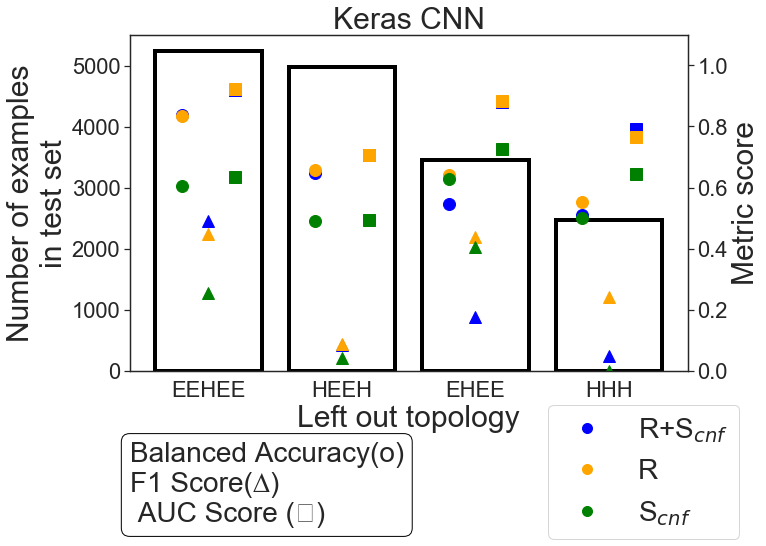

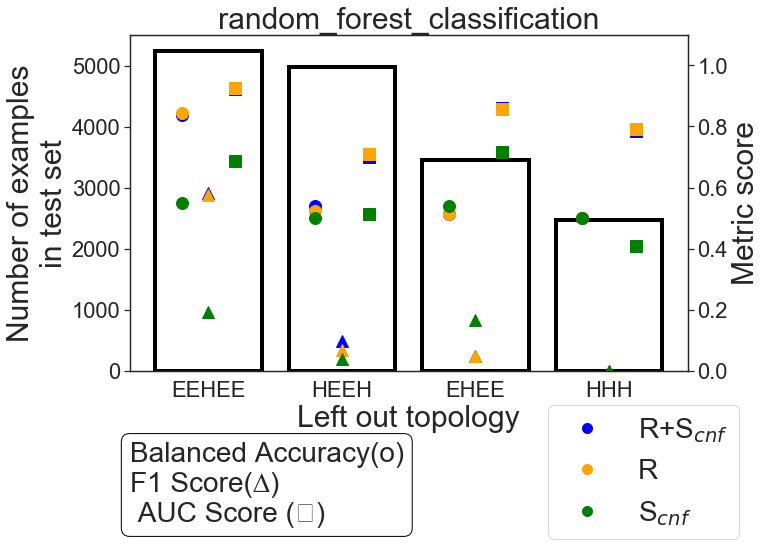

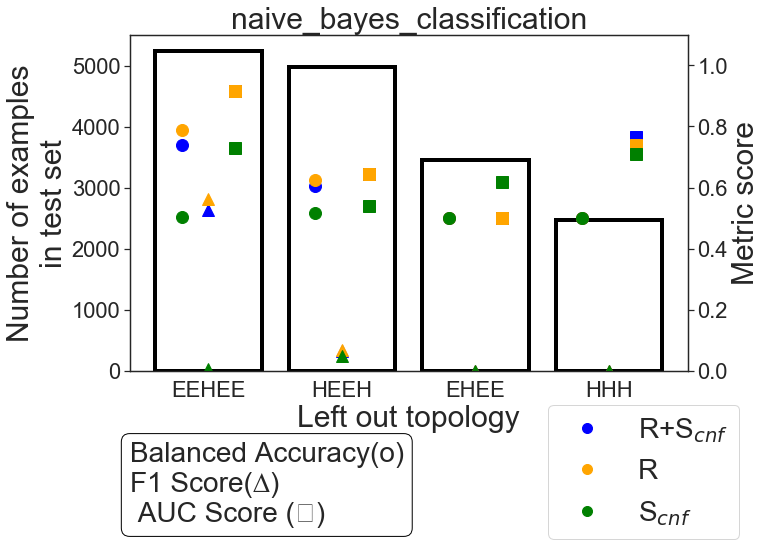

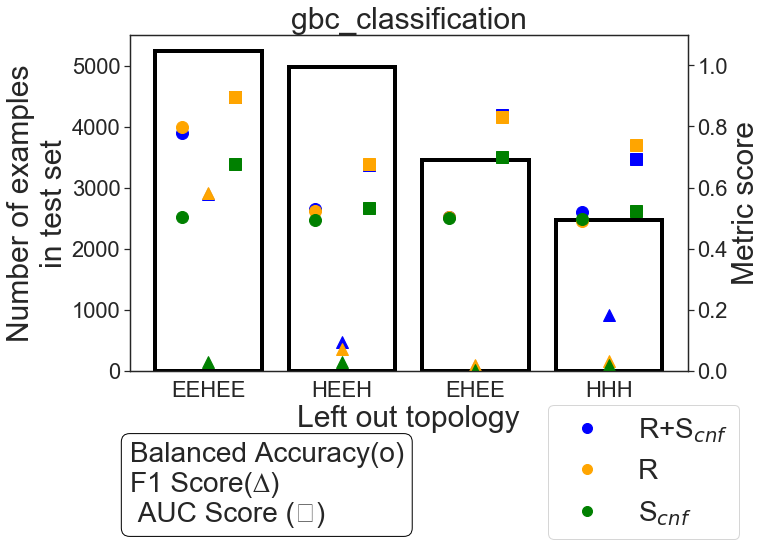

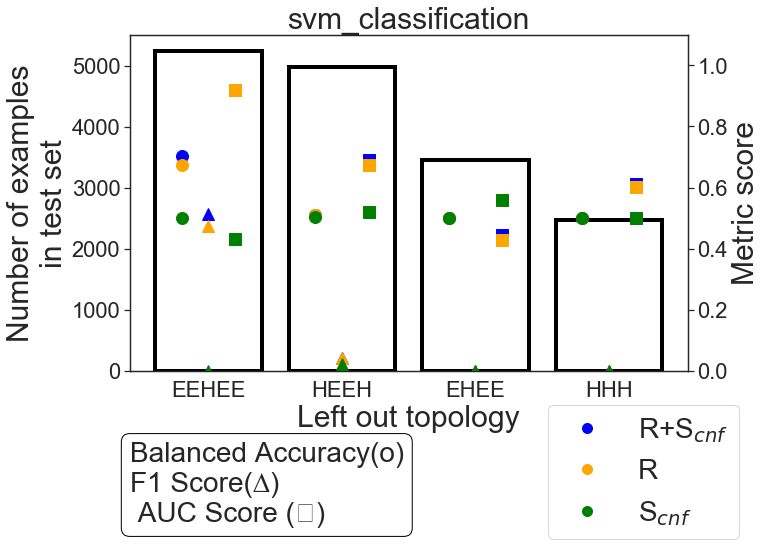

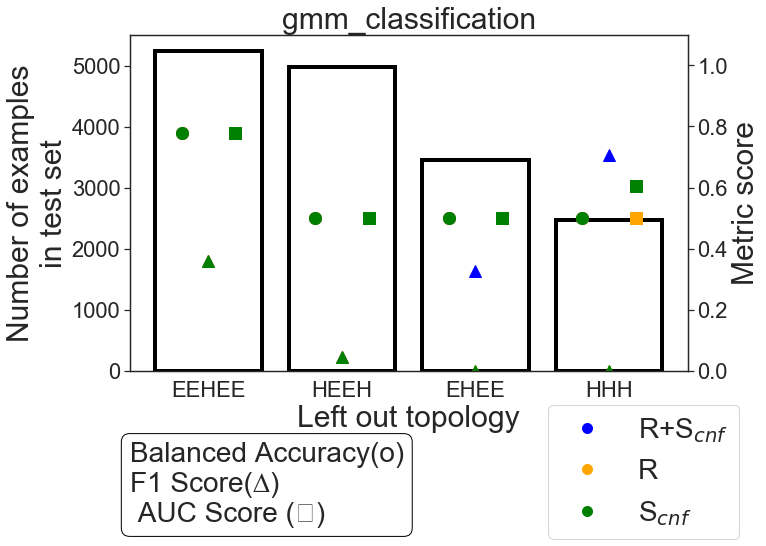

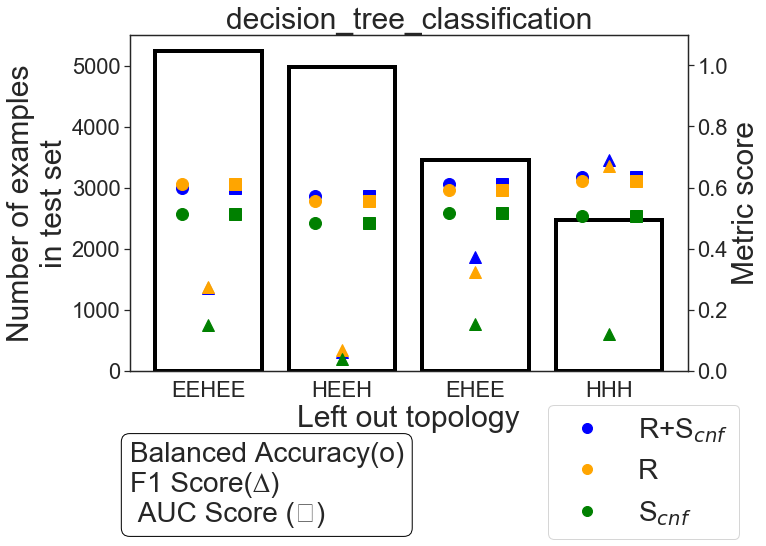

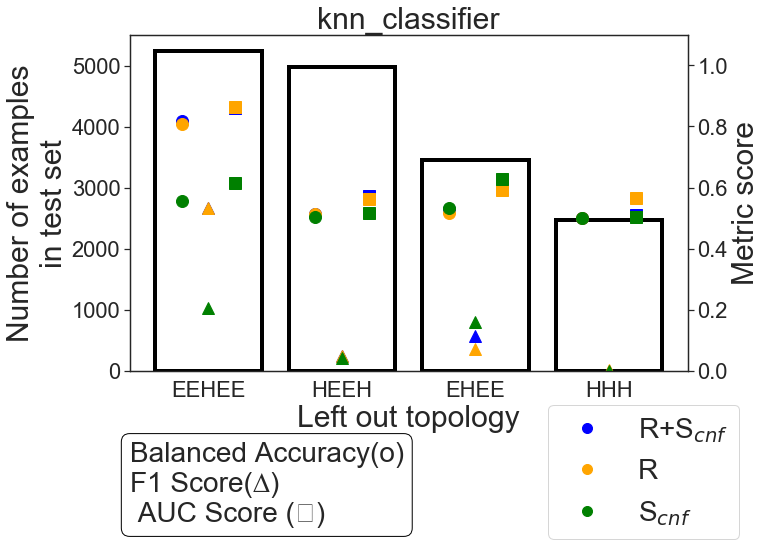

In [42]:
three_metric_barplot("./data/loo_runs_ROCKLIN.html","Left out topology")

## Longxing

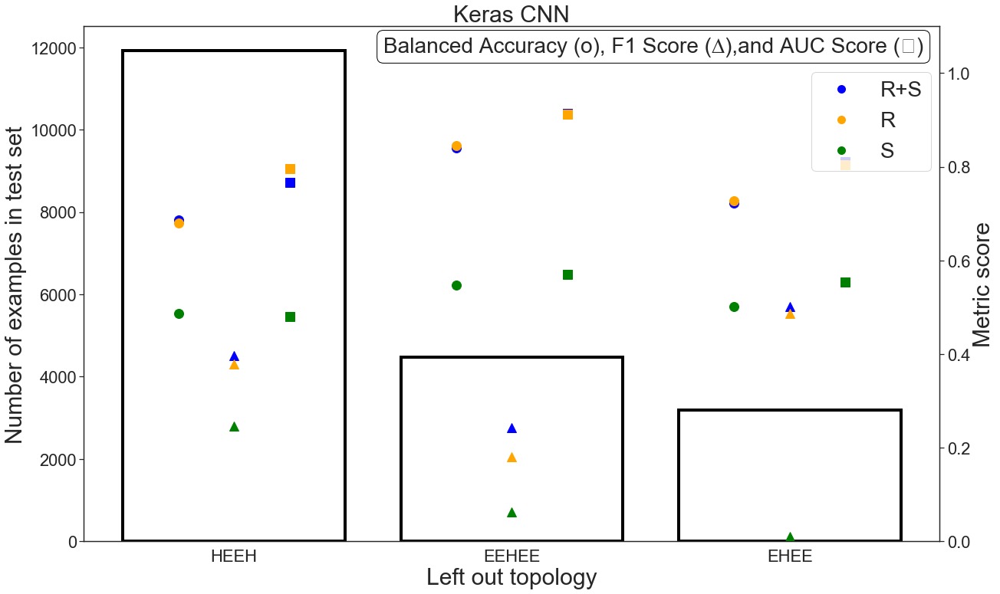

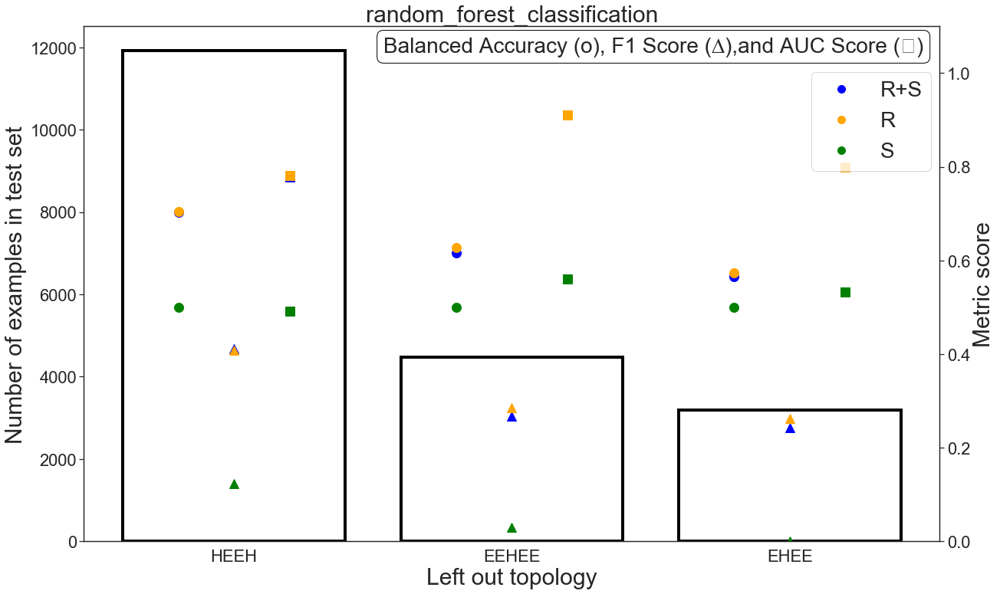

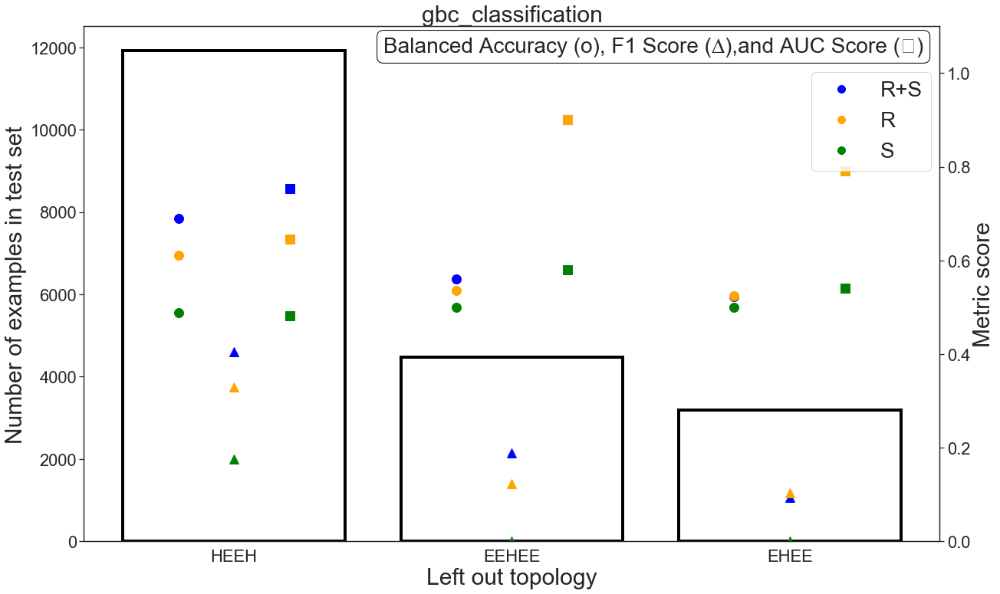

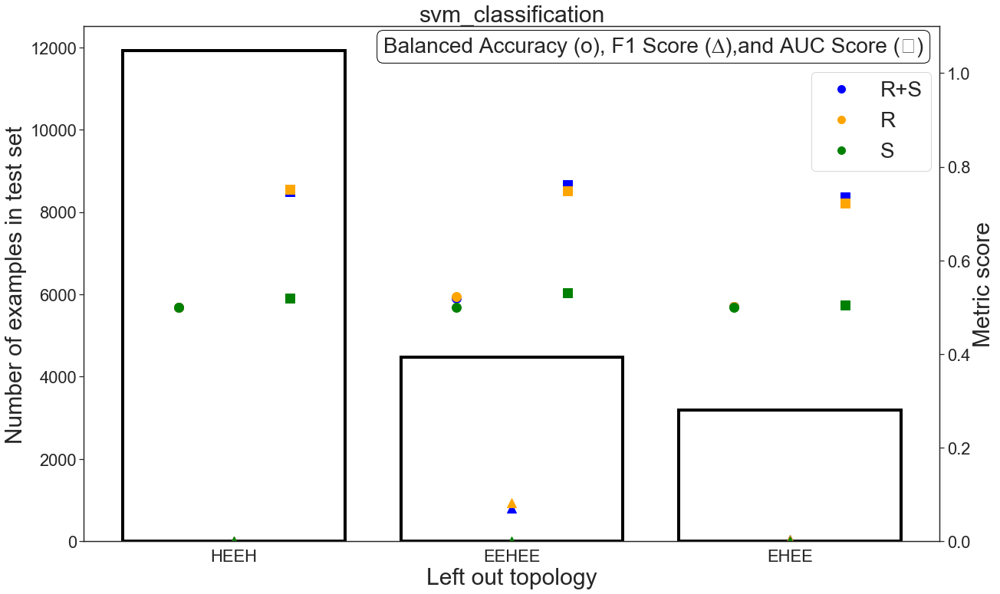

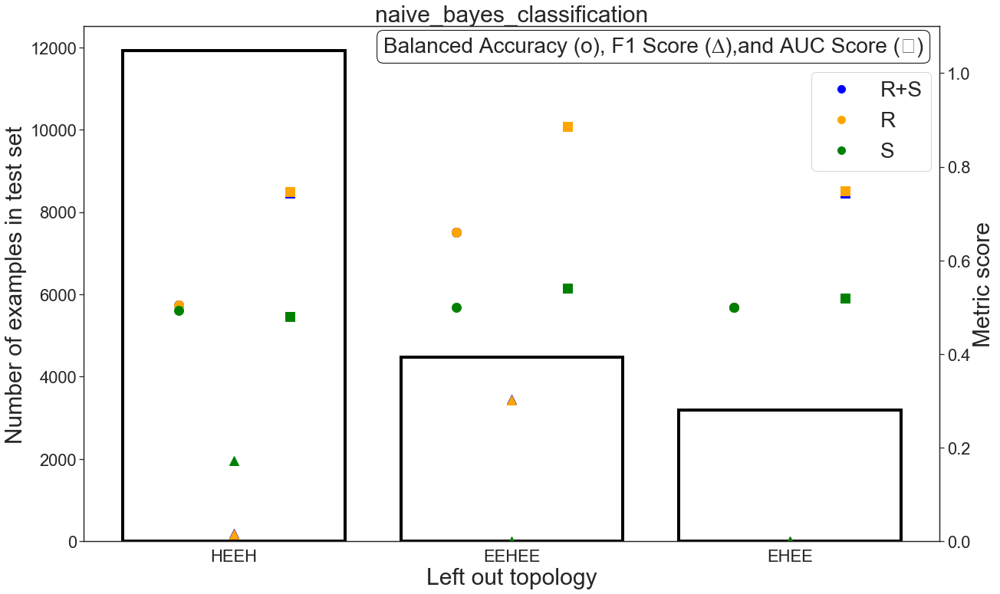

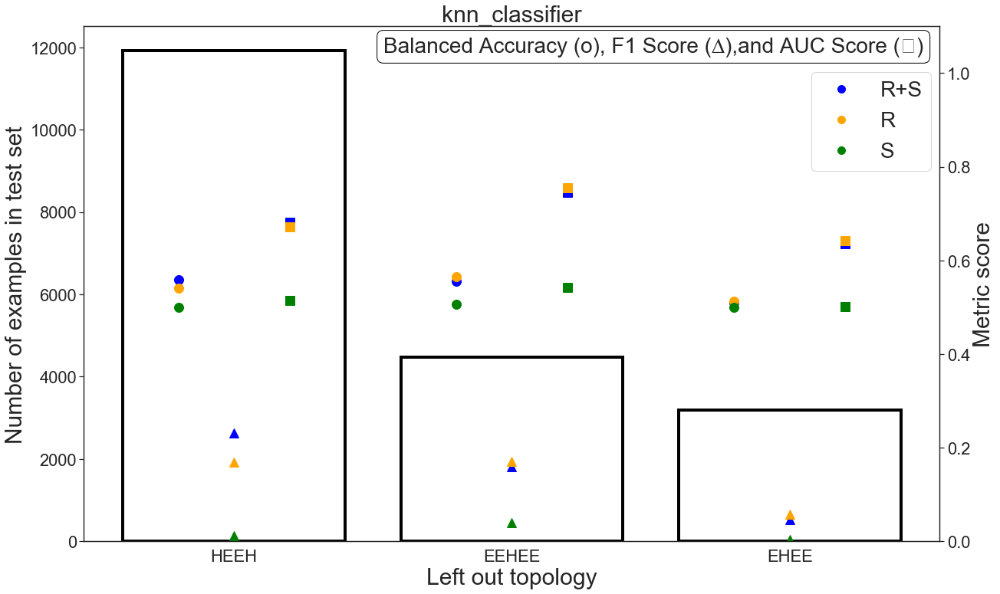

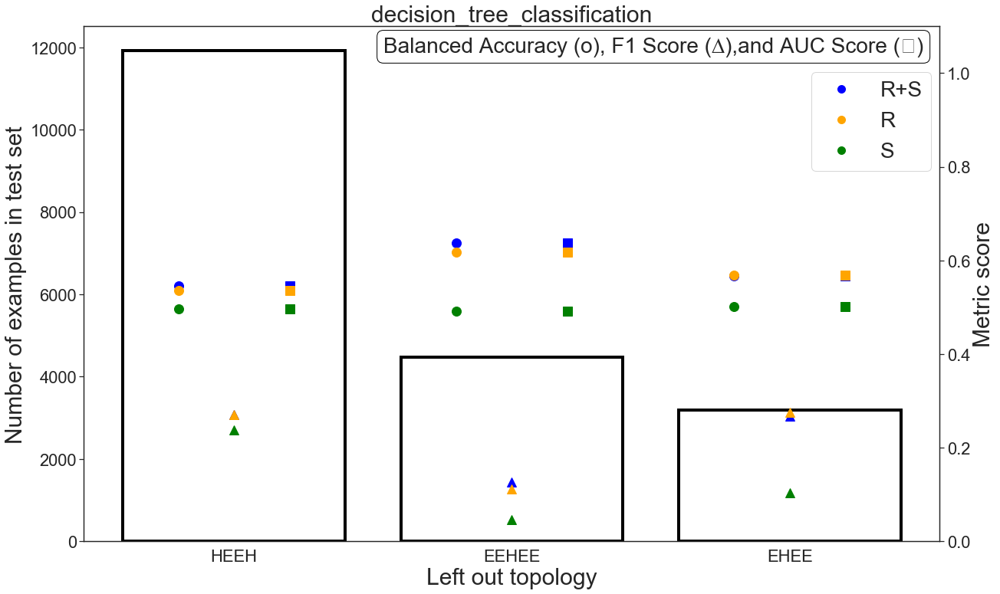

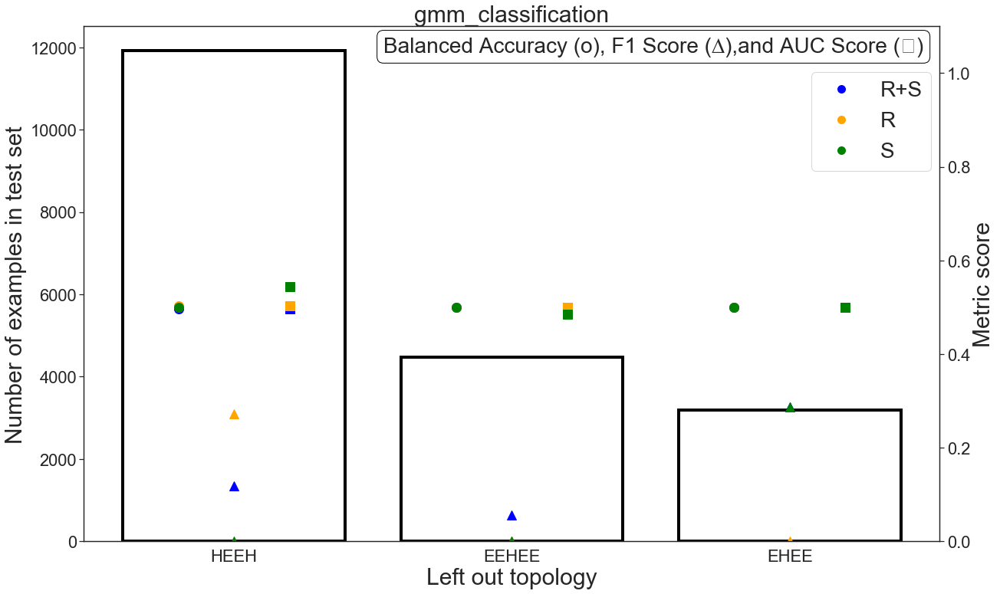

In [9]:
three_metric_barplot("./data/loo_run_LONGXING.html",xaxis_label="Left out topology")

## Using both Rocklin and Longxing

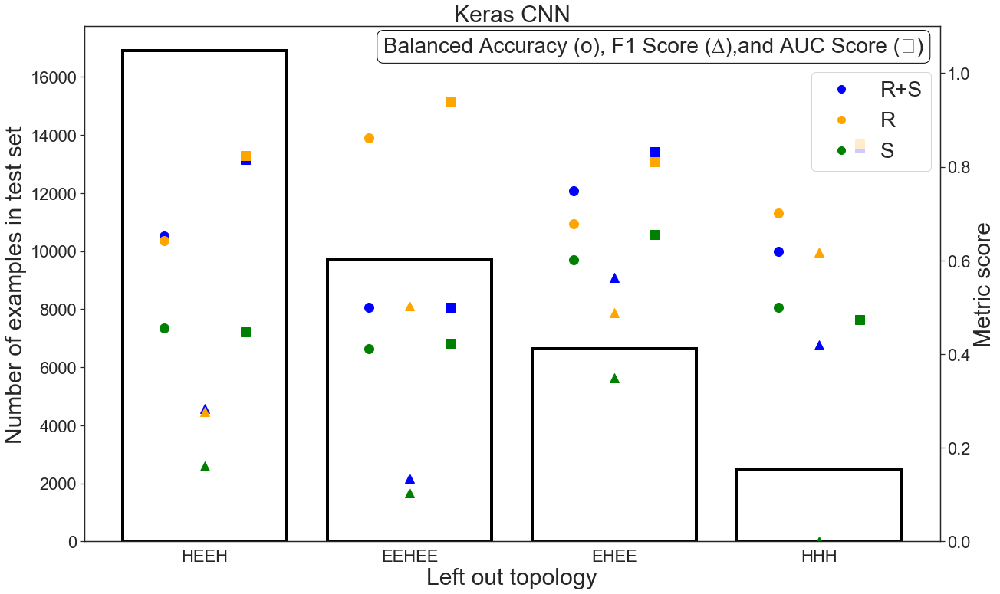

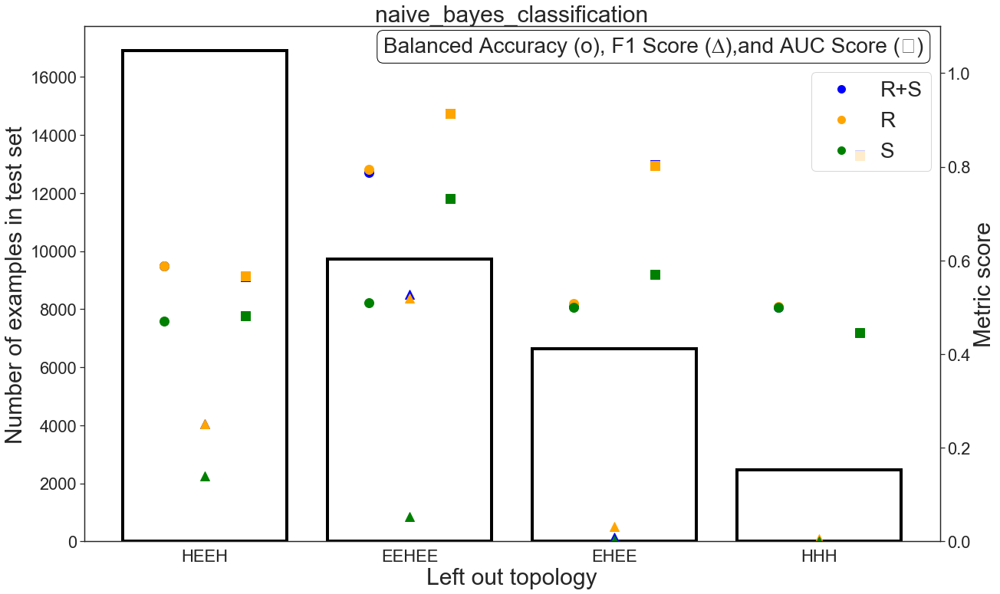

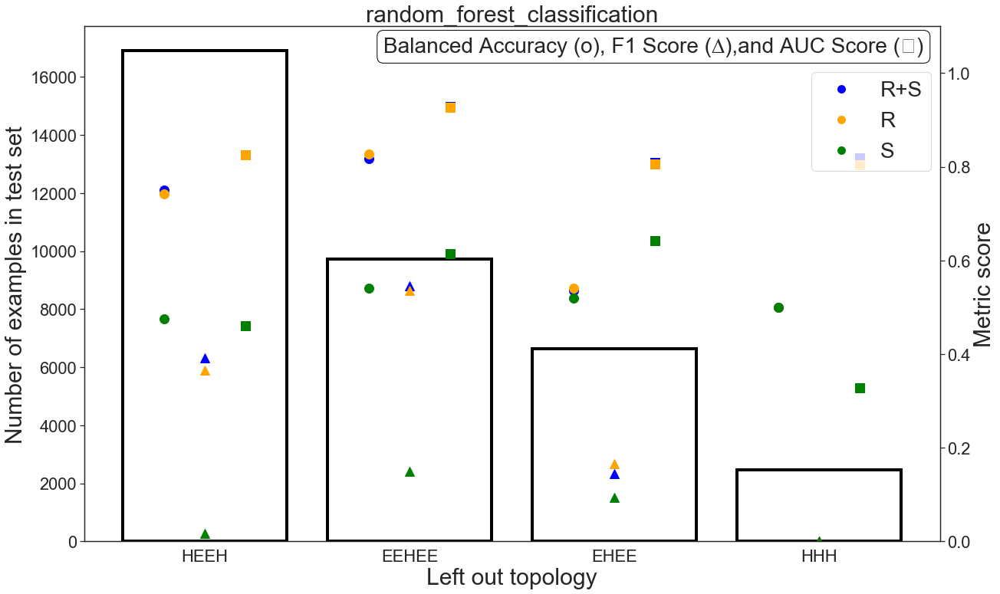

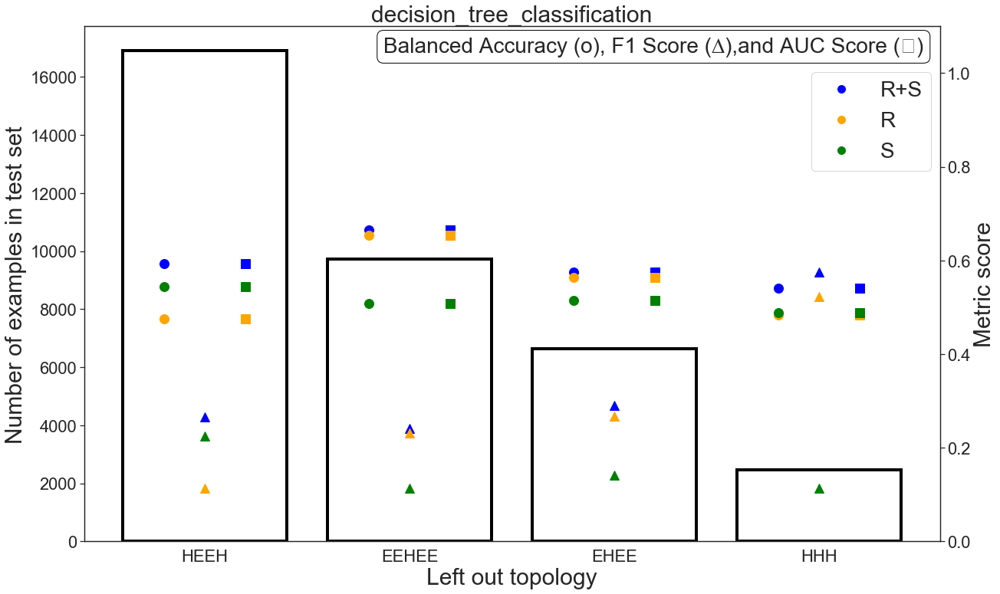

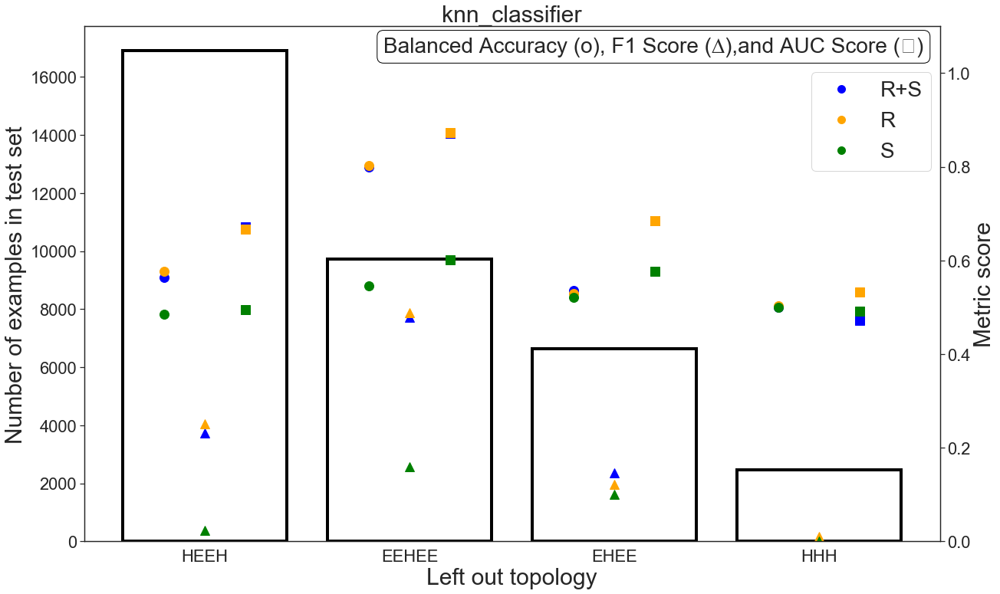

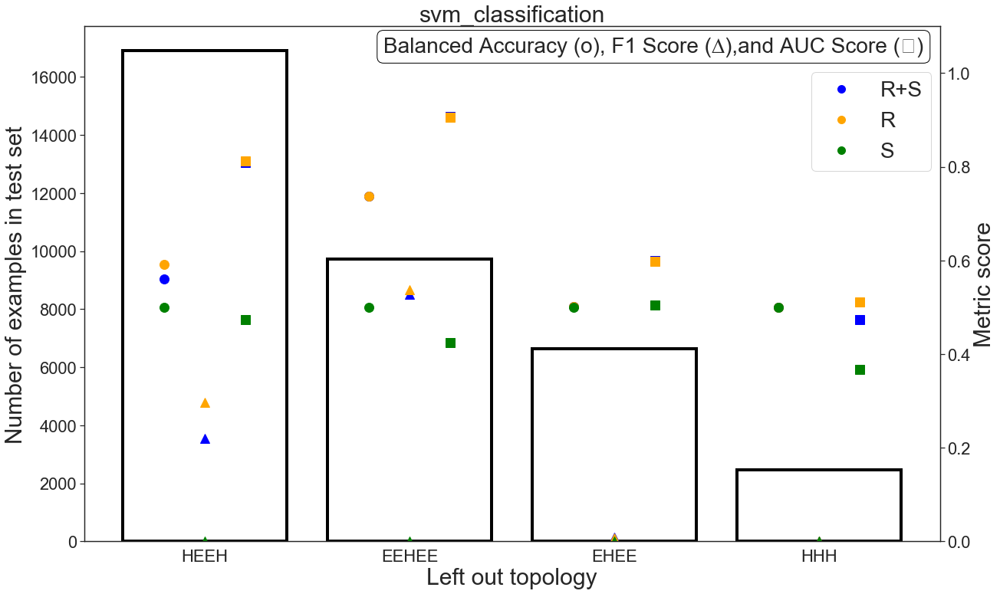

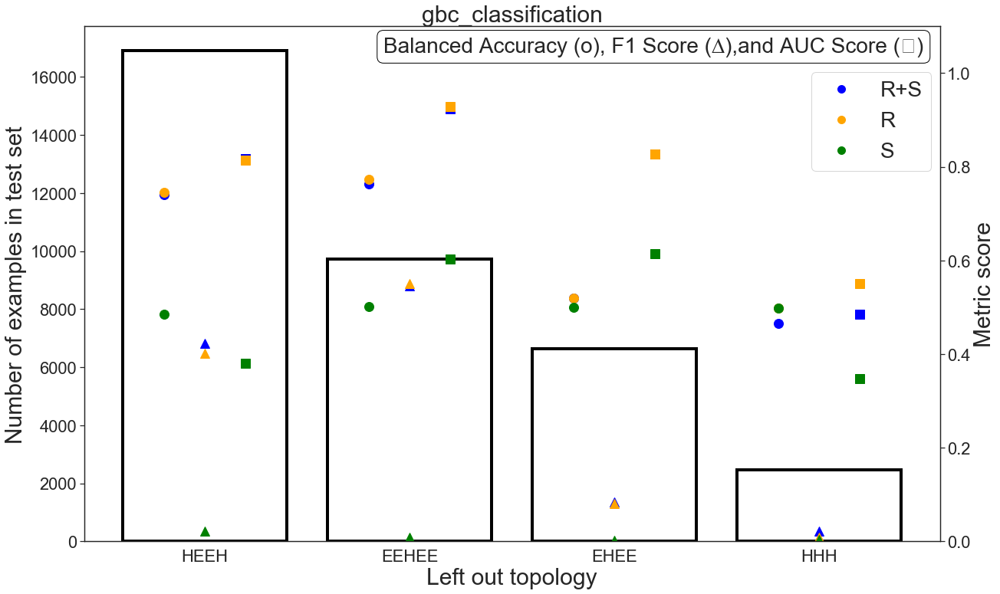

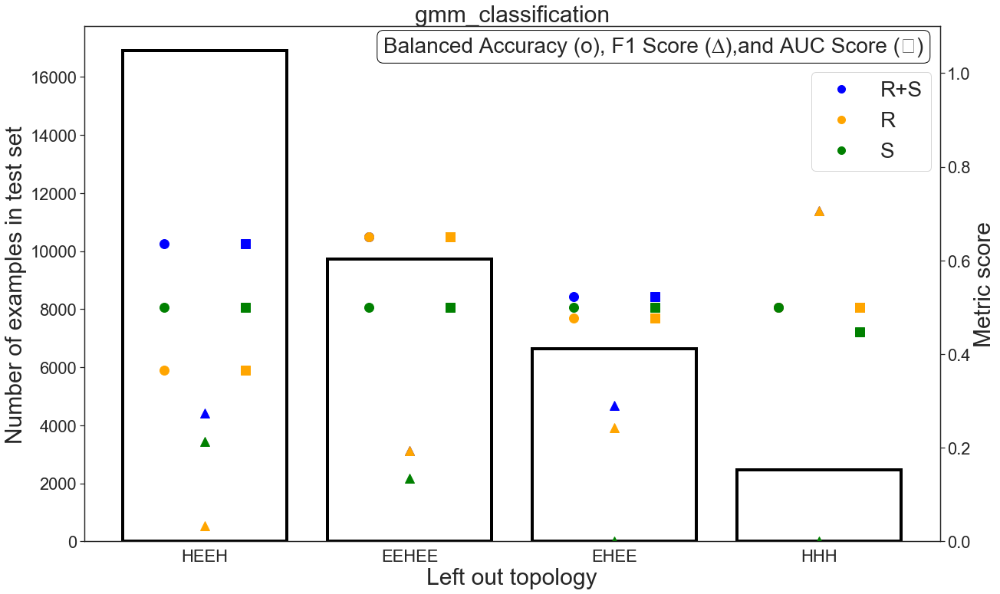

In [10]:
three_metric_barplot("./data/loo_runs_BOTH.html","Left out topology")

## Topology Specific Rocklin Pred Longxing

[0, 1, 2]
[0, 1, 2]
[0, 1, 2]


/opt/anaconda3/lib/python3.7/site-packages/matplotlib/backends/backend_agg.py:211: RuntimeWarning: Glyph 128306 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/opt/anaconda3/lib/python3.7/site-packages/matplotlib/backends/backend_agg.py:180: RuntimeWarning: Glyph 128306 missing from current font.
  font.set_text(s, 0, flags=flags)


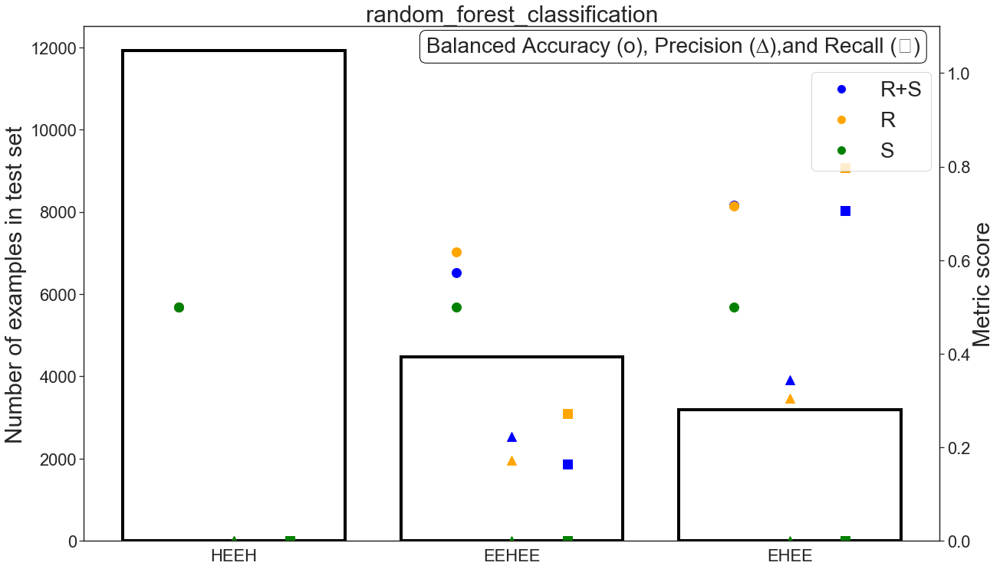

[0, 1, 2]
[0, 1, 2]
[0, 1, 2]


/opt/anaconda3/lib/python3.7/site-packages/matplotlib/backends/backend_agg.py:211: RuntimeWarning: Glyph 128306 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/opt/anaconda3/lib/python3.7/site-packages/matplotlib/backends/backend_agg.py:180: RuntimeWarning: Glyph 128306 missing from current font.
  font.set_text(s, 0, flags=flags)


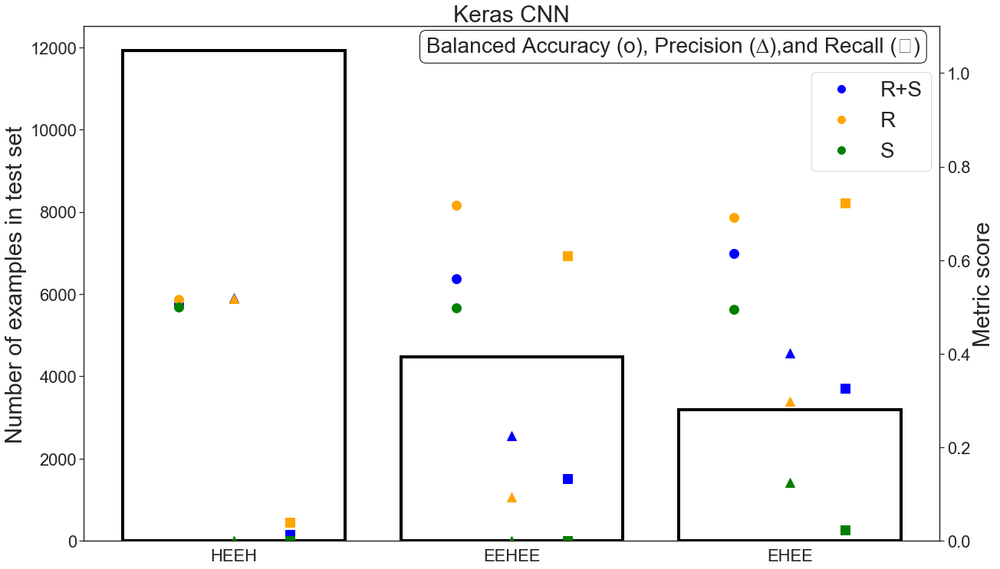

[0, 1, 2]
[0, 1, 2]
[0, 1, 2]


/opt/anaconda3/lib/python3.7/site-packages/matplotlib/backends/backend_agg.py:211: RuntimeWarning: Glyph 128306 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/opt/anaconda3/lib/python3.7/site-packages/matplotlib/backends/backend_agg.py:180: RuntimeWarning: Glyph 128306 missing from current font.
  font.set_text(s, 0, flags=flags)


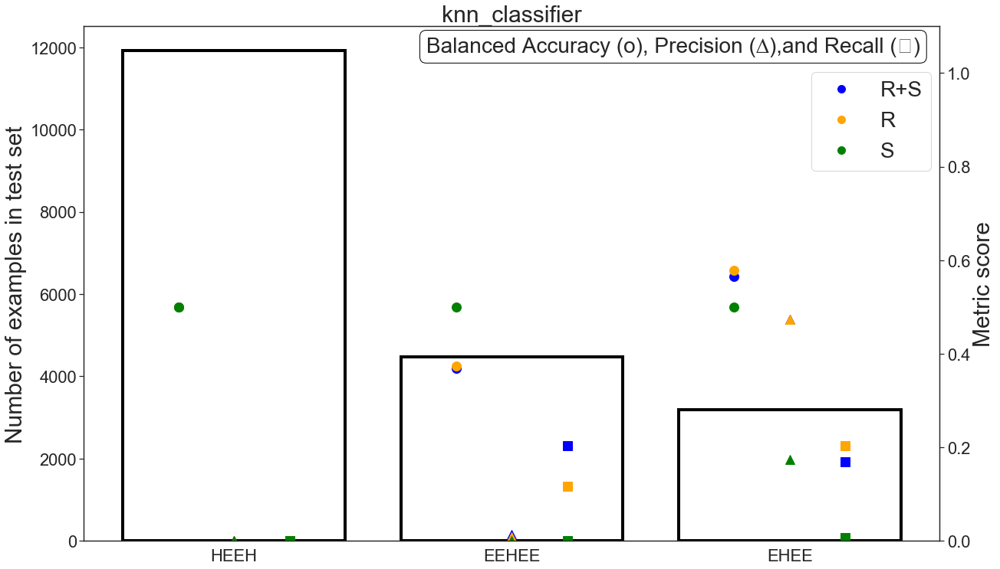

[0, 1, 2]
[0, 1, 2]
[0, 1, 2]


/opt/anaconda3/lib/python3.7/site-packages/matplotlib/backends/backend_agg.py:211: RuntimeWarning: Glyph 128306 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/opt/anaconda3/lib/python3.7/site-packages/matplotlib/backends/backend_agg.py:180: RuntimeWarning: Glyph 128306 missing from current font.
  font.set_text(s, 0, flags=flags)


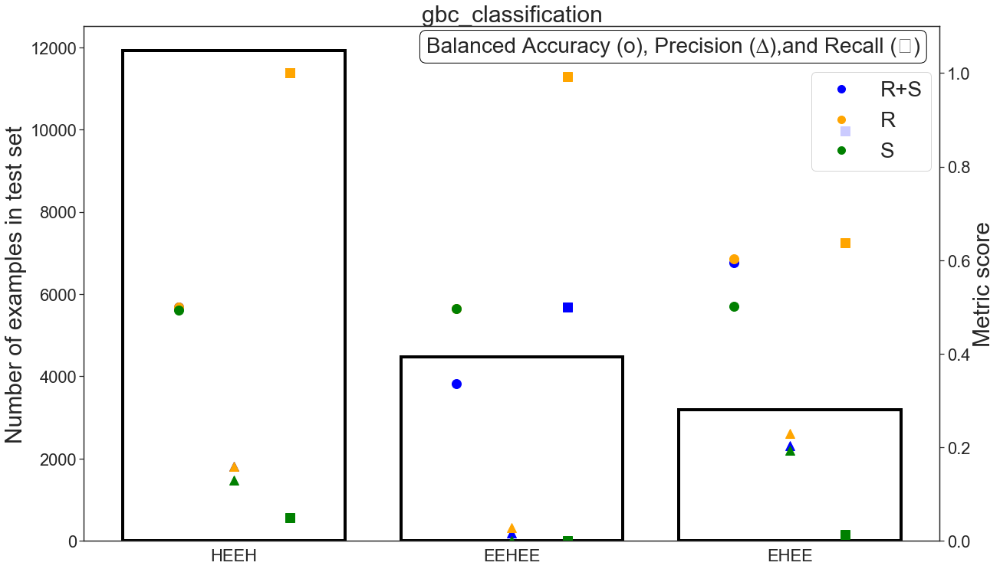

[0, 1, 2]
[0, 1, 2]
[0, 1, 2]


/opt/anaconda3/lib/python3.7/site-packages/matplotlib/backends/backend_agg.py:211: RuntimeWarning: Glyph 128306 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/opt/anaconda3/lib/python3.7/site-packages/matplotlib/backends/backend_agg.py:180: RuntimeWarning: Glyph 128306 missing from current font.
  font.set_text(s, 0, flags=flags)


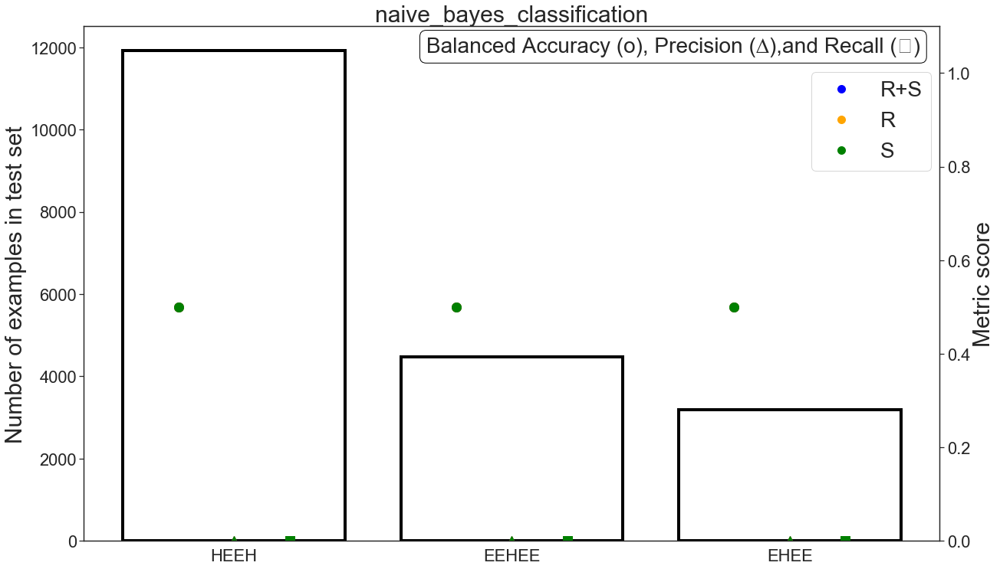

[0, 1, 2]
[0, 1, 2]
[0, 1, 2]


/opt/anaconda3/lib/python3.7/site-packages/matplotlib/backends/backend_agg.py:211: RuntimeWarning: Glyph 128306 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/opt/anaconda3/lib/python3.7/site-packages/matplotlib/backends/backend_agg.py:180: RuntimeWarning: Glyph 128306 missing from current font.
  font.set_text(s, 0, flags=flags)


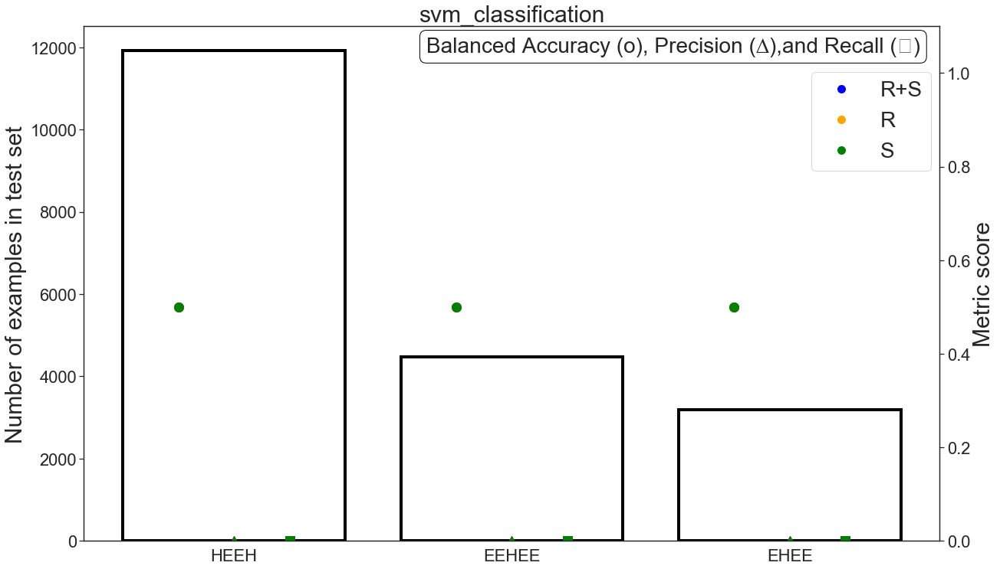

[0, 1, 2]
[0, 1, 2]
[0, 1, 2]


/opt/anaconda3/lib/python3.7/site-packages/matplotlib/backends/backend_agg.py:211: RuntimeWarning: Glyph 128306 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/opt/anaconda3/lib/python3.7/site-packages/matplotlib/backends/backend_agg.py:180: RuntimeWarning: Glyph 128306 missing from current font.
  font.set_text(s, 0, flags=flags)


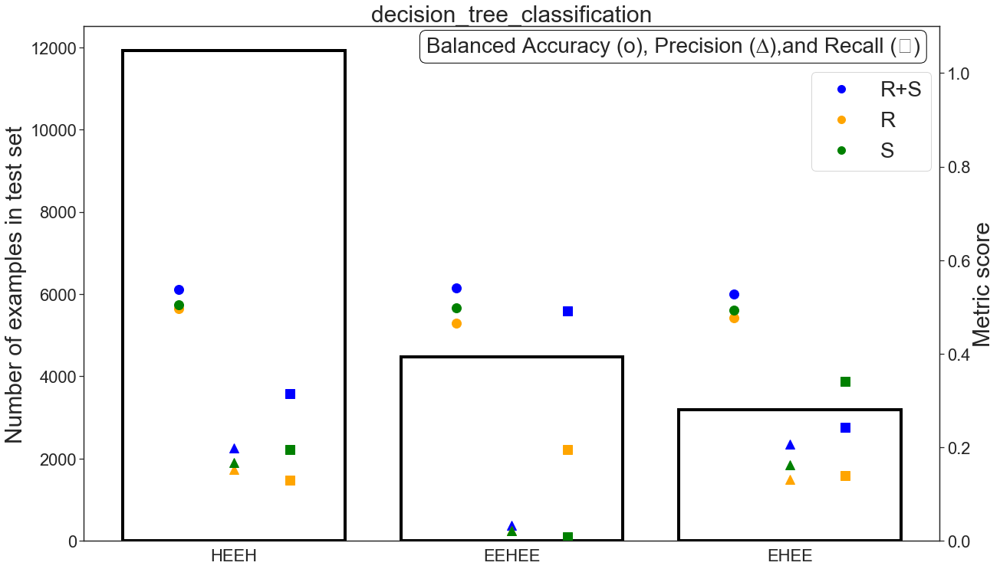

[0, 1, 2]
[0, 1, 2]
[0, 1, 2]


/opt/anaconda3/lib/python3.7/site-packages/matplotlib/backends/backend_agg.py:211: RuntimeWarning: Glyph 128306 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/opt/anaconda3/lib/python3.7/site-packages/matplotlib/backends/backend_agg.py:180: RuntimeWarning: Glyph 128306 missing from current font.
  font.set_text(s, 0, flags=flags)


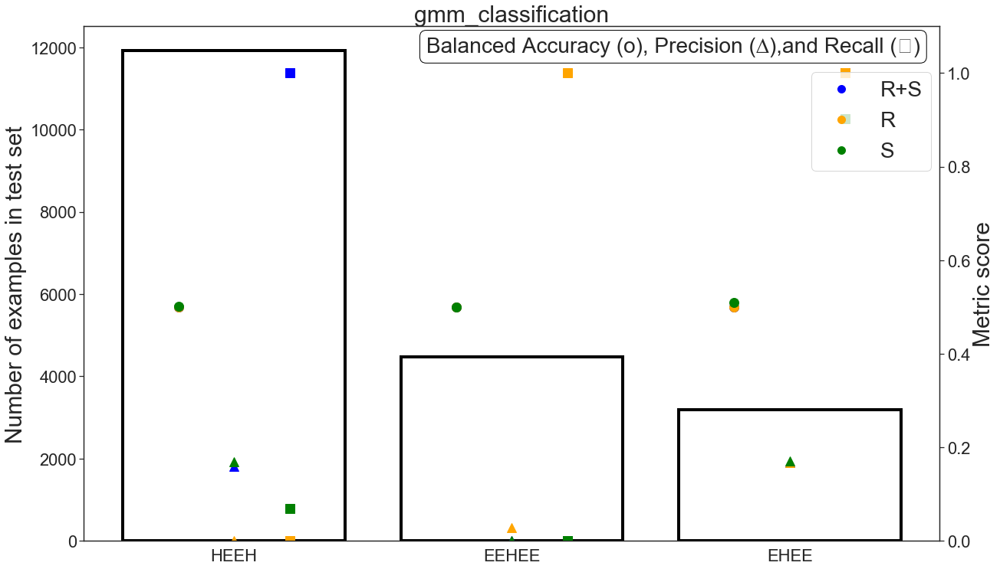

In [10]:
three_metric_barplot("./data/top_specific_rocklin_pred_longxing_leaderboard.html")

# Train on Rocklin predict on Longxing

In [129]:
leaderboard = pd.read_html("./data/rocklin_pred_longxing_results.html")[0]
leaderboard = leaderboard.replace('__init__','keras cnn')
metric_list = ['Accuracy','Balanced Accuracy','AUC Score',
            'Average Precision','F1 Score','Precision','Recall']
models_list = leaderboard['Model Name'].unique()

In [130]:
#initialize empty list for storing dataframe rows
data = []


#iterate through each metric
for metric in metric_list:
    #initialize empty list that will contain each row entry
    row = []
    
    
    row.append(f"∆{metric}")


    #iterate through each model
    for model in models_list:
        #get dataframe subset that only contains the given model
        model_df = leaderboard[leaderboard["Model Name"]==model]

        #separate between RS and R values
        RS_model_df = model_df[model_df["Data and Split Description"]=="RS"]
        R_model_df = model_df[model_df["Data and Split Description"]=="R"]

        #get difference in metric between each
        avg_diff = np.average(RS_model_df[metric].values - R_model_df[metric].values)
        std_diff = np.std(RS_model_df[metric].values - R_model_df[metric].values)
        # save what the Rosetta model performance was
        baseline = R_model_df[metric].mean()
        
        
        row.append((avg_diff,std_diff,baseline))
        
    data.append(row)
    #data_raw.append(row_raw)


cols = models_list.tolist()
cols.insert(0,"∆Metric")

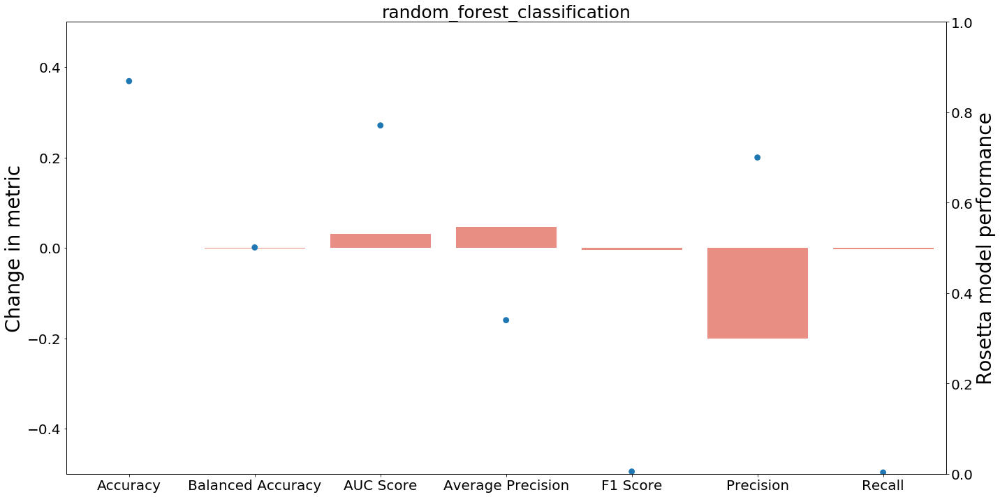

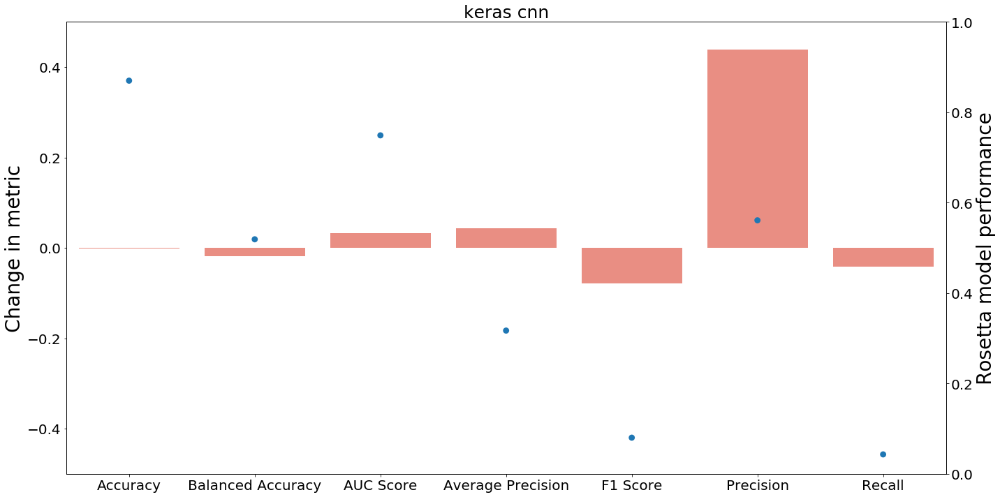

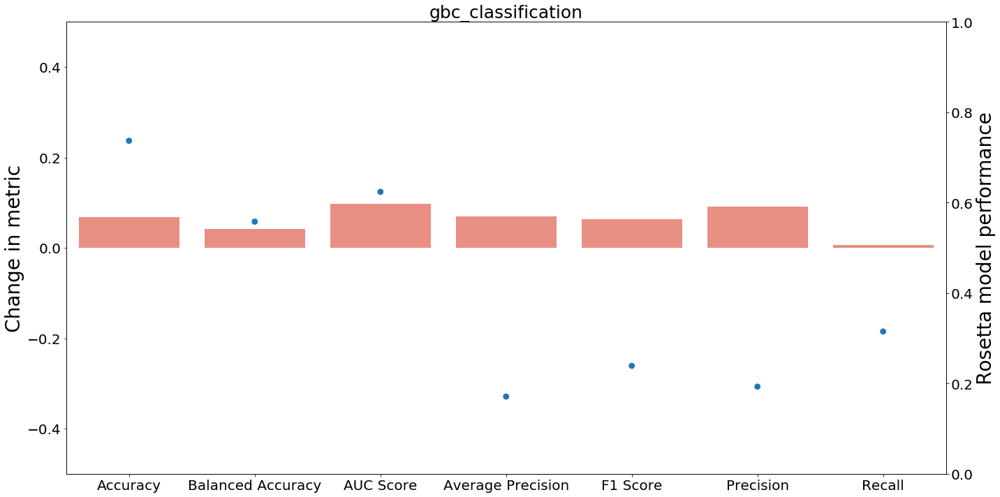

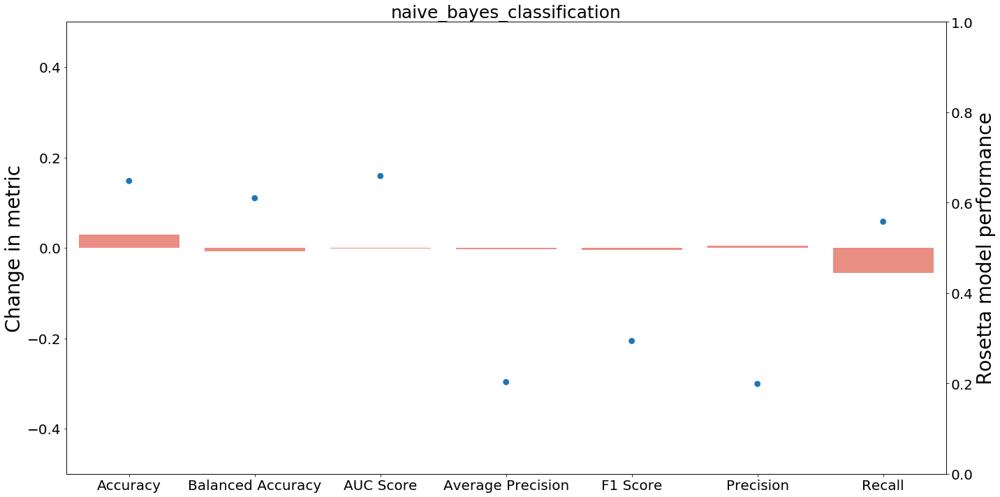

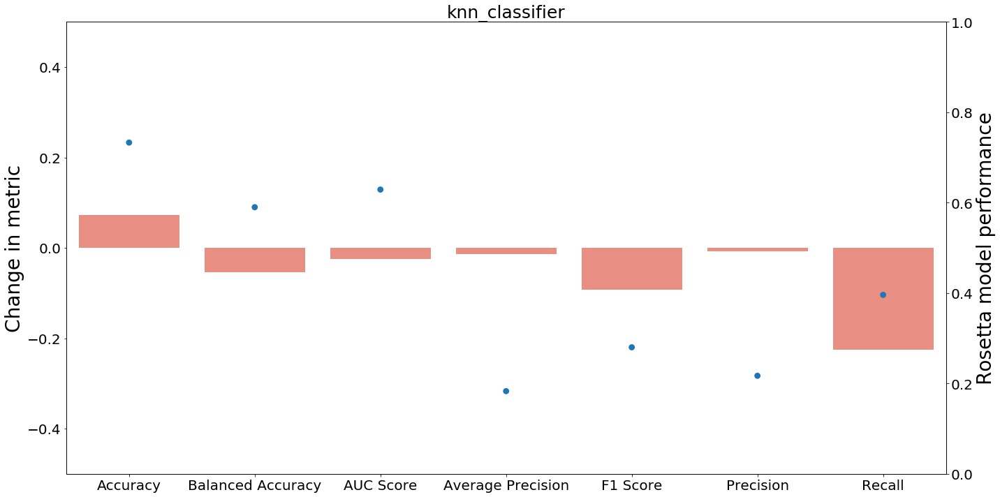

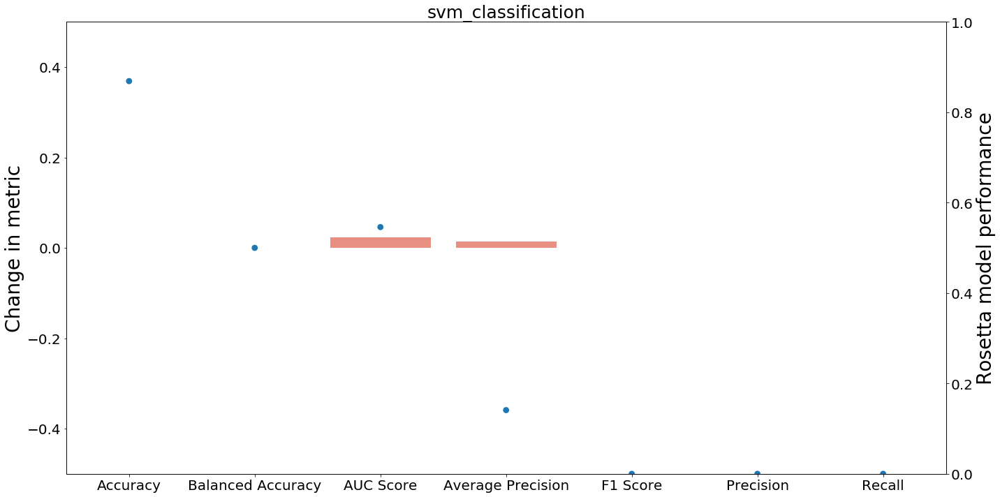

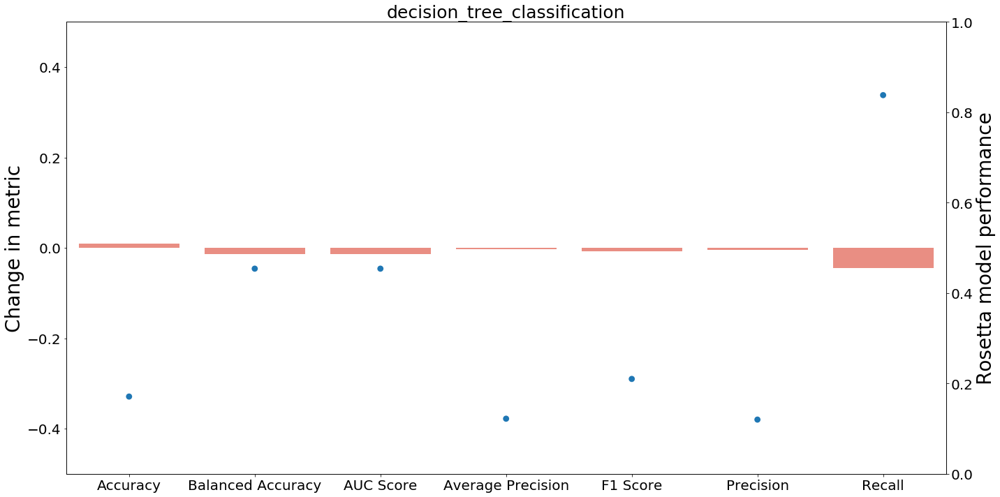

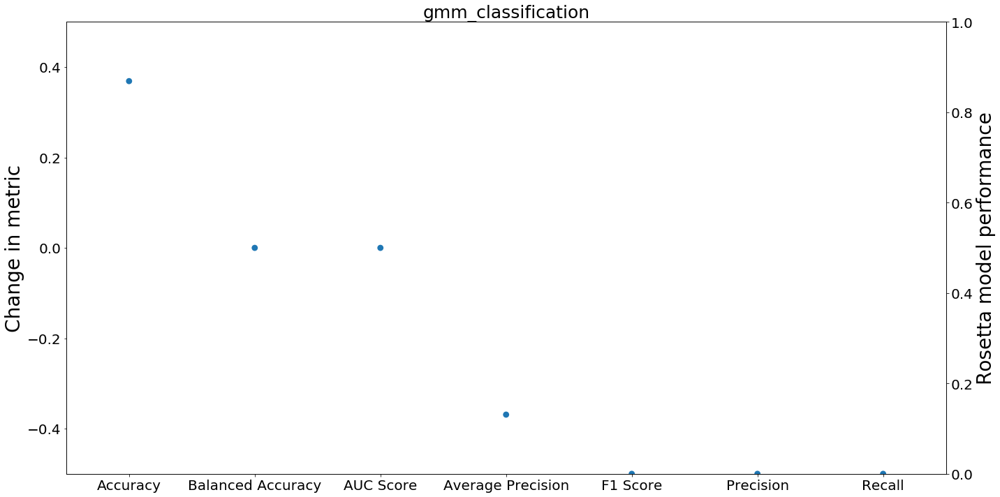

In [131]:
leaderboard[leaderboard["Model Name"]=="gbc_classification"][["Precision","Data and Split Description"]]

boop  = pd.DataFrame(data,columns=cols)

#iterate through columns except first
for col in range(len(boop.iloc[0,:])-1):
    
    averages = []
    sigmas = []
    performances = []
    for row in range(len(boop.iloc[:,0])):
        averages.append(boop.iloc[row,col+1][0])
        sigmas.append(boop.iloc[row,col+1][1])
        performances.append(boop.iloc[row,col+1][2])
#         print(averages)
#         print(sigmas)
    plt.figure(figsize=(20,10))
    plt.title(f"{models_list[col]}",fontsize='25')
    plt.xticks(fontsize='20')
    plt.ylabel("Change in metric",fontsize='28')
    plt.ylim(-.5,.5)
    plt.yticks(fontsize='20')

    ax = plt.gca()
    ax2 = plt.twinx()
    ax2.tick_params(axis='y',labelsize='20')
    
    
    
    g = sns.barplot(x=metric_list,y=averages,yerr=sigmas,ax=ax,color='salmon')
    sns.pointplot(x=metric_list,y=performances,ax=ax2,join=False)
    
    # plt.legend()
    
    
    plt.ylabel("Rosetta model performance",fontsize='28')
    plt.ylim(0,1)
    plt.tight_layout()
    plt.show()

boop  = pd.DataFrame(data,columns=cols)
x_l = [] # name of metric
a_l = [] # average performance 
s_l= [] # standard dev of performance
n_l = [] # name of model
p_l= [] # performance of Rosetta model

#iterate through columns except first
for col in range(len(boop.columns)-1):
    #print(col)
    averages = []
    sigmas = []
    performances = []
    for row in range(len(boop.iloc[:,0])):
        averages.append(boop.iloc[row,col+1][0])
        sigmas.append(boop.iloc[row,col+1][1])
        performances.append(boop.iloc[row,col+1][2])
    
    x_l.append(metric_list)
    a_l.append(averages)
    s_l.append(sigmas)
    n_l.append([boop.columns[col+1]]*len(sigmas))
    p_l.append(performances)
  

In [132]:
leaderboard = pd.read_html("./data/rocklin_pred_longxing_results.html")[0]
leaderboard = leaderboard.replace('__init__','keras cnn')
metric_list = ['Accuracy','Balanced Accuracy','AUC Score',
            'Average Precision','F1 Score','Precision','Recall']
models_list = leaderboard['Model Name'].unique()


#initialize empty list for storing dataframe rows
data_raw = []

#iterate through each metric
for metric in metric_list:
    #initialize empty list that will contain each row
    row_raw = []
    
    

    #iterate through each model
    for model in models_list:
        #get dataframe subset that only contains the given model
        model_df = leaderboard[leaderboard["Model Name"]==model]

        #separate between RS and R values
        RS_model_df = model_df[model_df["Data and Split Description"]=="RS"]
        R_model_df = model_df[model_df["Data and Split Description"]=="R"]

        #get difference in metric between each
        raw_diff = RS_model_df[metric].values - R_model_df[metric].values
        
        #print(f"{len(raw_diff)}-instances for {metric} in {model} model")

        #row_raw.append([[f"∆{metric}"]]*len(raw_diff))
        a = [[f"{metric}"]]*len(raw_diff)
        b = raw_diff.reshape(-1,1)
        c = [[f"{model}"]]*len(raw_diff)
        
        #get the Rosetta model performance
        c2 = R_model_df[metric].values.reshape(-1,1)
        
        d = np.concatenate([a,b,c,c2],axis=1)
        
        
        
        for di in d:
            data_raw.append(di)
        


cols = ["Metric","Score","Model Name","R Model Performance"]

df_raw = pd.DataFrame(data_raw, columns=cols)
df_raw["Score"] = df_raw["Score"].map(float)

new_vector = []

#flatten the list of averages
flat_list_metric = [item for sublist in x_l for item in sublist]
flat_list_avg = [item for sublist in a_l for item in sublist]
flat_list_std = [item for sublist in s_l for item in sublist]
flat_list_names = [item for sublist in n_l for item in sublist]
flat_list_performance = [item for sublist in p_l for item in sublist]
    

for group in zip(
                    flat_list_metric,
                    flat_list_names, 
                    flat_list_avg, 
                    flat_list_std,
                    flat_list_performance
                ):
    new_vector.append(list(group))
df = pd.DataFrame(new_vector,columns=["Metric","Model","Average","Err","R Model Performance"])
translator = {
    "svm_classification":"SVM",
    "random_forest_classification":"RFC",
    'keras cnn':"CNN",
    "gbc_classification":"GBC",
    "knn_classifier":"K-NN",
    "naive_bayes_classification":"NBC",
    "decision_tree_classification":"DTC",
    "gmm_classification":"GMM"
    
}
df["Model"] = [translator[i] for i in df["Model"].values]
df_raw["Model Name"] = [translator[i] for i in df_raw["Model Name"].values]

/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:3695: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


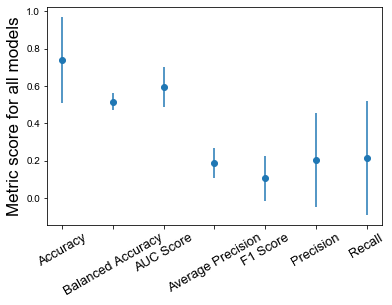

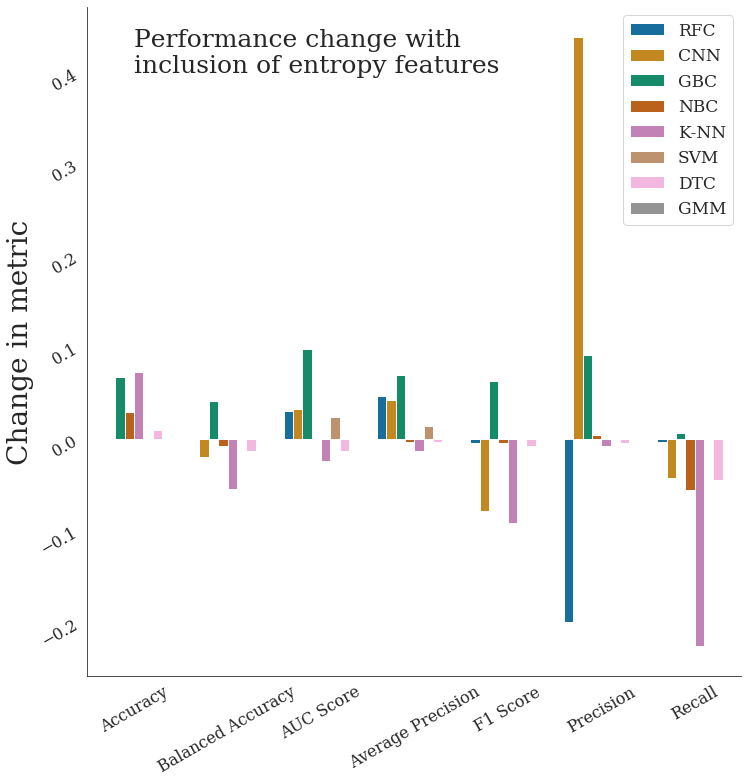

In [133]:
plt.figure()
plt.errorbar(
        x=metric_list,
        y=leaderboard[metric_list].mean(),
        yerr=leaderboard[metric_list].std(),
        fmt='o')

plt.xticks(rotation=30)
plt.ylabel("Metric score for all models",fontsize='17')
plt.xticks(fontsize='13')

leaderboard[["Model Name","Data and Split Description"]+metric_list]

sns.set_style("white")
plt.rc('font', family='serif') # change font types for plots
plt.rc('xtick', labelsize='medium')
plt.rc('ytick', labelsize='medium')
g = sns.catplot(x="Metric",y="Average",hue="Model",data=df,kind='bar',palette="colorblind",
                size=10,legend_out=False,ci=95)

#ax2 = plt.twinx()
# g2 = sns.pointplot(x="Metric",y="R Model Performance",hue='Model',
#                   data=df,ax=ax2,join=False,legend_out=False)

#g2.get_legend().remove()


# g.axes[0,0].set_title("Average Change in Model Performance",fontsize="28")
g.axes[0,0].tick_params(axis='both', which='major', labelsize=16,rotation=30)
g.axes[0,0].set_xlabel("")
g.axes[0,0].set_ylabel("Change in metric",fontsize='28')
g.axes[0,0].legend(fontsize='17')

plt.text(0,.4,s="Performance change with\ninclusion of entropy features",fontsize='25')


#plt.savefig("Figure4",dpi=600,bbox_inches="tight")
plt.show()

# Heat map plot generation

## Preprocessing

In [72]:
# read in results of combinatorial runs
heatmap_leaderboard = pd.read_html("./data/heatmap_leaderboard.html")[0]
heatmap_leaderboard["Model Name"] = heatmap_leaderboard["Model Name"].replace("__init__","Keras CNN")

# read in results of topoly specific runs for Rocklin
top_specific_leaderboard_rocklin = pd.read_html("./data/top_specific_Rocklin_leaderboard.html")[0]

# read in results of topoly specific runs for Longxing
top_specific_leaderboard_longxing = pd.read_html("./data/top_specific_Longxing_leaderboard.html")[0]


# dataset used
master_dataframe = pd.read_csv("./data/df_aggregated_spc.csv")
master_dataframe['stabilityscore_cnn_calibrated_2classes'] = master_dataframe["stabilityscore_cnn_calibrated"] > 1

In [73]:
# split up the "RS Rocklin-HHH Rocklin-EHEE"-like column into ["RS","Rocklin-HHH","Rocklin-EHEE"] then only keep the "RS" part
data_description = heatmap_leaderboard["Data and Split Description"].apply(lambda x: x.split()[0])



# split up the "RS Rocklin-HHH Rocklin-EHEE"-like column into ["RS","Rocklin-HHH","Rocklin-EHEE"] then only keep the topology part
train_topology_col = heatmap_leaderboard["Data and Split Description"].apply(lambda x: x.split()[1])
test_topology_col = heatmap_leaderboard["Data and Split Description"].apply(lambda x: x.split()[2])


heatmap_leaderboard["Data and Split Description"] = data_description
heatmap_leaderboard["train topology"] = train_topology_col
heatmap_leaderboard["test topology"] = test_topology_col


In [74]:
# Fix the Rocklin, topology specific runs so that they can fit into heatmap
# split up the "RS HHH"-like column into ["RS","HHH"] then only keep the "RS" part
data_description = top_specific_leaderboard_rocklin["Data and Split Description"].apply(lambda x: x.split()[0])



# split up the "RS HHH"-like column into ["RS","HHH"] then only keep the topology part
topology_col = top_specific_leaderboard_rocklin["Data and Split Description"].apply(lambda x: x.split()[1])
topology_col = ["Rocklin-"+i for i in topology_col] # add a tag saying this comes from "Rocklin"


top_specific_leaderboard_rocklin["Data and Split Description"] = data_description
top_specific_leaderboard_rocklin["topology"] = topology_col



In [75]:
# Fix the Longxing, topology specific runs so that they can fit into heatmap
# split up the "RS HHH"-like column into ["RS","HHH"] then only keep the "RS" part
data_description = top_specific_leaderboard_longxing["Data and Split Description"].apply(lambda x: x.split()[0])



# split up the "RS HHH"-like column into ["RS","HHH"] then only keep the topology part
topology_col = top_specific_leaderboard_longxing["Data and Split Description"].apply(lambda x: x.split()[1])
topology_col = ["Longxing-"+i for i in topology_col] # add a tag saying this comes from "Rocklin"


top_specific_leaderboard_longxing["Data and Split Description"] = data_description
top_specific_leaderboard_longxing["topology"] = topology_col



In [76]:
# all classification model metrics
metric_list = list(heatmap_leaderboard.columns[6:-12])

## Raw results

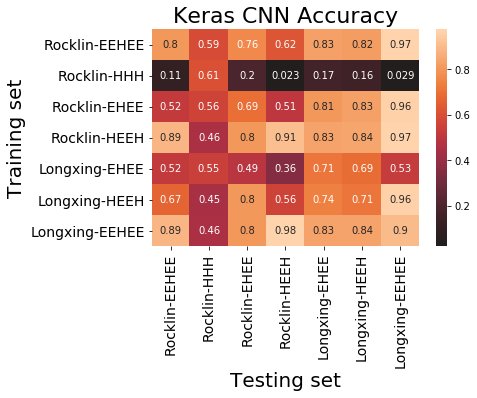

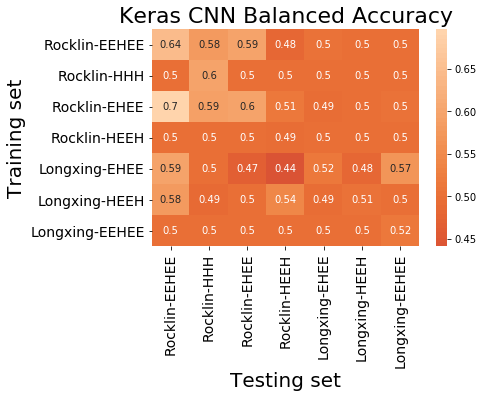

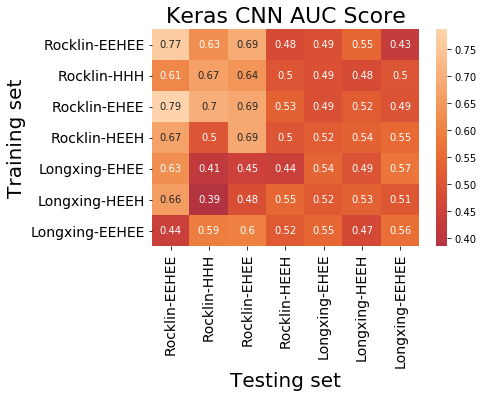

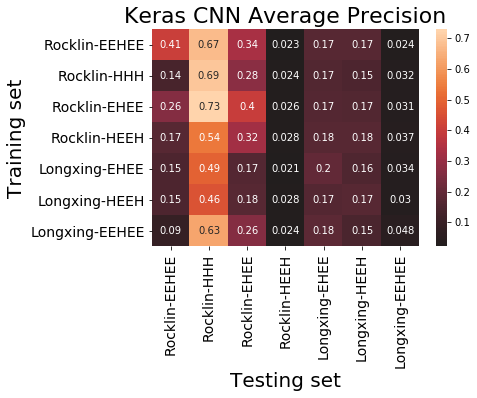

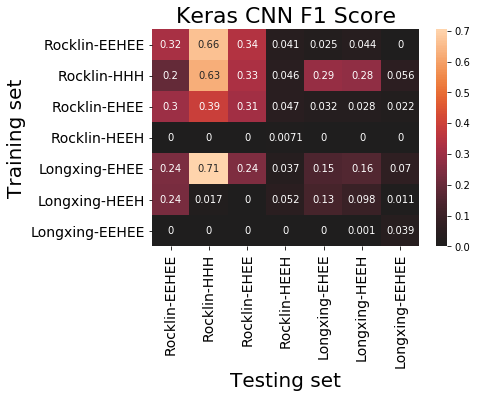

...

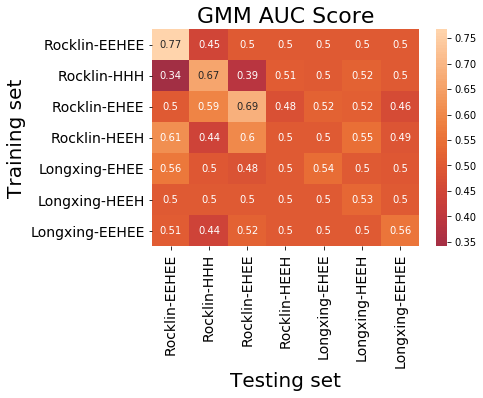

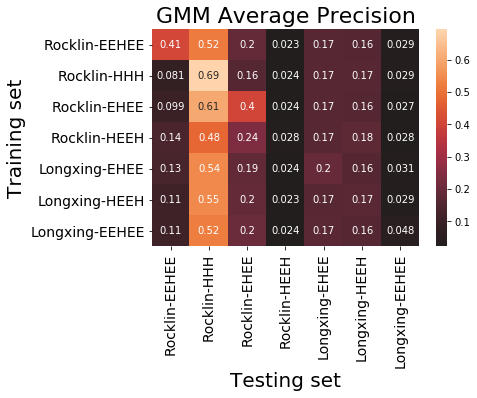

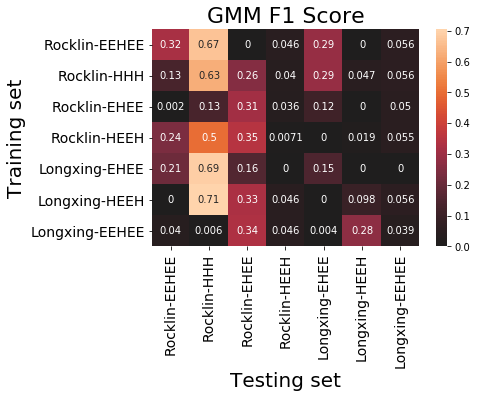

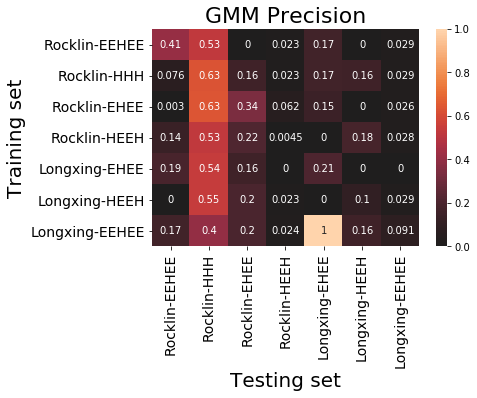

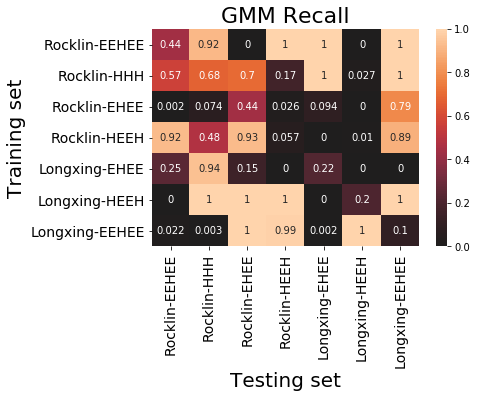

In [84]:
translator = {
    "svm_classification":"SVM",
    "random_forest_classification":"RFC",
    'Keras CNN':"Keras CNN",
    "gbc_classification":"GBC",
    "knn_classifier":"K-NN",
    "naive_bayes_classification":"NBC",
    "decision_tree_classification":"DTC",
    "gmm_classification":"GMM"
    
}

sns.reset_orig()

for model in heatmap_leaderboard["Model Name"].unique():

    model_heatmap_leaderboard = heatmap_leaderboard[heatmap_leaderboard["Model Name"]==model]

    for m in range(len(metric_list)):

        # list of unique topologies
        topology_list = list(top_specific_leaderboard_rocklin['topology'].unique())+list(top_specific_leaderboard_longxing['topology'].unique()) # list of unique topologies

        metric = metric_list[m] # metric to visualize
        #description = "RS" # contains Rosetta and Entropy features
        description = "S" # contains only Entropy features



        matrix = []
        for i in range(len(topology_list)):
            # init empty list for storing each row
            row = []

            train_pair = topology_list[i]
#             print("train: ",train_pair)
            for j in range(len(topology_list)):
                test_pair = topology_list[j]
                
#                 print("test: ",test_pair)

                train_dataset, train_topology = topology_list[i].split("-")
                test_dataset, test_topology = topology_list[j].split("-")


                #print("test: ",test_topology)
                if train_topology==test_topology and train_dataset==test_dataset:
#                     print("\tusing top_specific")
#                     print("train topology: ",train_topology)
                    top_specific_leaderboard = None
                    if train_dataset=="Rocklin":
                        top_specific_leaderboard = top_specific_leaderboard_rocklin
                    elif train_dataset=="Longxing":
                        top_specific_leaderboard = top_specific_leaderboard_longxing


                    df_description = top_specific_leaderboard[top_specific_leaderboard["Data and Split Description"]==description]
                    df_description = df_description[df_description['topology']==train_pair]

                else:
#                     print("\tusing model_heatmap_leaderboard")
                    df_description = model_heatmap_leaderboard[model_heatmap_leaderboard["Data and Split Description"]==description]
                    df_description = df_description[df_description['train topology']==train_pair]
                    df_description = df_description[df_description["test topology"]==test_pair]

                row.append(
                    df_description[metric].mean()
                )

            matrix.append(row)


        plt.title(f"{translator[model]} {metric}",fontsize='22')
        sns.heatmap(matrix, xticklabels=topology_list, yticklabels=topology_list,annot=True,center=0)
        plt.xticks(fontsize='14')
        plt.yticks(fontsize='14')
        plt.ylabel("Training set",fontsize='20')
        plt.xlabel("Testing set",fontsize='20')
        plt.show()
        plt.close("all")


## Factored by number in training set
* I divided by `Samples in Train` in order to compare values relative to their training set number

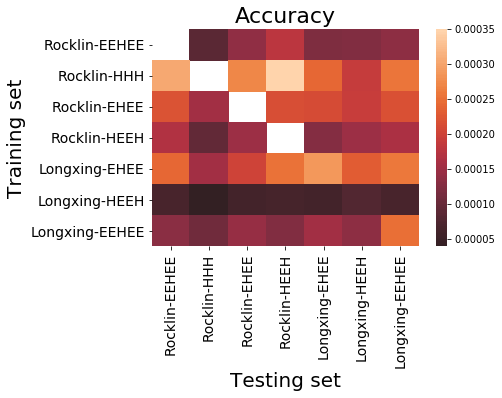

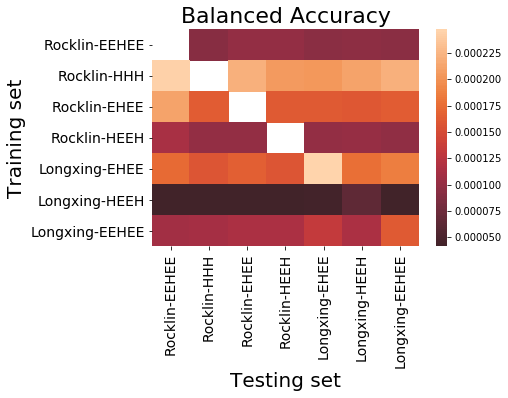

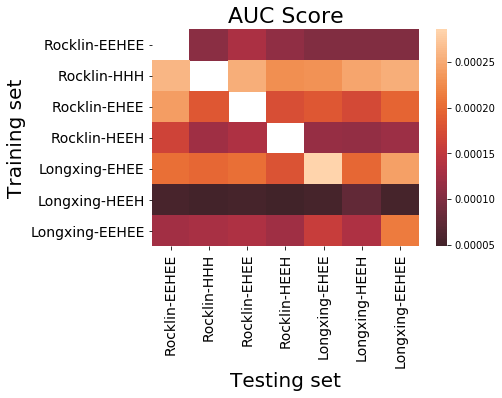

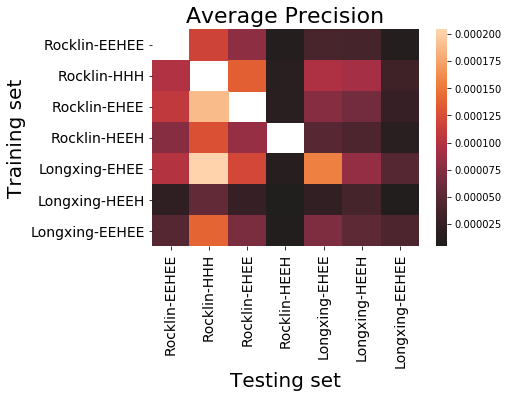

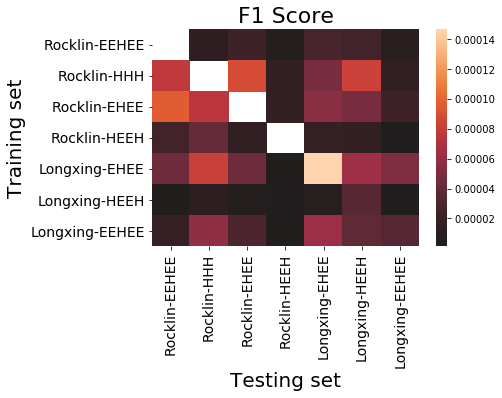

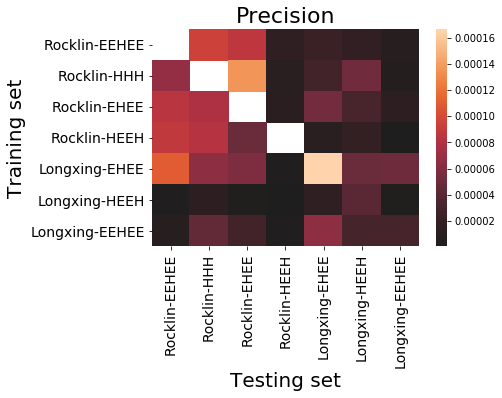

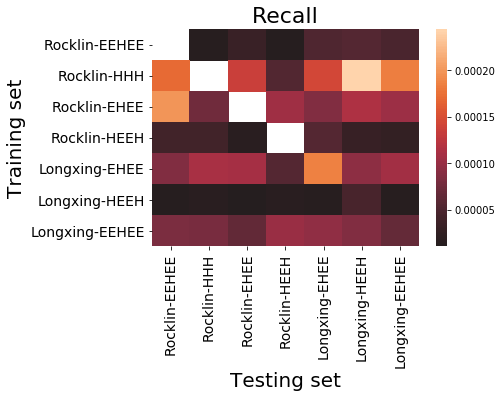

In [87]:
# im trying it again but dividing by Samples in Training set
for m in range(len(metric_list)):
    topology_list = list(top_specific_leaderboard_rocklin['topology'].unique())+list(top_specific_leaderboard_longxing['topology'].unique()) # list of unique topologies

    metric = metric_list[m] # metric to visualize
    description = "RS" # contains Rosetta and Entropy features



    matrix = []
    for i in range(len(topology_list)):
        # init empty list for storing each row
        row = []

        train_topology = topology_list[i]
        #print("train: ",train_topology)
        for j in range(len(topology_list)):
            test_topology = topology_list[j]
            #print("test: ",test_topology)
            if train_topology==test_topology:
                #print("\tusing top_specific")
                df_description = top_specific_leaderboard[top_specific_leaderboard["Data and Split Description"]==description]
                df_description = df_description[df_description['topology']==train_topology]

            else:
                #print("\tusing heatmap_leaderboard")
                df_description = heatmap_leaderboard[heatmap_leaderboard["Data and Split Description"]==description]
                df_description = df_description[df_description['train topology']==train_topology]
                df_description = df_description[df_description["test topology"]==test_topology]

            row.append(
                df_description[metric].mean()/df_description["Samples In Train"].mean()
            )

        matrix.append(row)


    plt.title(f"{metric}",fontsize='22')
    sns.heatmap(matrix, xticklabels=topology_list, yticklabels=topology_list,annot=False,center=0)
    plt.xticks(fontsize='14')
    plt.yticks(fontsize='14')
    plt.ylabel("Training set",fontsize='20')
    plt.xlabel("Testing set",fontsize='20')
    plt.show()
    plt.close("all")


## Factored by ratio of stable to unstable in training set

In [89]:
# im trying it again but dividing by Samples in Training set
for m in range(len(metric_list)):
    topology_list = list(top_specific_leaderboard_rocklin['topology'].unique())+list(top_specific_leaderboard_longxing['topology'].unique()) # list of unique topologies

    metric = metric_list[m] # metric to visualize
    description = "RS" # contains Rosetta and Entropy features



    matrix = []
    for i in range(len(topology_list)):
        # init empty list for storing each row
        row = []

        train_topology = topology_list[i]
        #print("train: ",train_topology)
        for j in range(len(topology_list)):
            test_topology = topology_list[j]
            #print("test: ",test_topology)
            if train_topology==test_topology:
                #print("\tusing top_specific")
                df_description = top_specific_leaderboard[top_specific_leaderboard["Data and Split Description"]==description]
                df_description = df_description[df_description['topology']==train_topology]

            else:
                #print("\tusing heatmap_leaderboard")
                df_description = heatmap_leaderboard[heatmap_leaderboard["Data and Split Description"]==description]
                df_description = df_description[df_description['train topology']==train_topology]
                df_description = df_description[df_description["test topology"]==test_topology]

            
            n_stable = master_dataframe[master_dataframe['topology']==train_topology]["stabilityscore_cnn_calibrated_2classes"].value_counts()[1]
            n_unstable = master_dataframe[master_dataframe['topology']==train_topology]["stabilityscore_cnn_calibrated_2classes"].value_counts()[0]

            
            row.append(
                df_description[metric].mean()/(n_stable/n_unstable)
            )

        matrix.append(row)


    plt.title(f"{metric}",fontsize='22')
    sns.heatmap(matrix, xticklabels=topology_list, yticklabels=topology_list,annot=False,center=0)
    plt.xticks(fontsize='14')
    plt.yticks(fontsize='14')
    plt.ylabel("Training set",fontsize='20')
    plt.xlabel("Testing set",fontsize='20')
    plt.show()
    plt.close("all")


IndexError: index out of bounds

## Heatmap for only Rocklin dataset

In [90]:
heatmap_leaderboard["Data and Split Description"].value_counts()

RS    336
R     336
S     336
Name: Data and Split Description, dtype: int64

In [91]:
top_specific_leaderboard_rocklin['topology'].unique()

array(['Rocklin-EEHEE', 'Rocklin-HHH', 'Rocklin-EHEE', 'Rocklin-HEEH'],
      dtype=object)

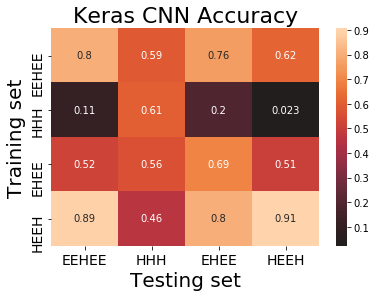

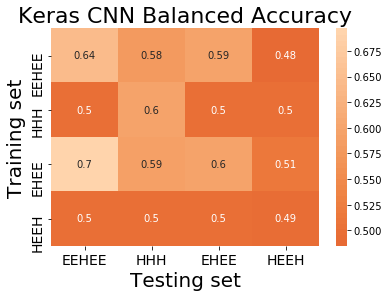

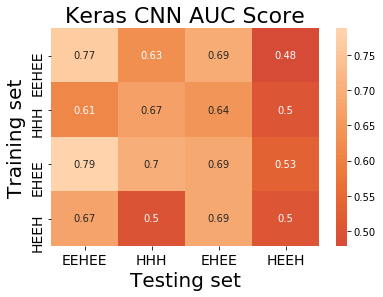

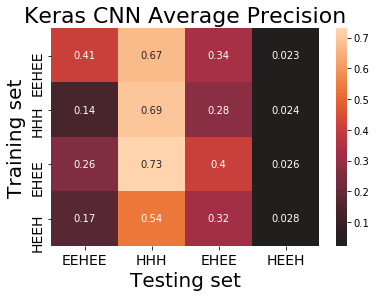

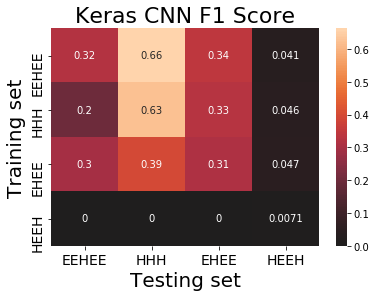

...

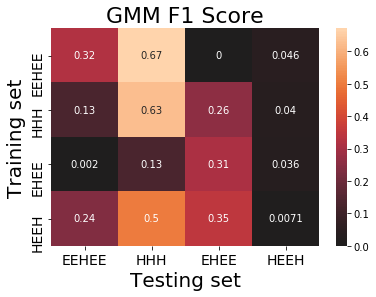

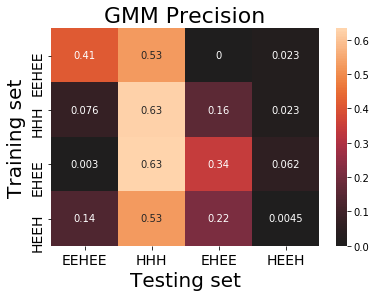

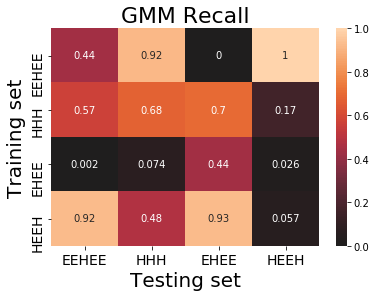

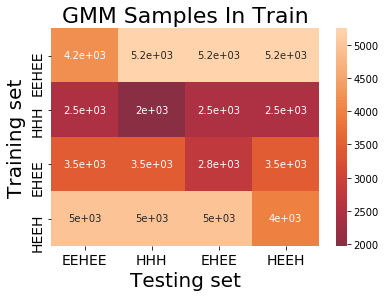

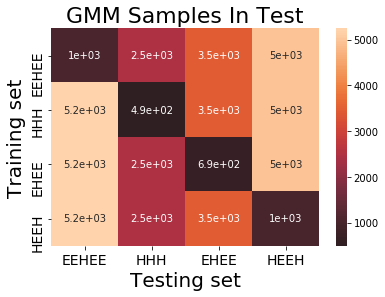

In [92]:
# read in results of combinatorial runs
heatmap_leaderboard = pd.read_html("./data/heatmap_leaderboard.html")[0]
heatmap_leaderboard["Model Name"] = heatmap_leaderboard["Model Name"].replace("__init__","Keras CNN")

# read in results of topoly specific runs for Rocklin
top_specific_leaderboard_rocklin = pd.read_html("./data/top_specific_Rocklin_leaderboard.html")[0]


# dataset used
master_dataframe = pd.read_csv("./data/df_aggregated_spc.csv")
master_dataframe['stabilityscore_cnn_calibrated_2classes'] = master_dataframe["stabilityscore_cnn_calibrated"] > 1

# split up the "RS Rocklin-HHH Rocklin-EHEE"-like column into ["RS","Rocklin-HHH","Rocklin-EHEE"] then only keep the "RS" part
data_description = heatmap_leaderboard["Data and Split Description"].apply(lambda x: x.split()[0])



# split up the "RS Rocklin-HHH Rocklin-EHEE"-like column into ["RS","Rocklin-HHH","Rocklin-EHEE"] then only keep the topology part
train_topology_col = heatmap_leaderboard["Data and Split Description"].apply(lambda x: x.split()[1])
test_topology_col = heatmap_leaderboard["Data and Split Description"].apply(lambda x: x.split()[2])


heatmap_leaderboard["Data and Split Description"] = data_description

heatmap_leaderboard["train topology"] = train_topology_col.apply(lambda x: x.split("-")[1])
heatmap_leaderboard["test topology"] = test_topology_col.apply(lambda x: x.split("-")[1])

heatmap_leaderboard["train dataset"] = train_topology_col.apply(lambda x: x.split("-")[0])
heatmap_leaderboard["test dataset"] = test_topology_col.apply(lambda x: x.split("-")[0])
                                                               
# reduce dataset to only include rocklin data
heatmap_leaderboard = heatmap_leaderboard[heatmap_leaderboard["train dataset"]=="Rocklin"]
heatmap_leaderboard = heatmap_leaderboard[heatmap_leaderboard["test dataset"]=="Rocklin"]
                                                               
                                                               
                                                               

# Fix the Rocklin, topology specific runs so that they can fit into heatmap
# split up the "RS HHH"-like column into ["RS","HHH"] then only keep the "RS" part
data_description = top_specific_leaderboard_rocklin["Data and Split Description"].apply(lambda x: x.split()[0])



# split up the "RS HHH"-like column into ["RS","HHH"] then only keep the topology part
topology_col = top_specific_leaderboard_rocklin["Data and Split Description"].apply(lambda x: x.split()[1])



top_specific_leaderboard_rocklin["Data and Split Description"] = data_description
top_specific_leaderboard_rocklin["topology"] = topology_col



# all classification model metrics
metric_list = list(heatmap_leaderboard.columns[6:-12])

## Raw results

translator = {
    "svm_classification":"SVM",
    "random_forest_classification":"RFC",
    'Keras CNN':"Keras CNN",
    "gbc_classification":"GBC",
    "knn_classifier":"K-NN",
    "naive_bayes_classification":"NBC",
    "decision_tree_classification":"DTC",
    "gmm_classification":"GMM"
    
}

sns.reset_orig()

for model in heatmap_leaderboard["Model Name"].unique():

    model_heatmap_leaderboard = heatmap_leaderboard[heatmap_leaderboard["Model Name"]==model]

    for m in range(len(metric_list)):

        # list of unique topologies
        topology_list = list(top_specific_leaderboard_rocklin['topology'].unique())

        metric = metric_list[m] # metric to visualize
        #description = "RS" # contains Rosetta and Entropy features
        description = "S" # contains only Entropy features



        matrix = []
        for i in range(len(topology_list)):
            # init empty list for storing each row
            row = []

            train_topology = topology_list[i]
#             print("train: ",train_pair)
            for j in range(len(topology_list)):
                test_topology = topology_list[j]
                


                #print("test: ",test_topology)
                if train_topology==test_topology:
#                     print("\tusing top_specific")
#                     print("train topology: ",train_topology)
                    top_specific_leaderboard = top_specific_leaderboard_rocklin

                    df_description = top_specific_leaderboard[top_specific_leaderboard["Data and Split Description"]==description]
                    df_description = df_description[df_description['topology']==train_topology]

                else:
#                     print("\tusing model_heatmap_leaderboard")
                    df_description = model_heatmap_leaderboard[model_heatmap_leaderboard["Data and Split Description"]==description]
                    df_description = df_description[df_description['train topology']==train_topology]
                    df_description = df_description[df_description["test topology"]==test_topology]

                row.append(
                    df_description[metric].mean()
                )

            matrix.append(row)


        plt.title(f"{translator[model]} {metric}",fontsize='22')
        sns.heatmap(matrix, xticklabels=topology_list, yticklabels=topology_list,annot=True,center=0)
        plt.xticks(fontsize='14')
        plt.yticks(fontsize='14')
        plt.ylabel("Training set",fontsize='20')
        plt.xlabel("Testing set",fontsize='20')
        plt.show()
        plt.close("all")


# Model Audits

--------------------

### Generalized Models

In [20]:
#load names for entropy and rosetta features
ros_features = pd.read_csv('./data/rosetta_features.csv')["0"].to_list()
spc_features = pd.read_csv('./data/entropy_features.csv')["0"].to_list()

genModel_clf_shap = pd.read_csv('./data/model_audits/SHAP_genModel_clf_feature_importances.csv')
genModel_clf_shap['is_rosetta'] = genModel_clf_shap["Feature"].isin(ros_features)

genModel_rgr_shap = pd.read_csv('./data/model_audits/SHAP_genModel_rgr_feature_importances.csv')
genModel_rgr_shap['is_rosetta'] = genModel_rgr_shap["Feature"].isin(ros_features)


In [21]:
#classifier model results
genModel_clf_shap[genModel_clf_shap['is_rosetta']==False]

,Feature,Importance,is_rosetta
58,Mean_L_entropy,0.001489,False
68,H_range_entropy,0.001100,False
69,E_min_entropy,0.001099,False
80,SumL_entropies,0.000886,False
81,L_min_entropy,0.000859,False
82,E_range_entropy,0.000857,False
84,E_max_entropy,0.000843,False
85,Mean_H_entropy,0.000777,False
89,H_max_entropy,0.000707,False
90,SumE_entropies,0.000701,False


In [22]:
#regressor model results
genModel_rgr_shap[genModel_rgr_shap['is_rosetta']==False]

,Feature,Importance,is_rosetta
49,Mean_L_entropy,0.002234,False
66,H_max_entropy,0.001493,False
68,L_min_entropy,0.001476,False
71,H_range_entropy,0.001408,False
74,L_max_entropy,0.001325,False
79,Mean_E_entropy,0.001177,False
81,Mean_H_entropy,0.001158,False
83,SumH_entropies,0.001124,False
85,L_range_entropy,0.001083,False
86,Mean_res_entropy,0.001069,False


### Topology Specific Models

In [23]:
# load audit files
shap_4h_clf = pd.read_csv('./data/model_audits/SHAP_4h_clf_feature_importances.csv')
shap_betag_clf = pd.read_csv('./data/model_audits/SHAP_beta_grasp_clf_feature_importances.csv')
shap_coil_clf = pd.read_csv('./data/model_audits/SHAP_coil_clf_feature_importances.csv')
shap_EEHEE_clf = pd.read_csv('./data/model_audits/SHAP_EEHEE_clf_feature_importances.csv')
shap_EHEE_clf = pd.read_csv('./data/model_audits/SHAP_EHEE_clf_feature_importances.csv')
shap_ferr_clf = pd.read_csv('./data/model_audits/SHAP_ferredoxin_clf_feature_importances.csv')
shap_fold2_clf = pd.read_csv('./data/model_audits/SHAP_fold2_clf_feature_importances.csv')
shap_fold4_clf = pd.read_csv('./data/model_audits/SHAP_fold4_clf_feature_importances.csv')
shap_HEEH_clf = pd.read_csv('./data/model_audits/SHAP_HEEH_clf_feature_importances.csv')
shap_HHH_clf = pd.read_csv('./data/model_audits/SHAP_HHH_clf_feature_importances.csv')
shap_thio_clf = pd.read_csv('./data/model_audits/SHAP_thio_clf_feature_importances.csv')

# create a list with all results and corresponding topology names
shap_df_list = [
    shap_4h_clf,shap_betag_clf,shap_coil_clf,shap_EEHEE_clf,
    shap_EHEE_clf,shap_ferr_clf,shap_fold2_clf,shap_fold4_clf,
    shap_HEEH_clf,shap_HHH_clf,shap_thio_clf
]
shap_df_list_names = ['4h','beta_grasp','coil','EEHEE','EHEE','ferredoxin','fold2','fold4','HEEH','HHH','thio']

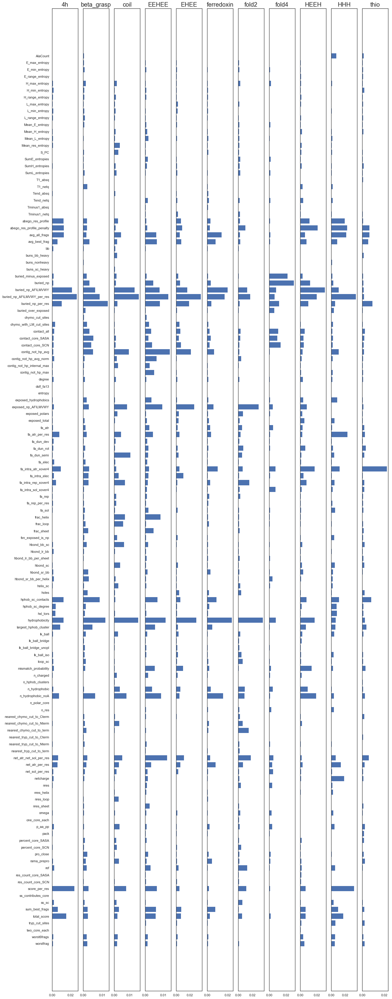

In [24]:
# uncomment below if you want to see the numbers per each topology 

# for i in range(len(shap_df_list)):
#     print("Topology: %s"%shap_df_list_names[i])
#     print(rank_features(shap_df_list[i],just_entropy=True))
#     print("")


## create subplots with a horizontal barplot for each topology, sorted by Feature name
## Extract where in the percentile the entropy features are, for a future visualization

#initialize subplots and create empty list for extracting 
index = shap_df_list_names
data = []
sns.set_style('white')
f,ax = plt.subplots(nrows=1,ncols=len(shap_df_list),figsize=(20,60))


for i in range(len(shap_df_list)): #iterate through each topology's feature importance
    #extract percentiles data
    df = shap_df_list[i]
    data.append(get_count_percentiles_list(df)) # 'get_count_percentiles' returns a list of the number of entropy features in a given percentile list
    
    #plot results from current audit
    plot_data = df.sort_values('Feature',ascending=False)
    ax[i].barh(width=plot_data['Importance'],y=plot_data['Feature'])
    ax[i].set_title("%s"%shap_df_list_names[i],fontsize="20")
    ax[i].get_yaxis().set_visible(False)

ax[0].get_yaxis().set_visible(True)
    
summary_df = pd.DataFrame(data=data,index=index,columns=['35th','50th','75th','85th'])

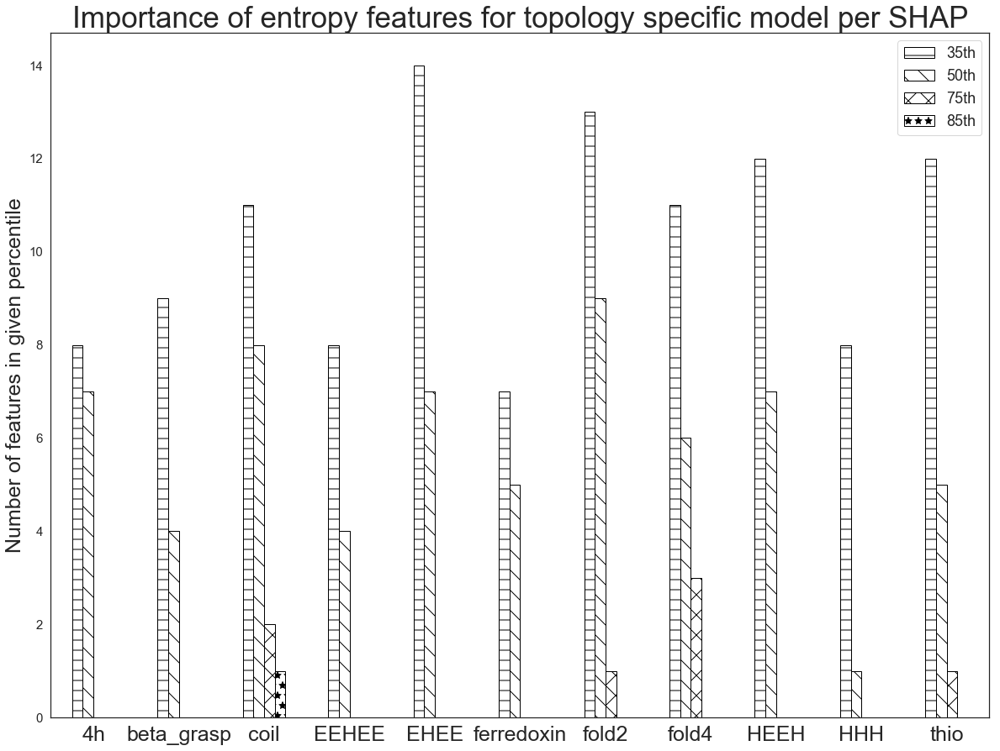

In [25]:
plt.close('all')
sns.set_style('white')
f, ax = plt.subplots(figsize=(20,15))

#plot the percentiles count
summary_df.plot(kind='bar',facecolor='none',edgecolor='black',ax=ax)

#label the graph
sns.set_style('white')
ax.grid(False)
plt.xticks(rotation=0,fontsize='25')
plt.yticks(fontsize='15')
plt.ylabel('Number of features in given percentile',fontsize='25')
plt.title('Importance of entropy features for topology specific model per SHAP',fontsize='35')

bars = ax.patches


# Define some hatches
hatches = ['-', '\\', 'x',"*"]

dash_bars_inx = list(range(11))
slash_bars_inx = list(range(11,22))
x_bars_inx = list(range(22,33))
asterisk_bars_inx = list(range(33,44))

inx_list = [dash_bars_inx,slash_bars_inx,x_bars_inx,asterisk_bars_inx]

#change colors in graph to hatches
for i in range(len(inx_list)):
    hatch_type = hatches[i]
    for j in inx_list[i]:
        bars[j].set_hatch(hatch_type)
        
plt.legend(fontsize='18')

plt.show()

## BlackBoxAuditing (BBA)

### Generalized Models

In [26]:
genModel_clf_bba = pd.read_csv('./data/model_audits/BBA_genModel_clf_feature_importances.csv')
genModel_clf_bba['is_rosetta'] = genModel_clf_bba["Feature"].isin(ros_features)

#classifier model results
genModel_clf_bba[genModel_clf_bba['is_rosetta']==False]

,Feature,Importance,is_rosetta
95,S_PC,0.066113,False
96,Mean_H_entropy,0.066113,False
97,Mean_L_entropy,0.066113,False
98,Mean_E_entropy,0.066113,False
99,Mean_res_entropy,0.066113,False
100,SumH_entropies,0.066113,False
101,SumL_entropies,0.066113,False
102,SumE_entropies,0.066113,False
103,H_min_entropy,0.066113,False
104,H_range_entropy,0.066113,False


In [27]:
# Given the large number of equally most important features per BBA audit, how many of those are Rosetta 
# and how many are configurational entropy features?

max_score = genModel_clf_bba['Importance'].unique()[0]
max_fets = genModel_clf_bba[genModel_clf_bba['Importance']==max_score]
bba_count_ros_fets = len(max_fets[max_fets['is_rosetta']==True])
bba_count_spc_fets = len(max_fets[max_fets['is_rosetta']==False])

print("Most Important per BBA Audit:\n\tcount Rosetta: %s\n\tcount Scnf: %s"%(bba_count_ros_fets,bba_count_spc_fets))

Most Important per BBA Audit:
	count Rosetta: 95
	count Scnf: 16


### Topology Specific Models

In [28]:
bba_4h_clf = pd.read_csv('./data/model_audits/BBA_4h_clf_feature_importances.csv')
bba_betag_clf = pd.read_csv('./data/model_audits/BBA_beta_grasp_clf_feature_importances.csv')
bba_coil_clf = pd.read_csv('./data/model_audits/BBA_coil_clf_feature_importances.csv')
bba_EEHEE_clf = pd.read_csv('./data/model_audits/BBA_EEHEE_clf_feature_importances.csv')
bba_EHEE_clf = pd.read_csv('./data/model_audits/BBA_EHEE_clf_feature_importances.csv')
bba_ferr_clf = pd.read_csv('./data/model_audits/BBA_ferredoxin_clf_feature_importances.csv')
bba_fold2_clf = pd.read_csv('./data/model_audits/BBA_fold2_clf_feature_importances.csv')
bba_fold4_clf = pd.read_csv('./data/model_audits/BBA_fold4_clf_feature_importances.csv')
bba_HEEH_clf = pd.read_csv('./data/model_audits/BBA_HEEH_clf_feature_importances.csv')
bba_HHH_clf = pd.read_csv('./data/model_audits/BBA_HHH_clf_feature_importances.csv')
bba_thio_clf = pd.read_csv('./data/model_audits/BBA_thio_clf_feature_importances.csv')

bba_df_list = [
    bba_4h_clf,bba_betag_clf,bba_coil_clf,bba_EEHEE_clf,
    bba_EHEE_clf,bba_ferr_clf,bba_fold2_clf,bba_fold4_clf,
    bba_HEEH_clf,bba_HHH_clf,bba_thio_clf
]

bba_df_list_names = ['4h','beta_grasp','coil','EEHEE','EHEE','ferredoxin','fold2','fold4','HEEH','HHH','thio']


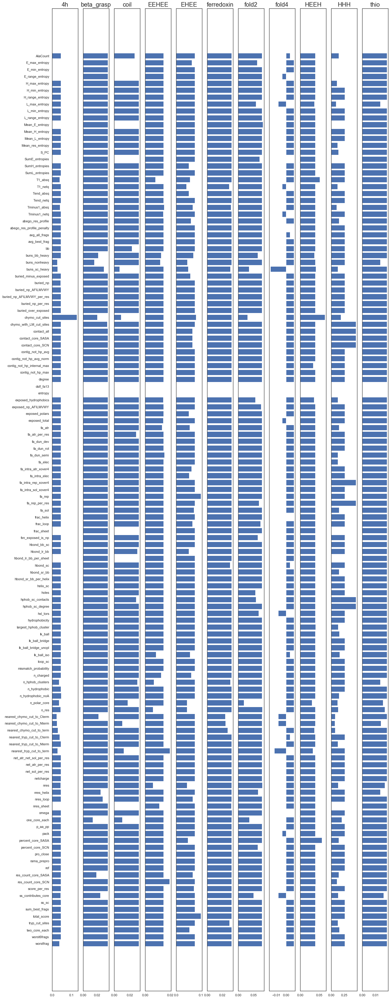

In [29]:
# for i in range(len(bba_df_list)):
#     print("Topology: %s"%bba_df_list_names[i])
#     print(rank_features(bba_df_list[i],just_entropy=False))
#     print("")

index = bba_df_list_names
data = []
sns.set_style("white")
f, ax = plt.subplots(nrows=1,ncols=len(bba_df_list),figsize=(20,60))
for i in range(len(bba_df_list)):
    df = bba_df_list[i]
    data.append(get_count_percentiles_list(df)) # do not delete this part
    
    sns.set_style('white')
    plot_data = df.sort_values('Feature',ascending=False)
    ax[i].barh(width=plot_data['Importance'],y=plot_data['Feature'])
    ax[i].set_title("%s"%bba_df_list_names[i],fontsize="20")
    ax[i].get_yaxis().set_visible(False)
ax[0].get_yaxis().set_visible(True)

summary_df = pd.DataFrame(data=data,index=index,columns=['35th','50th','75th','85th'])

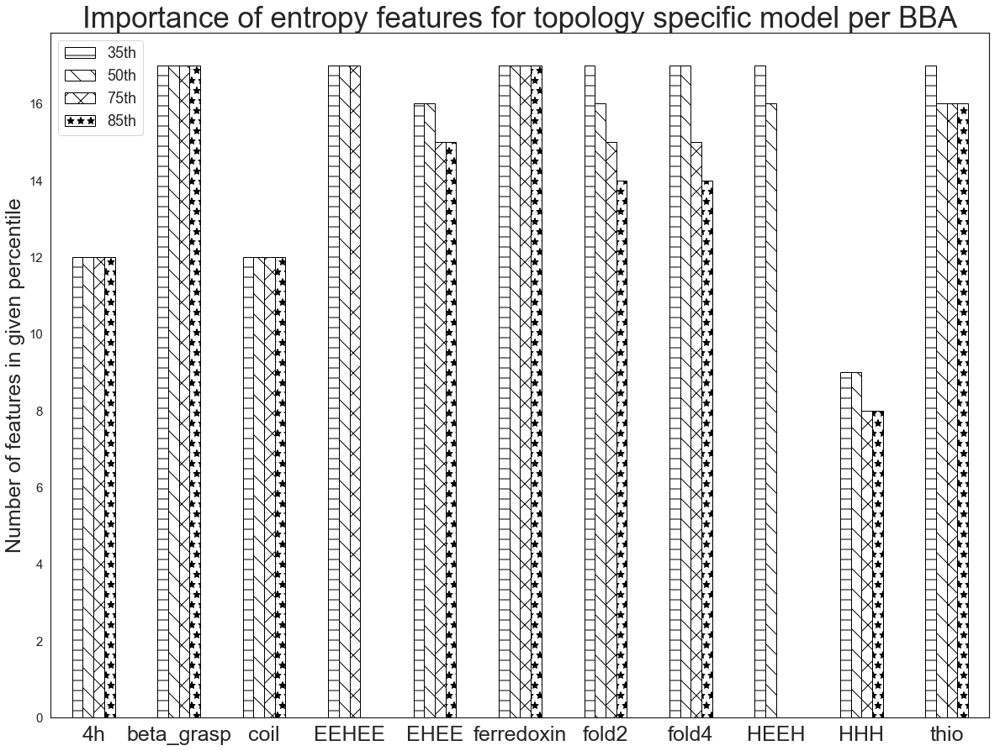

In [30]:
plt.close('all')
f, ax = plt.subplots(figsize=(20,15))

#plot the percentiles count
summary_df.plot(kind='bar',facecolor='none',edgecolor='black',ax=ax)

#label the graph
sns.set_style('white')
ax.grid(False)
plt.xticks(rotation=0,fontsize='25')
plt.yticks(fontsize='15')
plt.ylabel('Number of features in given percentile',fontsize='25')
plt.title('Importance of entropy features for topology specific model per BBA',fontsize='35')

bars = ax.patches


# Define some hatches
hatches = ['-', '\\', 'x',"*"]

dash_bars_inx = list(range(11))
slash_bars_inx = list(range(11,22))
x_bars_inx = list(range(22,33))
asterisk_bars_inx = list(range(33,44))

# dash_bars_inx = list(range(10))
# slash_bars_inx = list(range(10,20))
# x_bars_inx = list(range(20,30))
# asterisk_bars_inx = list(range(30,40))




inx_list = [dash_bars_inx,slash_bars_inx,x_bars_inx,asterisk_bars_inx]

#change colors in graph to hatches
for i in range(len(inx_list)):
    hatch_type = hatches[i]
    for j in inx_list[i]:
        bars[j].set_hatch(hatch_type)
        
plt.legend(fontsize='18')

plt.show()